In [209]:
# Import Libraries
%matplotlib inline
import numpy as np, matplotlib.pyplot as plt, seaborn as sns, keras_tuner as kt, tensorflow as tf
import os, datetime, progressbar
import tensorflow_probability as tfp

tfd = tfp.distributions

from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Dropout, Flatten, BatchNormalization, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import to_categorical, plot_model
from keras.callbacks import ModelCheckpoint#, TensorBoard                                                                      
from keras import backend as K
from livelossplot import PlotLossesKeras

from keras_tuner.tuners import RandomSearch
from keras_tuner.engine.hypermodel import HyperModel
from keras_tuner.engine.hyperparameters import HyperParameters
#from tensorboard.plugins.hparams import api as hp                                                                             
#from keras.utils.generic_utils import get_custom_objects                                                                      

import gc
gc.enable()

hp = HyperParameters()
plotlosses = PlotLossesKeras()

In [2]:
pwd

'/Users/tashaleebillings/Desktop/Tasha_Desktop/ThesisResearch/ML/notebooks'

In [3]:
ls -lrt

total 54676384
-rw-r--r--@  1 tashaleebillings  staff      9733350 Jul  7  2020 filter_vis.ipynb
-rw-r--r--   1 tashaleebillings  staff      3077544 Jul  7  2020 Meeting_03_13_2020.ipynb
drwxr-xr-x@  6 tashaleebillings  staff          192 Jul 11  2020 learning/
-rw-r--r--   1 tashaleebillings  staff     82000524 Sep 23 15:54 toy_models_32x32.npz
-rw-r--r--   1 tashaleebillings  staff        24387 Oct 11 16:22 Bayesian_Toy_Model.ipynb
-rw-r--r--   1 tashaleebillings  staff      2623533 Oct 13 08:41 Bayesian_Toy_Model_1.ipynb
drwxr-xr-x@ 29 tashaleebillings  staff          928 Oct 25 16:55 toy_model_tuner/
-rw-r--r--   1 tashaleebillings  staff       157960 Oct 25 16:56 hyperParam_weights_5.h5
-rw-r--r--   1 tashaleebillings  staff       495008 Oct 25 16:56 hyperParam_model_5.h5
-rw-r--r--   1 tashaleebillings  staff       468208 Oct 25 16:56 hyperParam_weights_6.h5
-rw-r--r--   1 tashaleebillings  staff      1425984 Oct 25 16:56 hyperParam_model_6.h5
-rw-r--r--   1 tashaleebillings  sta

In [4]:
toy_model = np.load('toy_models_32x32.npz')
nx, ny, ntrain = toy_model['training_data'].shape
training_data = toy_model['training_data'].T
labels = toy_model['labels']
outputdir = "./"
project_name='toy_model_tuner_32'
idx = "32"

HP_EPOCH = 30
HP_BATCH_SIZE = 5
factor = 100
num_models = 25

In [5]:
X_train = training_data[0:8000,:,:].reshape(8000,nx,ny,1)
y_train = labels[0:8000]*factor
X_test = training_data[8000:,:,:].reshape(2000,nx,ny,1)
y_test = labels[8000:]*factor

print("training", X_train.shape)
print("validation", X_test.shape)

NUM_TRAIN_EXAMPLES = len(training_data)
kl_divergence_function = (
lambda q, p, _: tfd.kl_divergence(q, p) / tf.cast(NUM_TRAIN_EXAMPLES,dtype=tf.float32)
)

training (8000, 32, 32, 1)
validation (2000, 32, 32, 1)


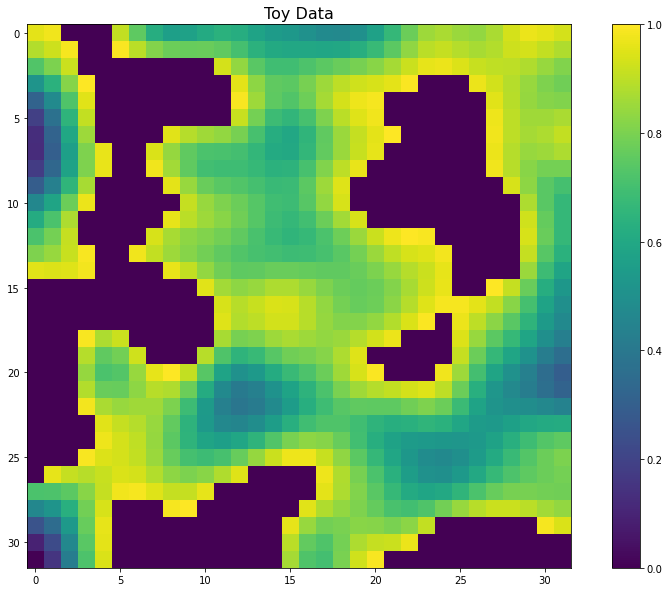

In [6]:
plt.figure(figsize=(15, 10))
plt.imshow(X_train[0,:,:,0])
plt.title("Toy Data",size = 16 )
plt.colorbar()
#plt.legend()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


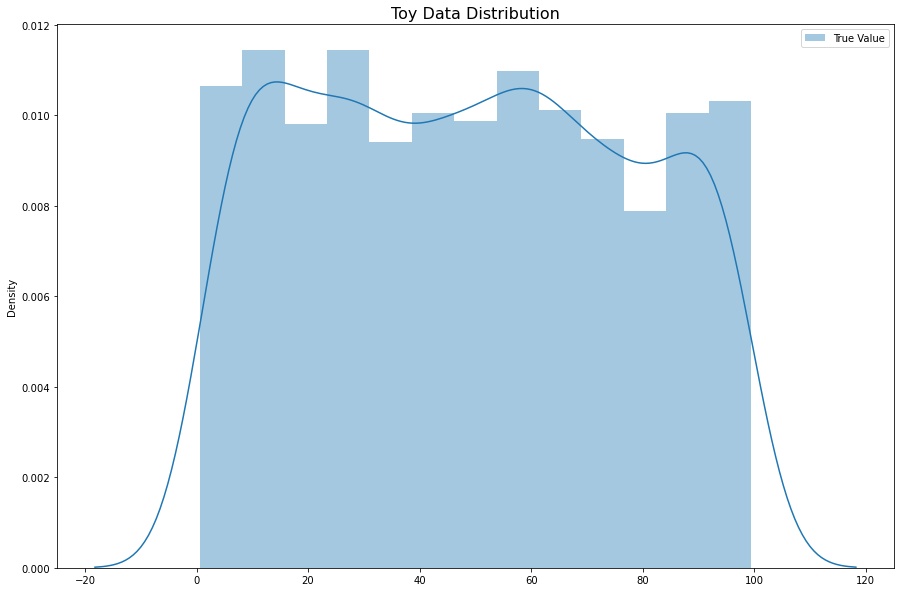

In [7]:
plt.figure(figsize=(15, 10))
sns.distplot(y_test,label="True Value")
plt.title("Toy Data Distribution",size = 16 )
#plt.xlim([0, 1.25])
plt.legend()

In [8]:
# Custom Loss Functions                                                                                                               
kl_divergence = tf.keras.losses.KLDivergence()

neg_log_likelihood = lambda y_true, y_pred: -tf.reduce_mean(input_tensor=y_pred.log_prob(y_true))

def Mean_Squared_over_true_Error(y_true, y_pred):
    # Create a custom loss function that divides the difference by the true

    y_true = K.cast(y_true, y_pred.dtype) #Casts a tensor to a different dtype and returns it.
    diff_ratio = K.square((y_pred - y_true)/K.clip(K.abs(y_true),K.epsilon(),None))

    loss = K.mean(diff_ratio, axis=-1)

    # Return a tensor
    return loss

def elbo(y_true, y_pred):
    kl_weight = 1
    neg_log_likelihood = -tf.reduce_mean(input_tensor=y_pred.log_prob(y_true))
    kl_divergence = tf.keras.losses.KLDivergence()

    elbo_loss = -tf.math.reduce_mean(-kl_weight * kl_divergence(y_true, y_pred.mean()) - neg_log_likelihood)
    # Return a tensor
    return elbo_loss

def mean_fractional_error(y_true, y_pred):
    y_true = K.cast(y_true, y_pred.dtype) #Casts a tensor to a different dtype and returns it.
    diff_ratio = (y_pred - y_true)/K.clip(K.abs(y_true),K.epsilon(),None)
    loss = K.mean(diff_ratio, axis=-1)
    
    return loss

keras.utils.get_custom_objects().update({'Mean_Squared_over_true_Error':Mean_Squared_over_true_Error,
                                        'neg_log_likelihood': neg_log_likelihood, 'kl_divergence':kl_divergence,
                                        'elbo':elbo})
    

In [9]:
def estimate_coef(x, y):
    # number of observations/points
    n = np.size(x)

    # mean of x and y vector
    m_x, m_y = np.mean(x), np.mean(y)

    # calculating cross-deviation and deviation about x
    SS_xy = np.sum(y*x) - n*m_y*m_x
    SS_xx = np.sum(x*x) - n*m_x*m_x

    # calculating regression coefficients
    b_1 = SS_xy / SS_xx
    b_0 = m_y - b_1*m_x

    return [b_0, b_1]
    
def plot_regression(x, y, b, labelname):
    # plotting the actual points as scatter plot
    plt.figure(figsize=(15,15))
    plt.title(labelname)
    plt.scatter(x,y, s=6, lw=0, alpha=0.9)

    # predicted response vector
    y_pred = b[0] + b[1]*x

    # plotting the regression line
    plt.plot(x, y_pred, 'k--',lw=5,alpha=1.0)
    
    # Plot trendline
    xx = np.linspace(0.95*np.min(x), 1.05*np.max(x), 1000)
    plt.plot(xx, xx, 'r--',lw=5,alpha=1.0)

    # putting labels
    plt.xlabel('True Optical Depth', size = 16)
    plt.ylabel('Prediction', size=16)
    
    #plt.legend(markerscale=2.5)
    plt.tight_layout()

    # Save plot
    #plt.savefig(outputdir+"residual_{}.png".format(str(fold)))
    #plt.clf()

# Plot Slope and y-intercept distribution
def statistics_plot_coef(coefficient):
    coefficients = np.array(coefficient,dtype=np.float64)
    plt.plot(np.arange(1,11),coefficients,'o')
    mean_value = np.mean(coefficients,axis=0)
    mean = np.zeros_like(coefficients)
    mean[:,0]=mean_value[0]
    mean[:,1]=mean_value[1]
    plt.plot(np.arange(1,11),mean,'k--',lw=1,markersize=4)
    plt.text(5.0, 0.2, r'$\mu$ vector [b_0 , b_1]: '+str(mean_value),
            {'color': 'blue', 'fontsize': 10, 'ha': 'center', 'va': 'center',
            'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.2)})
            
    plt.xlabel("Fold Number")
    plt.ylabel("Distance from Mean")
    #plt.savefig(outputdir+"bestmodel_residual_of_mean.png")
    plt.clf()

# Plot values of the deviation from the mean
def statistics_plot_dev(coefficient):
    coefficients = np.array(coefficient,dtype=np.float64)

    plt.figure(figsize=(13,8))
    plt.plot(np.arange(1,11),coefficients,'o')
    mean_value = np.mean(coefficients,axis=0)
    mean = np.zeros_like(coefficients)
    mean[:,0]=mean_value[0]
    mean[:,1]=mean_value[1]
    plt.plot(np.arange(1,11),mean,'k--',lw=1,markersize=4)
    plt.text(5.0, 0.2, r'$\mu$ vector [b_0 , b_1]: '+str(mean_value),
            {'color': 'blue', 'fontsize': 10, 'ha': 'center', 'va': 'center',
            'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.2)})
    for indx, coef in enumerate(coefficients[:,1]):
        diff = (coef-mean_value[1])/2
        plt.vlines(indx+1,coef,mean_value[1],colors='r',linestyles= 'dashed')
        plt.text(indx+1.25, coef-diff, r'%.2f' % diff,
        {'color': 'red', 'fontsize': 10, 'ha': 'center', 'va': 'center'})

    plt.xlabel("Fold Number")
    plt.ylabel("Distance from Mean")
    #plt.savefig(outputdir+"bestmodel_residual_of_mean_dev.png")
    plt.clf()

def main(x, y, labelname):
    # Read in observations
    #x = read_results(filename)[0]
    #y = read_results(filename)[1]

    # estimating coefficients
    b = estimate_coef(x, y)
    coefficients.append(b)
    print("Estimated coefficients:\nb_0 = {} \
        \nb_1 = {}".format(b[0], b[1]))
        
    # write the coefficients to some text file
    fp.write(str(b)+"\n")

    # plotting regression line
    plot_regression(x, y, b, labelname)
    return


# Model 1

## Monte Carlo 



In [210]:
if os.path.isdir(project_name): # check to see if path exists
    os.system("rm -rvf {}".format(project_name))

def train_test_og_model(hp):
    # Making a model.                                                                                                                                                                       
    model = Sequential()
    
    model.add(tfp.layers.Convolution2DFlipout(filters = 16, 
                                              input_shape=(nx, ny, 1), kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              #, padding = 'same'
                                             ))
    model.add(tfp.layers.Convolution2DFlipout(filters = 8, 
                                              kernel_size=3, activation = 'relu', 
                                              kernel_divergence_fn=kl_divergence_function,
                                              #padding = 'same'
                                             ))
    model.add(Flatten())
    model.add(tfp.layers.DenseFlipout(1, activation="linear", kernel_divergence_fn=kl_divergence_function,))
    
    #for l in range(hp.Int('loss', 0, len(losses))):
    model.compile(optimizer= "adam", loss = hp.Choice('loss_type', ["mse", "mae", "mape", "Mean_Squared_over_true_Error"], ordered=False, default="mse"), metrics=["mse"])
    
    # Visualize Model                                                                                                                                                                      
    print(model.summary())
    
    return model#, history
                                                                                                                                                                                      
#model = train_test_model(hp)
# Start Tuning based on low validation loss
tuner = RandomSearch(train_test_og_model,
                     objective='val_loss', # 'loss', 'val_loss', 'val_accuracy'
                     max_trials= num_models,# specify the number of different models to try
                     executions_per_trial=1, #2,
                     directory=outputdir,
                     seed=42,
                     project_name=project_name)

# Print a summary of the search space
tuner.search_space_summary()

# Show the best models, their hyperparameters, and the resulting metrics.
tuner.search(X_train, y_train, 
             epochs=30,#hp.Int('epoch',min_value=10,max_value=HP_EPOCH,step=10,default=10), 
             validation_data=(X_test, y_test),
             batch_size=HP_BATCH_SIZE,
            #callbacks=[plotlosses],
            verbose=1)
tuner.results_summary()

# Retrieve the best model.
best_model = tuner.get_best_models(num_models=1)[0]
"""
# Save best hyperperam Model
print("saving best hyperparameter model ...")
best_model.save(outputdir+"hyperParam_model_256.h5")

# Save best hyperperam Model Weights
print("saving best hyperparameter model weights ...")
best_model.save_weights(outputdir+"hyperParam_model_weights_256.h5")


# Save all other models so that we can see how the model behaves based on complexity
for indx in np.arange(len(tuner.get_best_models(num_models=20))):
    model_ = tuner.get_best_models(num_models=num_models)[indx]
    # Save Model weights
    model_.save_weights(outputdir+"hyperParam_weights_{}_{}.h5".format(str(indx+1),idx))
    print("Saving ... "+outputdir+"hyperParam_weights_{}_{}.h5".format(str(indx+1),idx))
    # Save Model
    model_.save(outputdir+"hyperParam_model_{}_{}.h5".format(str(indx+1),idx))
    print("Saving ... "+outputdir+"hyperParam_model_{}_{}.h5".format(str(indx+1),idx))

"""


Trial 4 Complete [00h 05m 56s]
val_loss: 1.2332977056503296

Best val_loss So Far: 0.05468184873461723
Total elapsed time: 00h 24m 28s
INFO:tensorflow:Oracle triggered exit
Results summary
Results in ./toy_model_tuner_32
Showing 10 best trials
Objective(name='val_loss', direction='min')
Trial summary
Hyperparameters:
loss_type: Mean_Squared_over_true_Error
Score: 0.05468184873461723
Trial summary
Hyperparameters:
loss_type: mae
Score: 1.2332977056503296
Trial summary
Hyperparameters:
loss_type: mse
Score: 1.9545261859893799
Trial summary
Hyperparameters:
loss_type: mape
Score: 3.297842502593994
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
________________________________________________

'\n# Save best hyperperam Model\nprint("saving best hyperparameter model ...")\nbest_model.save(outputdir+"hyperParam_model_256.h5")\n\n# Save best hyperperam Model Weights\nprint("saving best hyperparameter model weights ...")\nbest_model.save_weights(outputdir+"hyperParam_model_weights_256.h5")\n\n\n# Save all other models so that we can see how the model behaves based on complexity\nfor indx in np.arange(len(tuner.get_best_models(num_models=20))):\n    model_ = tuner.get_best_models(num_models=num_models)[indx]\n    # Save Model weights\n    model_.save_weights(outputdir+"hyperParam_weights_{}_{}.h5".format(str(indx+1),idx))\n    print("Saving ... "+outputdir+"hyperParam_weights_{}_{}.h5".format(str(indx+1),idx))\n    # Save Model\n    model_.save(outputdir+"hyperParam_model_{}_{}.h5".format(str(indx+1),idx))\n    print("Saving ... "+outputdir+"hyperParam_model_{}_{}.h5".format(str(indx+1),idx))\n\n'

In [211]:
# print best performing model's loss function
tuner.get_best_models(num_models=1)[0].loss

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 1)                 12545     
Total params: 15,161
Trainable params: 15,161
Non-trainable params: 0
_________________________________________________________________
None


'Mean_Squared_over_true_Error'

In [212]:
# List of losses: the quantity that a model should seek to minimize during training.
tuner.get_best_models(num_models=1)[0].losses

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 1)                 12545     
Total params: 15,161
Trainable params: 15,161
Non-trainable params: 0
_________________________________________________________________
None


[<tf.Tensor 'conv2d_flipout/divergence_kernel:0' shape=() dtype=float32>,
 <tf.Tensor 'conv2d_flipout_1/divergence_kernel:0' shape=() dtype=float32>,
 <tf.Tensor 'dense_flipout/divergence_kernel:0' shape=() dtype=float32>]

In [213]:
tuner.get_best_models(num_models=20)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 1)                 12545     
Total params: 15,161
Trainable params: 15,161
Non-trainable params: 0
_________________________________________________________________
None
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
___________________________

In [214]:
tuner.search_space_summary()

Search space summary
Default search space size: 1
loss_type (Choice)
{'default': 'mse', 'conditions': [], 'values': ['mse', 'mae', 'mape', 'Mean_Squared_over_true_Error'], 'ordered': False}


In [215]:
tuner.results_summary()

Results summary
Results in ./toy_model_tuner_32
Showing 10 best trials
Objective(name='val_loss', direction='min')
Trial summary
Hyperparameters:
loss_type: Mean_Squared_over_true_Error
Score: 0.05468184873461723
Trial summary
Hyperparameters:
loss_type: mae
Score: 1.2332977056503296
Trial summary
Hyperparameters:
loss_type: mse
Score: 1.9545261859893799
Trial summary
Hyperparameters:
loss_type: mape
Score: 3.297842502593994


In [216]:
bestmodel=tuner.get_best_models(num_models=1)[0]#.predict(X_test)
pred = []

for i in range(500):
    y_p = bestmodel.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])                                                                                              
    pred.append(y_p)


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 1)                 12545     
Total params: 15,161
Trainable params: 15,161
Non-trainable params: 0
_________________________________________________________________
None


/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

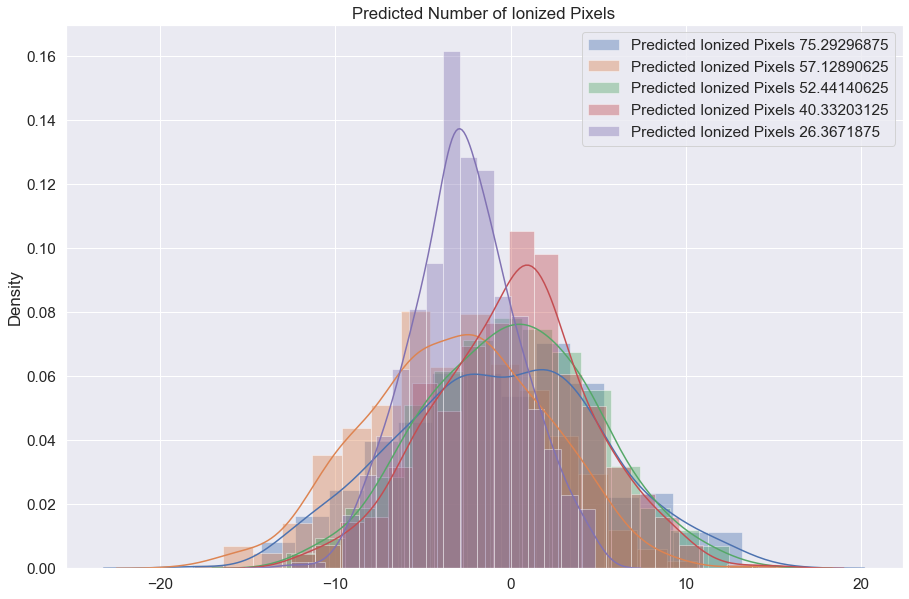

In [217]:
plt.figure(figsize=(15, 10))
plt.title("Predicted Number of Ionized {}".format("Pixels",size = 16 ))

sns.distplot(np.array(pred)[:,0]-y_test[0],label="Predicted Ionized Pixels {}".format(str(y_test[0])))
sns.distplot(np.array(pred)[:,1]-y_test[1],label="Predicted Ionized Pixels {}".format(str(y_test[1])))
sns.distplot(np.array(pred)[:,2]-y_test[2],label="Predicted Ionized Pixels {}".format(str(y_test[2])))
sns.distplot(np.array(pred)[:,3]-y_test[3],label="Predicted Ionized Pixels {}".format(str(y_test[3])))
sns.distplot(np.array(pred)[:,4]-y_test[4],label="Predicted Ionized Pixels {}".format(str(y_test[4])))

#plt.xlim([0, 1.25])
plt.legend(markerscale=2.5)

In [218]:
np.array(pred)[:,0]

array([76.23256 , 71.41941 , 66.84799 , 79.7115  , 81.98582 , 78.27212 ,
       80.025856, 79.51447 , 70.47358 , 79.734726, 72.27355 , 81.26253 ,
       76.99272 , 73.7189  , 75.105034, 75.66129 , 72.03636 , 77.700294,
       87.721535, 77.805046, 83.13332 , 66.625786, 74.17082 , 73.403465,
       79.8636  , 84.35708 , 77.70697 , 72.73666 , 68.930756, 79.25835 ,
       79.8687  , 67.192474, 77.01278 , 80.21548 , 73.79155 , 71.06982 ,
       67.036545, 81.08225 , 76.02256 , 72.658455, 74.89427 , 73.58729 ,
       73.63132 , 77.734184, 73.69684 , 70.490715, 72.87761 , 76.4618  ,
       72.560356, 71.79851 , 77.82336 , 78.051674, 81.23252 , 69.713745,
       78.01492 , 72.360504, 86.67566 , 76.57125 , 76.326965, 63.006744,
       79.19811 , 67.88044 , 76.37123 , 78.75535 , 64.04554 , 76.92288 ,
       62.22285 , 64.92296 , 65.27153 , 69.58109 , 72.80597 , 79.8151  ,
       63.890736, 71.75984 , 84.65413 , 70.75323 , 62.492744, 76.738716,
       67.27215 , 80.68939 , 77.819305, 63.34235 , 

In [219]:
np.array(pred).shape

(500, 2000)

No handles with labels found to put in legend.


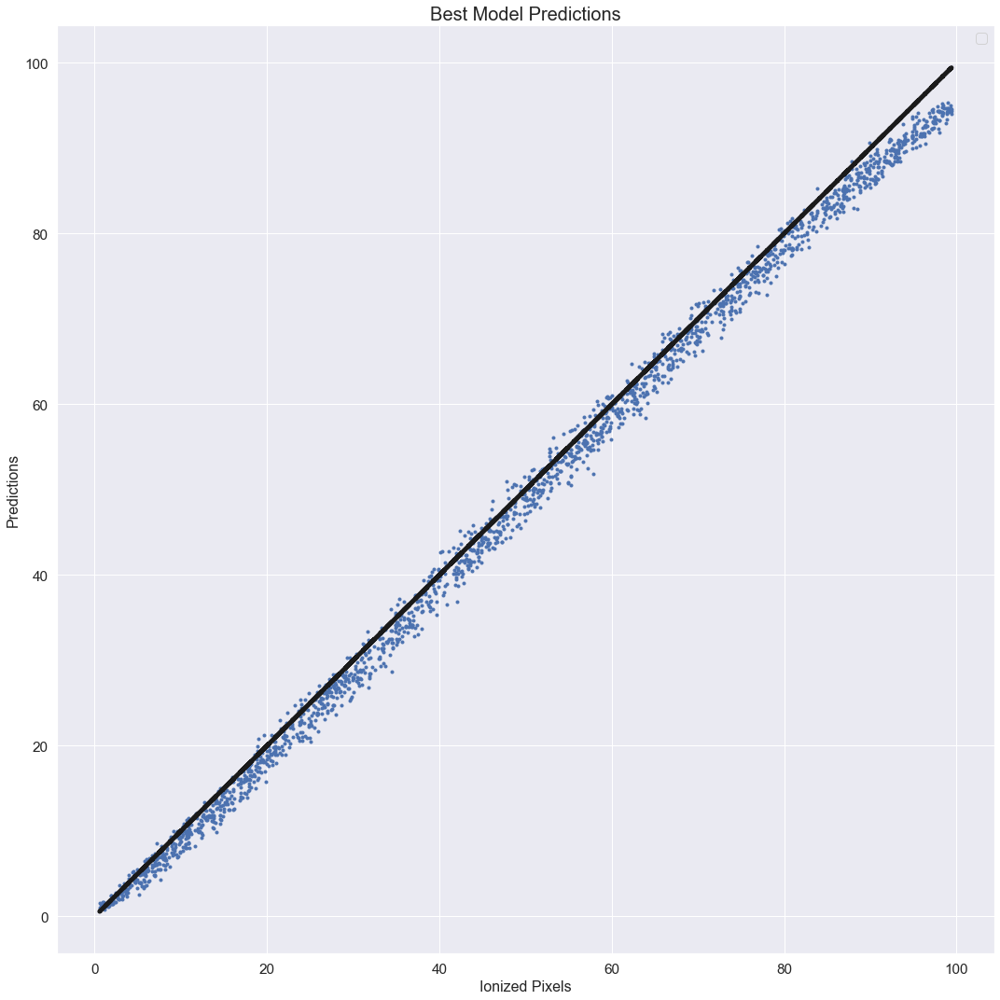

In [220]:
plt.figure(figsize=(15,15))
plt.title("Best Model Predictions", size = 20)

plt.plot(y_test, np.mean(np.array(pred), axis=0), '.')#, label = str(tuner.get_best_models(num_models=num_models)[l-1]))
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()

In [221]:
# make predictions                                                                                                                                                                      
prediction = []
predictions = np.empty([len(X_test),])

for m in tuner.get_best_models(num_models=num_models):
    for i in range(5):
        y_p = m.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])                                                                                              
        prediction.append(y_p) # (500, 100, 1) = (# of masks, # of datasets, # of classes)                                                                                                 
    prediction = np.mean(np.array(prediction), axis=0)
    predictions = np.vstack((predictions, prediction))
    prediction = []
print(X_test.shape)
print(predictions.shape)
print(y_test.shape)

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 1)                 12545     
Total params: 15,161
Trainable params: 15,161
Non-trainable params: 0
_________________________________________________________________
None
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
___________________________

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 1)                 12545     
Total params: 15,161
Trainable params: 15,161
Non-trainable params: 0
_________________________________________________________________
None
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
___________________________

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 1)                 12545     
Total params: 15,161
Trainable params: 15,161
Non-trainable params: 0
_________________________________________________________________
None
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
___________________________

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 1)                 12545     
Total params: 15,161
Trainable params: 15,161
Non-trainable params: 0
_________________________________________________________________
None
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
___________________________

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 1)                 12545     
Total params: 15,161
Trainable params: 15,161
Non-trainable params: 0
_________________________________________________________________
None
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
___________________________

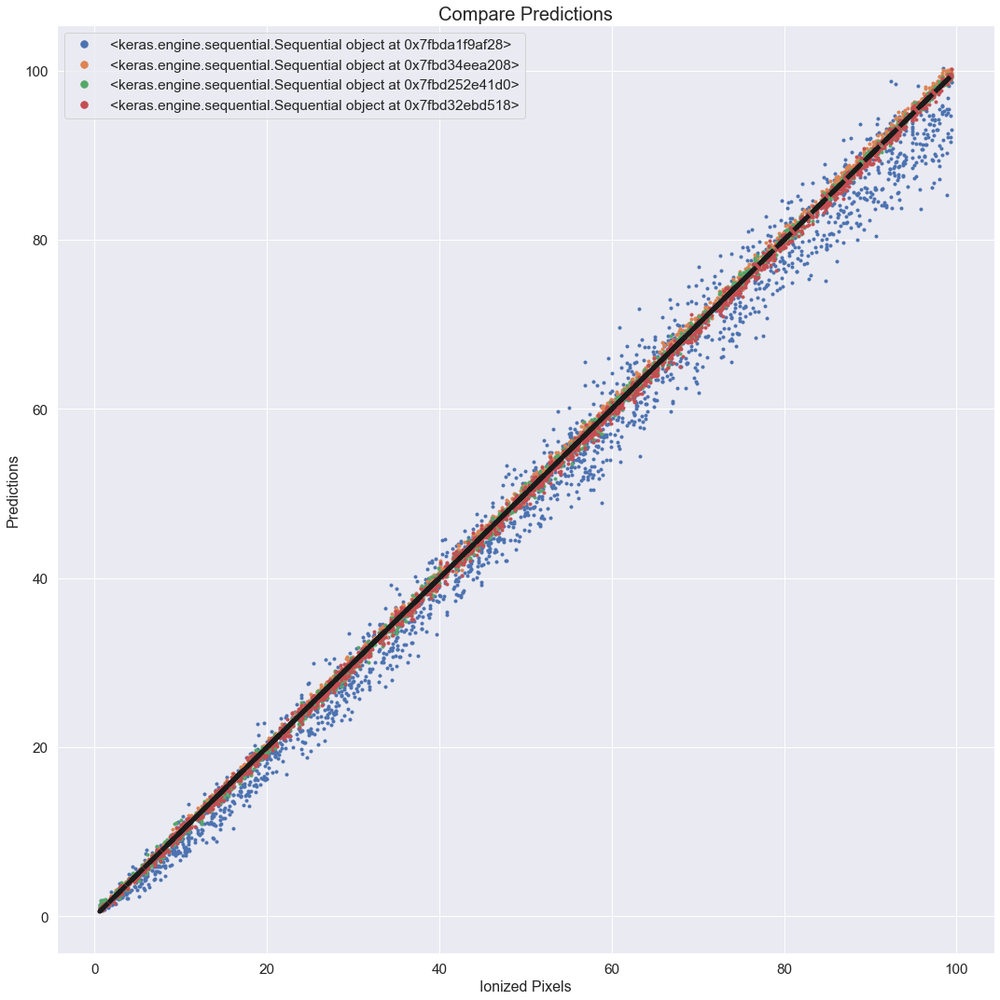

In [222]:
# Plot one-to-one predictions
plt.figure(figsize=(15,15))
plt.title("Compare Predictions", size = 20)

for l in np.arange(1,5):
    plt.plot(y_test, predictions[l], '.', label = str(tuner.get_best_models(num_models=num_models)[l-1]))
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()

In [223]:
predictions.shape

(5, 2000)

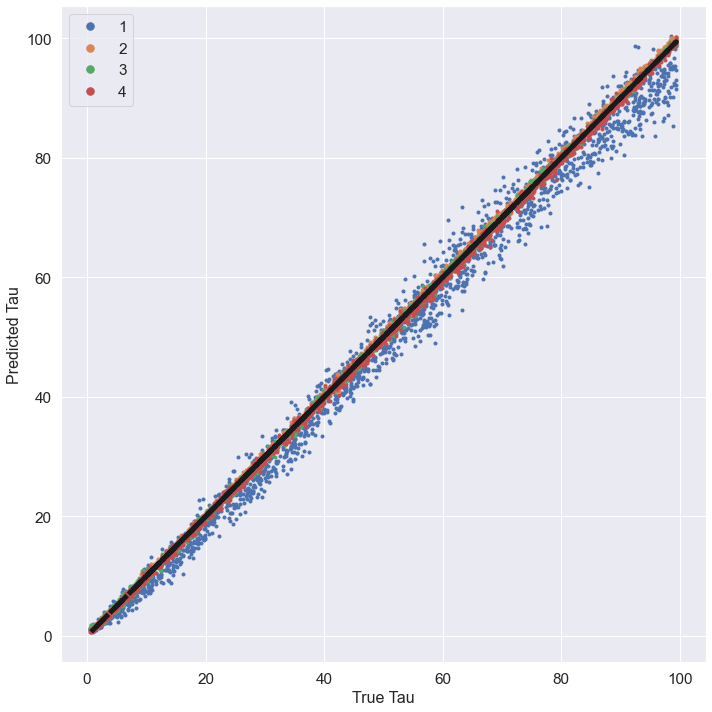

In [224]:
# compare a few of the models
plt.figure(figsize=(10,10))
for l in np.arange(1,5):
    plt.plot(y_test, predictions[l], '.', label = str(l))
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("True Tau", size = 16)
plt.ylabel("Predicted Tau", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()


### Empirical Examination of Posterior Distribution

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 1)                 12545     
Total params: 15,161
Trainable params: 15,161
Non-trainable params: 0
_________________________________________________________________
None


/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

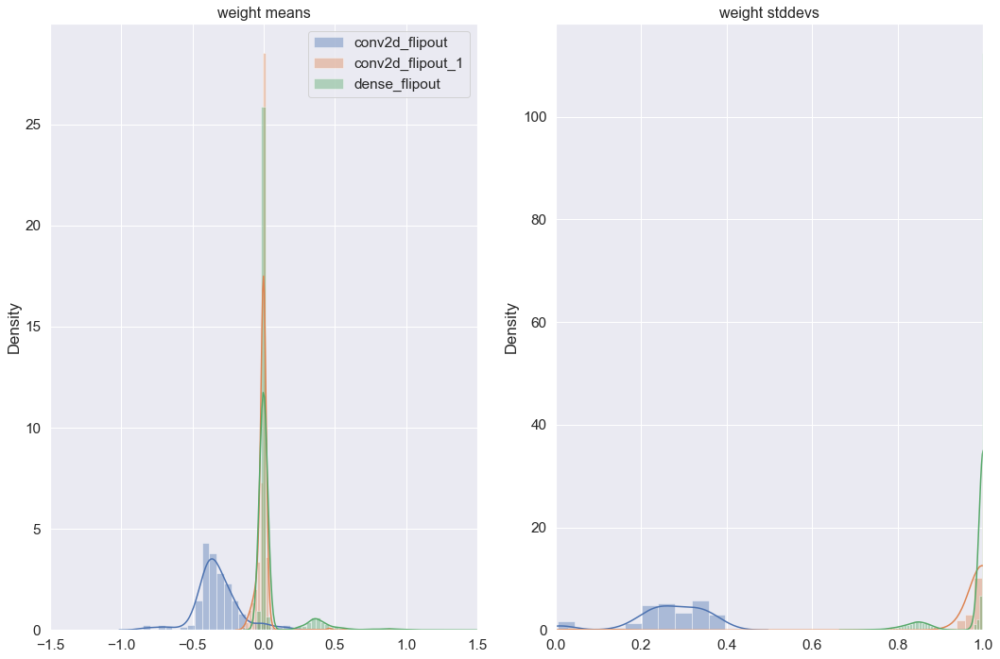

In [225]:
bnn_model = tuner.get_best_models(num_models=1)[0]
sns.set(font_scale=1.4)
def plot_weight_posteriors(names, qm_vals, qs_vals):
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(1, 2, 1)
    for n, qm in zip(names, qm_vals):
        sns.distplot(tf.reshape(qm, shape=[-1]), ax=ax, label=n)
    ax.set_title("weight means",size = 16 )
    ax.set_xlim([-1.5, 1.5])
    ax.legend()
    ax = fig.add_subplot(1, 2, 2)
    for n, qs in zip(names, qs_vals):
        sns.distplot(tf.reshape(qs, shape=[-1]), ax=ax)
    ax.set_title("weight stddevs", size = 16)
    ax.set_xlim([0, 1.0])
    fig.tight_layout()
    plt.show()
    
    
names = [layer.name for layer in bnn_model.layers if "flipout" in layer.name]
qm_vals = [
    layer.kernel_posterior.mean()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]
qs_vals = [
    layer.kernel_posterior.stddev()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]

plot_weight_posteriors(names, qm_vals, qs_vals)

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


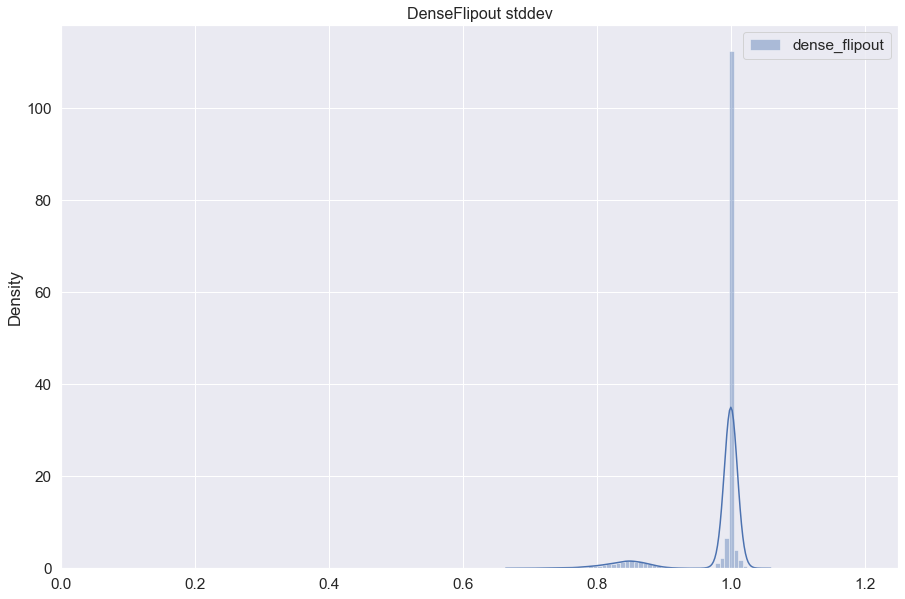

In [226]:
plt.figure(figsize=(15, 10))
sns.distplot(tf.reshape(bnn_model.layers[-1].kernel_posterior.stddev(), shape=[-1]),
             label="{}".format(str(bnn_model.layers[-1].name)))
plt.title("DenseFlipout stddev",size = 16 )
plt.xlim([0, 1.25])
plt.legend()

## Learn STD and Mean

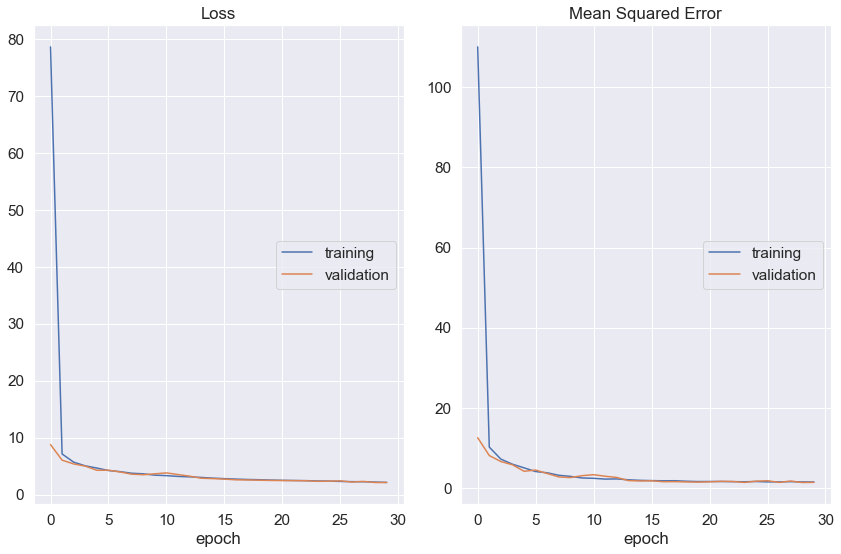

Loss
	training         	 (min:    2.136, max:   78.668, cur:    2.136)
	validation       	 (min:    2.118, max:    8.782, cur:    2.122)
Mean Squared Error
	training         	 (min:    1.556, max:  110.050, cur:    1.556)
	validation       	 (min:    1.426, max:   12.605, cur:    1.474)
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout_2 (Conv2DFlip (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten_1 (Flatten)          (None, 6272)              0         
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 1)                 12545     
_________________________________________________________________
distribution_lambda (Distrib m

In [227]:
def train_test_og_model():
    # Making a model.                                                                                                                                                                       
    model = Sequential()
    
    model.add(tfp.layers.Convolution2DFlipout(filters = 16, 
                                              input_shape=(nx, ny, 1), kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              #, padding = 'same'
                                             ))
    model.add(tfp.layers.Convolution2DFlipout(filters = 8, 
                                              kernel_size=3, activation = 'relu', 
                                              kernel_divergence_fn=kl_divergence_function,
                                              #padding = 'same'
                                             ))
    model.add(Flatten())
    model.add(tfp.layers.DenseFlipout(1, activation="linear", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.DistributionLambda(
      lambda t: tfd.Normal(loc=t[..., :1],
                           #scale = 1)))
                           scale=1e-3 + tf.math.softplus(0.01 * t[..., :1]))))
    

    model.compile(optimizer= "adam", loss = "neg_log_likelihood", metrics=["mse"])
    
    plotlosses = PlotLossesKeras()

    model.fit(X_train, y_train, validation_data=(X_test, y_test),
            epochs=HP_EPOCH, batch_size=HP_BATCH_SIZE,
            callbacks=[plotlosses],
            verbose=1)
    
    # Visualize Model                                                                                                                                                                      
    print(model.summary())

    loss = model.evaluate(X_test, y_test)
    return model
                                                                                                                                                                                      
model = train_test_og_model()



In [228]:
# make predictions                                                                                                                                                                      
predictions = []
for i in range(500):
    y_p = model.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])                                                                                              
    predictions.append(y_p) # (500, 100, 1) = (# of masks, # of datasets, # of classes)
    

(2000, 32, 32, 1)
(2000,)
(2000,)


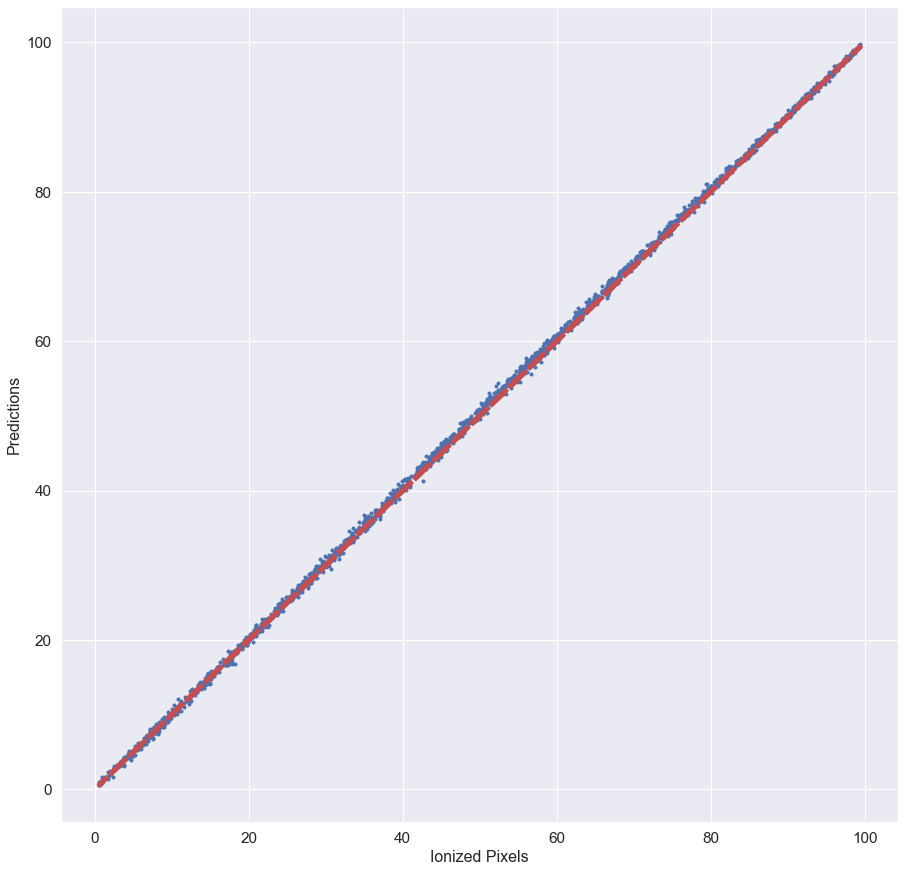

In [229]:
prediction = np.mean(np.array(predictions), axis=0)
print(X_test.shape)
print(prediction.shape)
print(y_test.shape)

# Plot one-to-one predictions
plt.figure(figsize=(15,15))
plt.title("")
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.plot(y_test, prediction, '.')
plt.plot(y_test,y_test, "r--", linewidth=5)

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

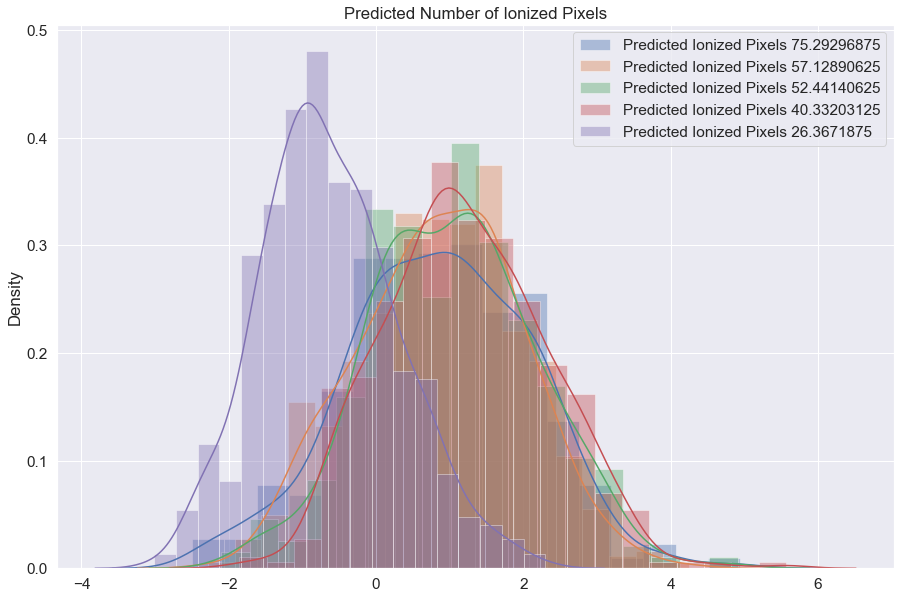

In [230]:
plt.figure(figsize=(15, 10))
plt.title("Predicted Number of Ionized {}".format("Pixels",size = 16 ))

sns.distplot(np.array(predictions)[:,0]-y_test[0],label="Predicted Ionized Pixels {}".format(str(y_test[0])))
sns.distplot(np.array(predictions)[:,1]-y_test[1],label="Predicted Ionized Pixels {}".format(str(y_test[1])))
sns.distplot(np.array(predictions)[:,2]-y_test[2],label="Predicted Ionized Pixels {}".format(str(y_test[2])))
sns.distplot(np.array(predictions)[:,3]-y_test[3],label="Predicted Ionized Pixels {}".format(str(y_test[3])))
sns.distplot(np.array(predictions)[:,4]-y_test[4],label="Predicted Ionized Pixels {}".format(str(y_test[4])))

#plt.xlim([0, 1.25])
plt.legend(markerscale=2.5)


In [308]:
HP_BATCH_SIZE

5

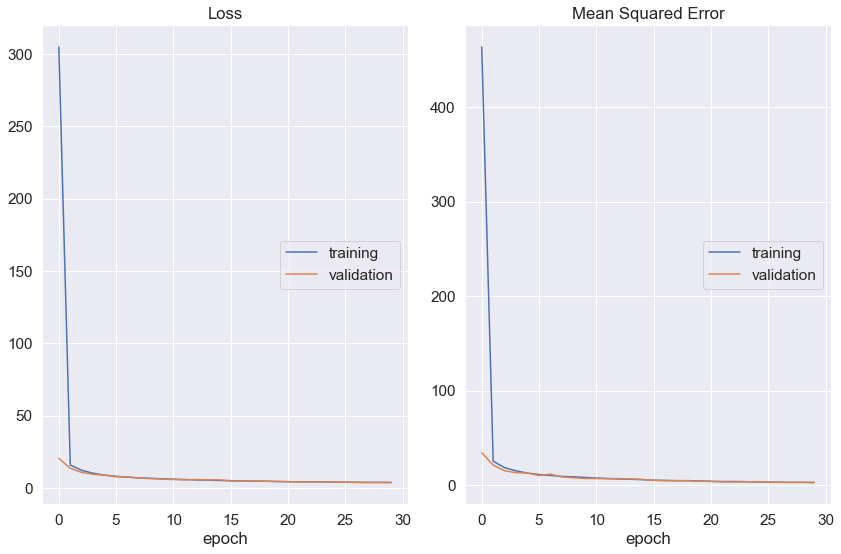

Loss
	training         	 (min:    3.739, max:  304.934, cur:    3.739)
	validation       	 (min:    3.722, max:   20.413, cur:    3.722)
Mean Squared Error
	training         	 (min:    2.948, max:  463.878, cur:    2.948)
	validation       	 (min:    2.920, max:   34.506, cur:    2.920)
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout_6 (Conv2DFlip (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_7 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten_3 (Flatten)          (None, 6272)              0         
_________________________________________________________________
dense_flipout_3 (DenseFlipou (None, 1)                 12545     
_________________________________________________________________
distribution_lambda_2 (Distr m

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

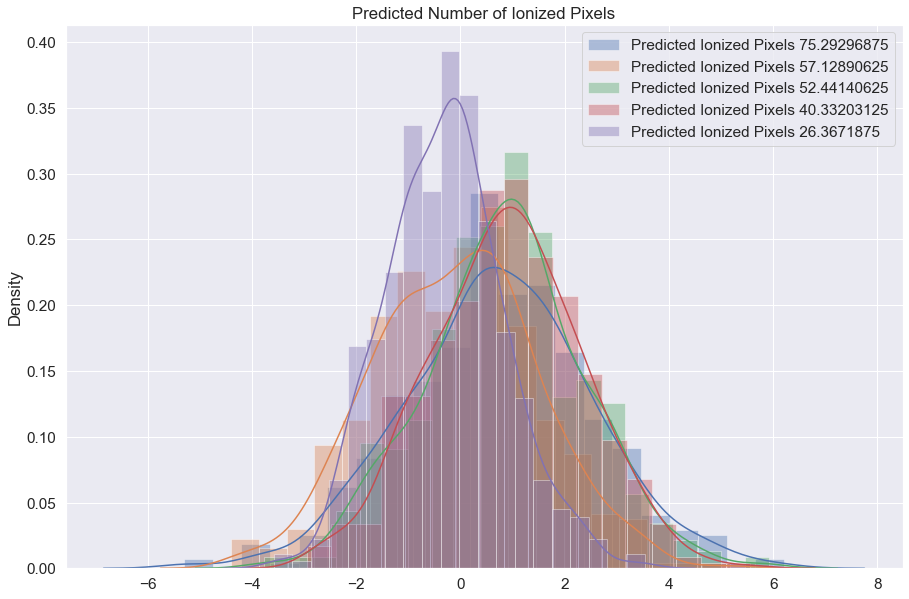

In [310]:
def train_test_og_model():
    # Making a model.                                                                                                                                                                       
    model = Sequential()
    
    model.add(tfp.layers.Convolution2DFlipout(filters = 16, 
                                              input_shape=(nx, ny, 1), kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              #, padding = 'same'
                                             ))
    model.add(tfp.layers.Convolution2DFlipout(filters = 8, 
                                              kernel_size=3, activation = 'relu', 
                                              kernel_divergence_fn=kl_divergence_function,
                                              #padding = 'same'
                                             ))
    model.add(Flatten())
    model.add(tfp.layers.DenseFlipout(1, activation="linear", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.DistributionLambda(
      lambda t: tfd.Normal(loc=t[..., :1],
                           #scale = 1)))
                           scale=1e-3 + tf.math.softplus(0.01 * t[..., :1]))))
    

    model.compile(optimizer= "adam", loss = "neg_log_likelihood", metrics=["mse"])
    
    plotlosses = PlotLossesKeras()

    model.fit(X_train, y_train, validation_data=(X_test, y_test),
            epochs=HP_EPOCH, batch_size= 30,#HP_BATCH_SIZE,
            callbacks=[plotlosses],
            verbose=1)
    
    # Visualize Model                                                                                                                                                                      
    print(model.summary())

    loss = model.evaluate(X_test, y_test)
    return model
                                                                                                                                                                                      
model = train_test_og_model()

# make predictions                                                                                                                                                                      
predictions = []
for i in range(500):
    y_p = model.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])                                                                                              
    predictions.append(y_p)


plt.figure(figsize=(15, 10))
plt.title("Predicted Number of Ionized {}".format("Pixels",size = 16 ))

sns.distplot(np.array(predictions)[:,0]-y_test[0],label="Predicted Ionized Pixels {}".format(str(y_test[0])))
sns.distplot(np.array(predictions)[:,1]-y_test[1],label="Predicted Ionized Pixels {}".format(str(y_test[1])))
sns.distplot(np.array(predictions)[:,2]-y_test[2],label="Predicted Ionized Pixels {}".format(str(y_test[2])))
sns.distplot(np.array(predictions)[:,3]-y_test[3],label="Predicted Ionized Pixels {}".format(str(y_test[3])))
sns.distplot(np.array(predictions)[:,4]-y_test[4],label="Predicted Ionized Pixels {}".format(str(y_test[4])))

#plt.xlim([0, 1.25])
plt.legend(markerscale=2.5)


### Plot the distribution of the predictions within a certain range.

In [231]:
np.array(predictions).shape

(500, 2000)

In [232]:
np.array(predictions)[: , np.logical_and(y_test < 60, y_test >= 50)]

array([[58.175365, 55.223145, 53.62319 , ..., 55.906475, 56.254303,
        58.38862 ],
       [60.132633, 53.739265, 51.213093, ..., 58.63662 , 57.885838,
        58.94043 ],
       [58.488808, 53.693016, 51.924416, ..., 57.965263, 56.598816,
        58.43806 ],
       ...,
       [58.36205 , 55.41643 , 53.214256, ..., 59.138264, 55.233006,
        56.947285],
       [58.551456, 54.388916, 52.640022, ..., 59.81858 , 55.765   ,
        57.909565],
       [58.816856, 54.61129 , 51.884243, ..., 57.9895  , 57.869087,
        59.303196]], dtype=float32)

In [233]:
np.array(predictions)[: , np.logical_and(y_test < 60, y_test >= 50)].shape

(500, 221)

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


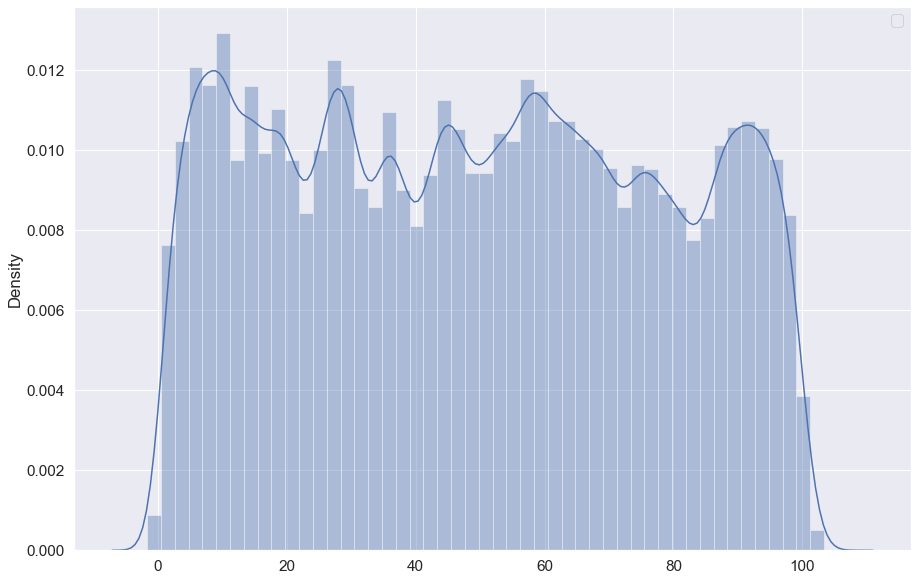

In [234]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions))
plt.legend(markerscale=2.5)

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


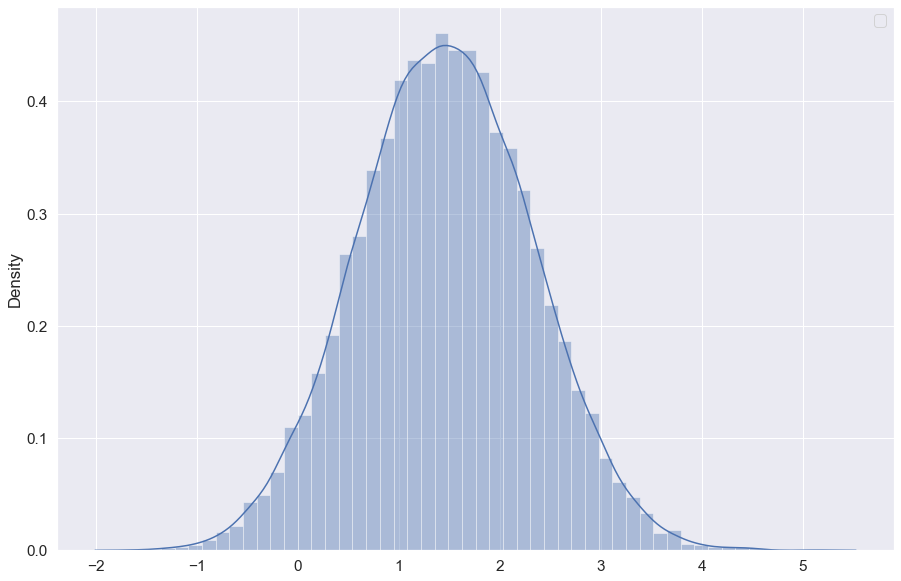

In [235]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions)[: , np.logical_and(y_test < 2, y_test >= 0)])
plt.legend(markerscale=2.5)

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


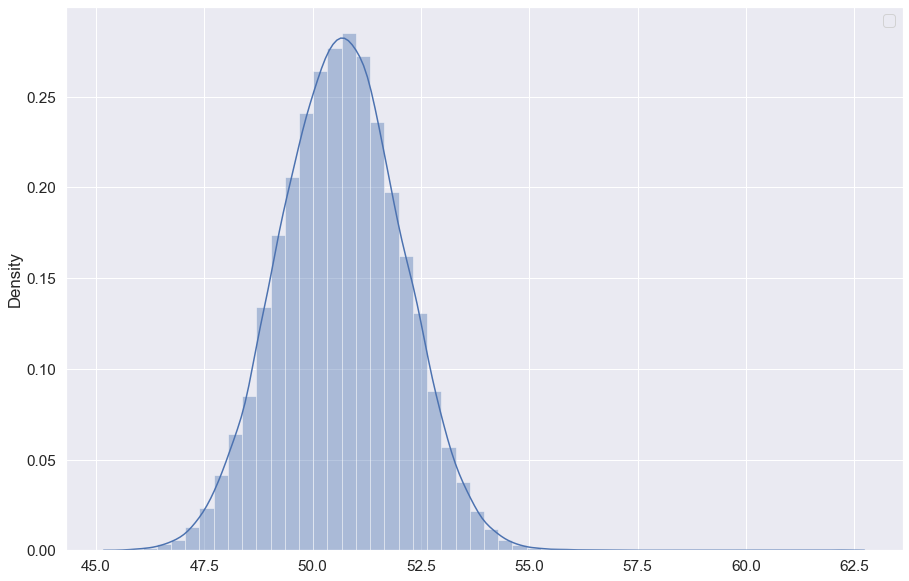

In [236]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions)[: , np.logical_and(y_test < 51, y_test >= 49)])
plt.legend(markerscale=2.5)

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


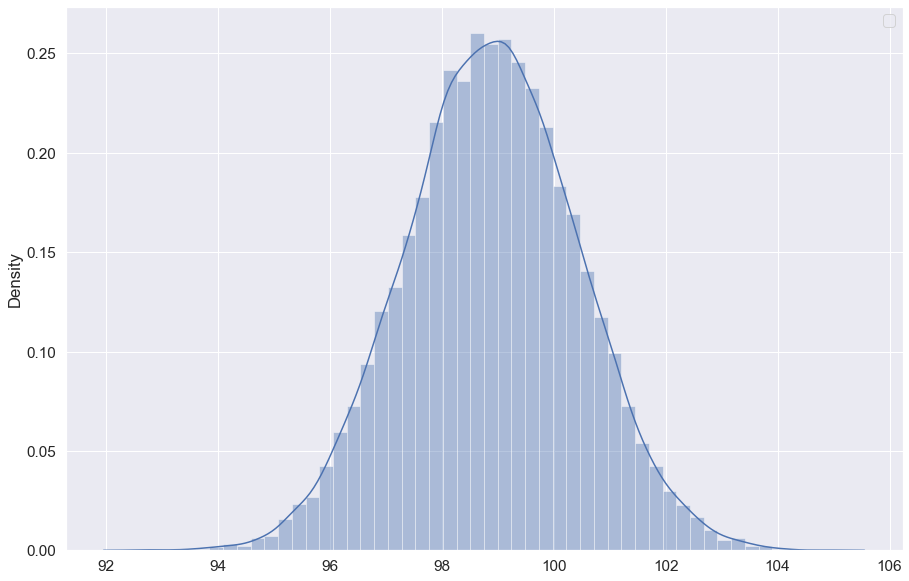

In [237]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions)[: , np.logical_and(y_test < 100, y_test >= 98)])
plt.legend(markerscale=2.5)

### Error Bars

METHOD 1:  Empirical error bars for the posterior using Monte Carlo  

METHOD 2: Sigma in output layer  

In [238]:
yhat = model(X_test) # model.predict(X_test)

No handles with labels found to put in legend.


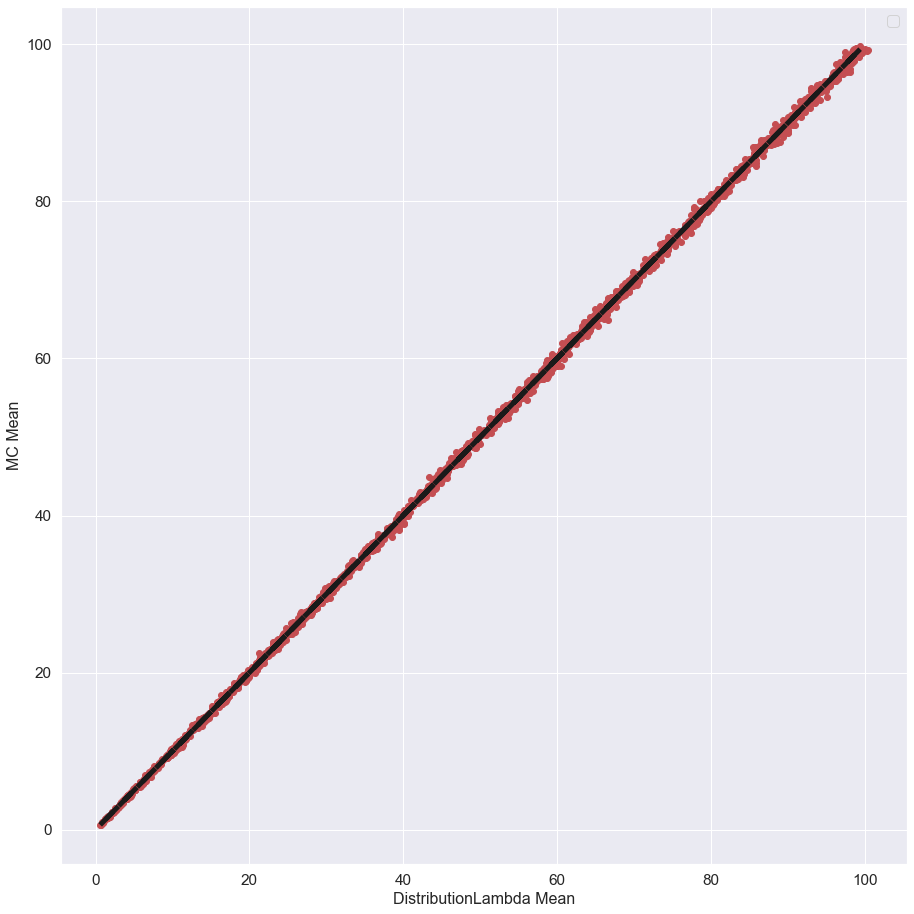

In [239]:
# Compare predicted values
plt.figure(figsize=(13,13))
plt.plot(yhat.mean(), np.mean(np.array(predictions), axis=0), 'r o', label = "")
#plt.plot(y_test, yhat.mean(), 'c *', alpha = 0.5, label = "Method 2: Sigma Output")
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("DistributionLambda Mean", size = 16)
plt.ylabel("MC Mean", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()

No handles with labels found to put in legend.


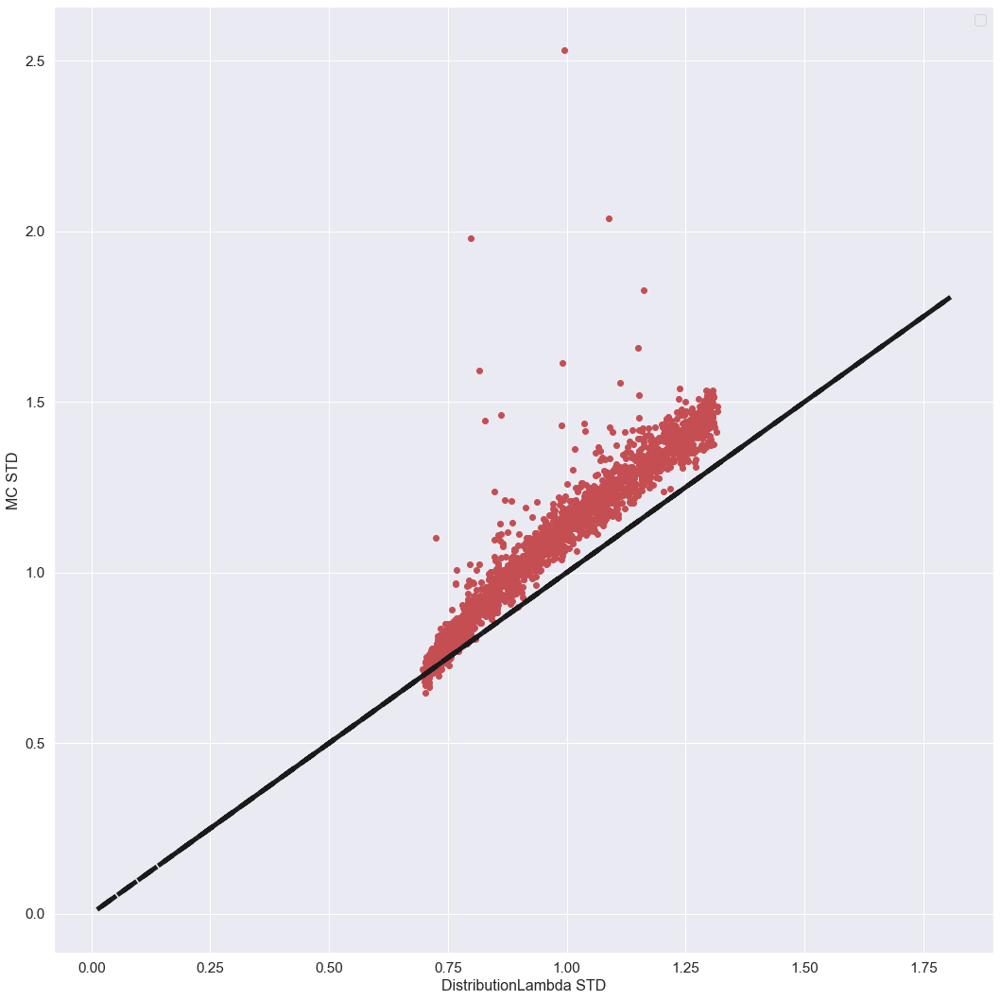

In [250]:
# Compare STDs
plt.figure(figsize=(15,15))
plt.plot(yhat.stddev(), np.std(np.array(predictions), axis=0), 'r o', label = "")
plt.plot(y_test/55,y_test/55, "k--", linewidth=5)

plt.xlabel("DistributionLambda STD", size = 16)
plt.ylabel("MC STD", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()

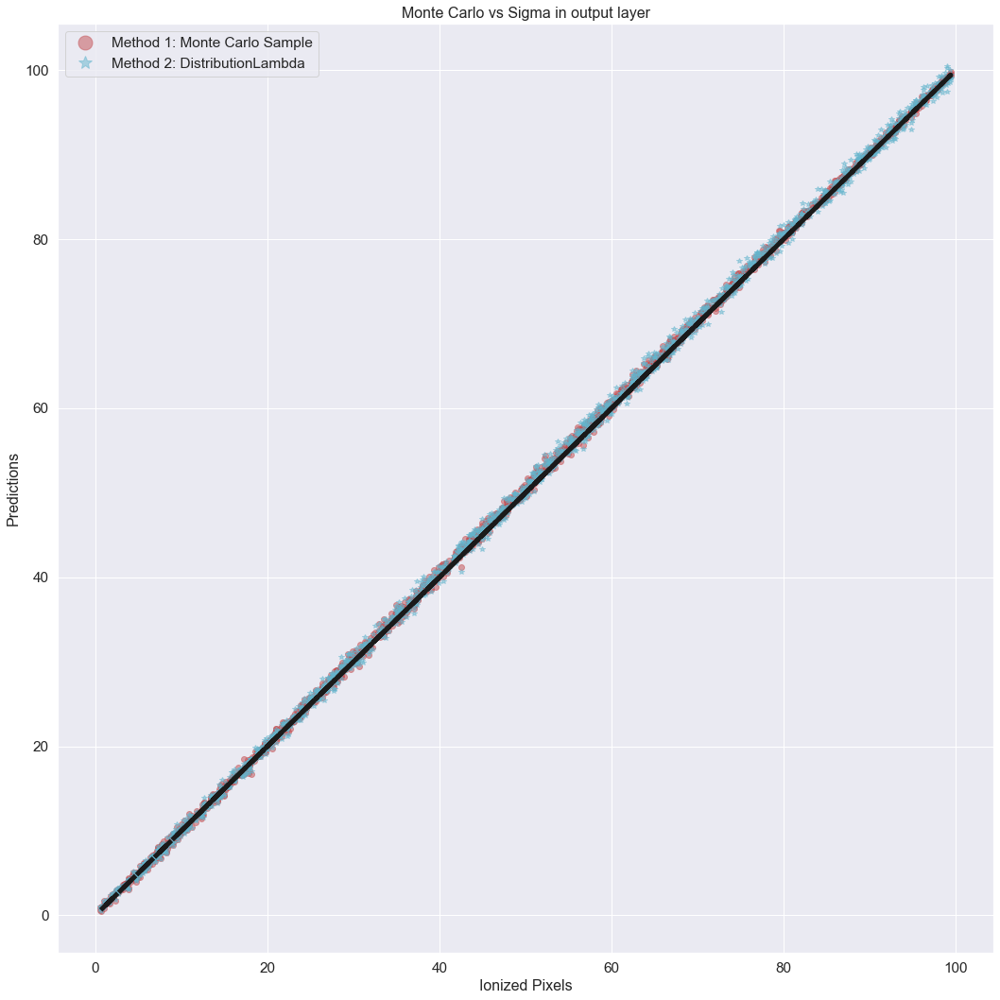

In [251]:
# Plot one-to-one predictions
plt.figure(figsize=(15,15))
plt.title("Monte Carlo vs Sigma in output layer", size = 16)

plt.plot(y_test, np.mean(np.array(predictions), axis=0), 'r o', alpha = 0.5, label = "Method 1: Monte Carlo Sample")
plt.plot(y_test, yhat.mean(), 'c *', alpha = 0.5, label = "Method 2: DistributionLambda")
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()

In [44]:
y_test.shape

(2000,)

In [45]:
yhat.mean()

<tf.Tensor: shape=(2000, 1), dtype=float32, numpy=
array([[76.63873 ],
       [57.247334],
       [52.354164],
       ...,
       [50.009827],
       [82.74327 ],
       [ 9.707252]], dtype=float32)>

In [46]:
(yhat.mean().numpy()[0::10]-yhat.stddev().numpy()[0::10]).shape

(200, 1)

In [293]:
yhat.mean().shape

TensorShape([2000, 1])

In [307]:
yhat

<tfp.distributions._TensorCoercible 'sequential_1_distribution_lambda_tensor_coercible' batch_shape=[2000, 1] event_shape=[] dtype=float32>

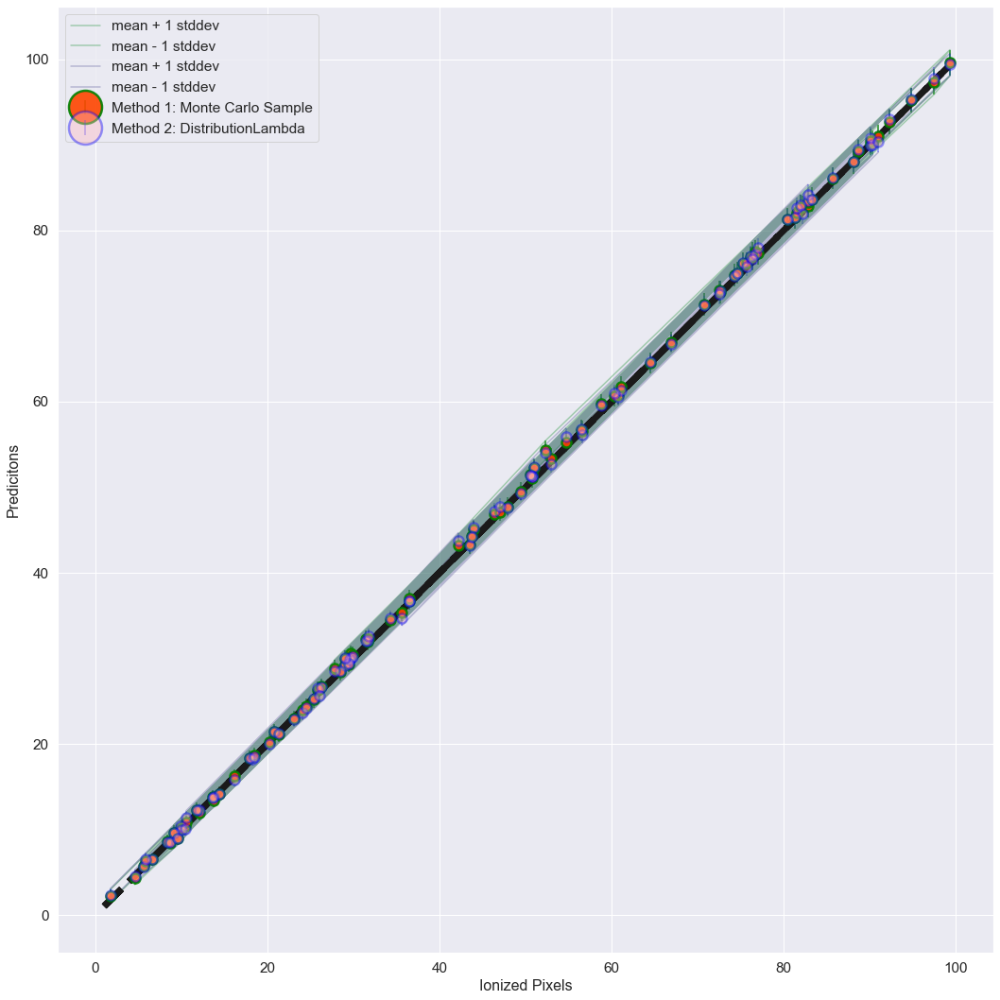

In [286]:
# Plot Error
plt.figure(figsize=(15,15))
#plt.title("Error bars for the posterior using Monte Carlo vs Sigma in output layer", size = 16)

plt.errorbar(y_test[0::20], np.mean(np.array(predictions), axis=0)[0::20], yerr=np.std(predictions, axis=0)[0::20], marker='.', 
             mfc='orangered', mec='green', c='green', mew=2.5, ms=20, ls='', alpha = 0.9, label="Method 1: Monte Carlo Sample")
plt.errorbar(y_test[0::20], yhat.mean().numpy()[0::20,0], yerr=yhat.stddev().numpy()[0::20,0], marker='.', 
             mfc='lightpink', mec='blue', c='blue', mew=2.5, ms=20, ls='', alpha = 0.4, label="Method 2: DistributionLambda")

plt.plot(y_test[0::20],np.mean(np.array(predictions), axis=0)[0::20]+np.std(predictions, axis=0)[0::20], 'g-', alpha=0.5,
         label='mean + 1 stddev'
        )
plt.plot(y_test[0::20],np.mean(np.array(predictions), axis=0)[0::20]-np.std(predictions, axis=0)[0::20], 'g-', alpha=0.5, 
         label='mean - 1 stddev'
        )

plt.plot(y_test[0::20],yhat.mean().numpy()[0::20]+yhat.stddev().numpy()[0::20], '-',color='midnightblue', alpha=0.25, 
         label='mean + 1 stddev'
        )
plt.plot(y_test[0::20],yhat.mean().numpy()[0::20]-yhat.stddev().numpy()[0::20], '-',color='midnightblue', alpha=0.25, 
         label='mean - 1 stddev'
        )

#plt.fill_between(y_test[0::10],  
#                 yhat.mean().numpy()[0::10,0]-yhat.stddev().numpy()[0::10,0], 
#                 yhat.mean().numpy()[0::10,0]+yhat.stddev().numpy()[0::10,0],
#                 color='blue', alpha=0.5,
#                )

plt.plot(y_test,y_test, "k--", linewidth=7)
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predicitons", size = 16)
plt.legend(markerscale=3.5)
plt.tight_layout()

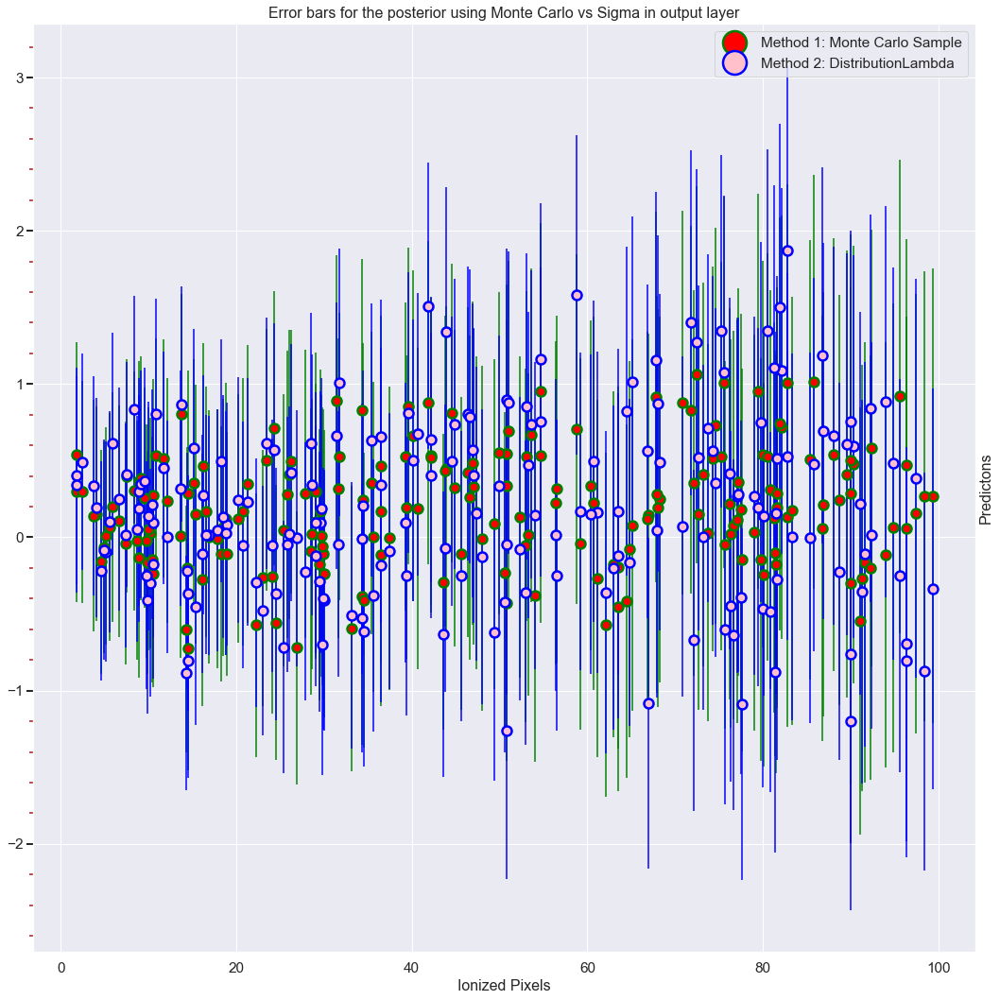

In [48]:
# Plot Error

f=plt.figure(figsize=(15,15))

ax = f.add_subplot(111)
ax.yaxis.tick_left()
ax.yaxis.set_label_position("right")

ax.yaxis.set_minor_locator(AutoMinorLocator())
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=7)
ax.tick_params(which='minor', length=4, color='r')

plt.title("Error bars for the posterior using Monte Carlo vs Sigma in output layer", size = 16)

ax.errorbar(y_test[0::10], (np.mean(np.array(predictions), axis=0)-y_test)[0::10], yerr=np.std(predictions, axis=0)[0::10], marker='.', 
             mfc='red', mec='green', c='green', mew=2.5, ms=20, ls='', label="Method 1: Monte Carlo Sample")
ax.errorbar(y_test[0::10], yhat.mean().numpy()[0::10,0]-y_test[0::10], yerr=yhat.stddev().numpy()[0::10,0], marker='.', 
             mfc='pink', mec='blue', c='blue', mew=2.5, ms=20, ls='', label="Method 2: DistributionLambda")

#ax = f.add_subplot(111)
#ax.yaxis.tick_right()
#ax.yaxis.set_minor_formatter(FormatStrFormatter("%.3f"))
#ax.plot(y_test,y_test-y_test, "k--", linewidth=7)
#plt.grid(axis = 'y', color = 'green', linestyle = '--', linewidth = 0.5)

plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictons", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()

In [49]:
model.weights

[<tf.Variable 'conv2d_flipout_2/kernel_posterior_loc:0' shape=(3, 3, 1, 16) dtype=float32, numpy=
 array([[[[ 1.26580179e-01,  4.12636250e-02,  3.34162847e-03,
           -1.75926045e-01, -4.76537906e-02, -1.56348795e-01,
           -2.73277849e-01, -2.43930519e-01, -2.99623132e-01,
           -3.38684499e-01, -3.05948704e-01, -2.79521346e-02,
           -3.17632824e-01, -2.95441210e-01,  1.34071887e-01,
           -2.45644391e-01]],
 
         [[ 2.53079720e-02, -1.79649554e-02,  9.85811185e-03,
           -2.40091100e-01, -9.48367349e-04,  4.33814041e-02,
           -1.20317742e-01, -3.23007077e-01, -2.61327028e-01,
           -1.42102480e-01, -2.51968116e-01, -4.74855721e-01,
           -3.52051347e-01, -1.02472469e-01, -4.21828628e-01,
           -2.99140722e-01]],
 
         [[ 1.50696989e-02,  3.97250503e-02, -6.18650168e-02,
           -2.00998172e-01, -6.25373274e-02, -4.14439552e-02,
           -2.09815860e-01, -1.55853763e-01, -1.97183996e-01,
           -3.50532770e-01, -1.0

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


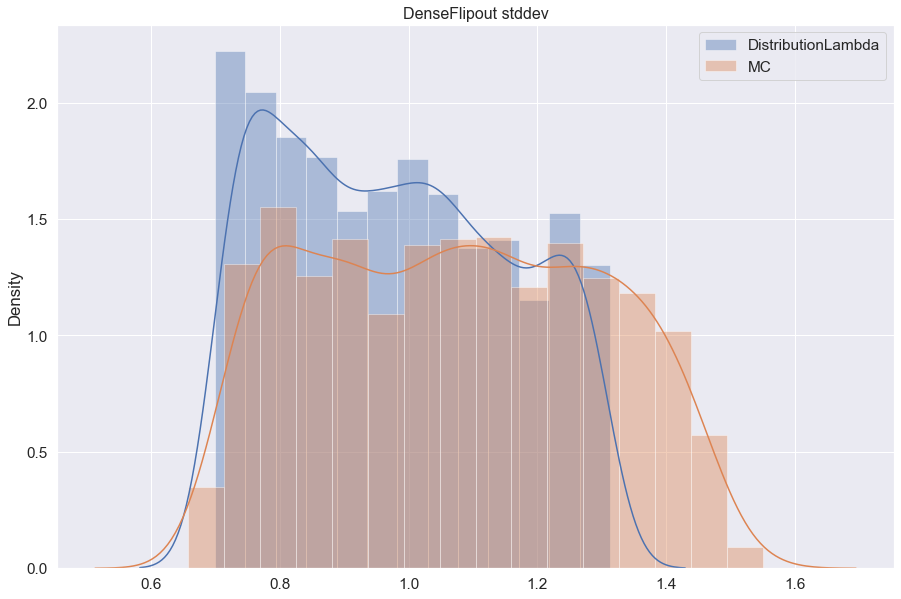

In [50]:
plt.figure(figsize=(15, 10))
sns.distplot(yhat.stddev(),label="DistributionLambda")
sns.distplot(np.std(np.array(predictions), axis=0), label= "MC")
plt.title("DenseFlipout stddev",size = 16 )
#plt.xlim([0, 1.25])
plt.legend()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

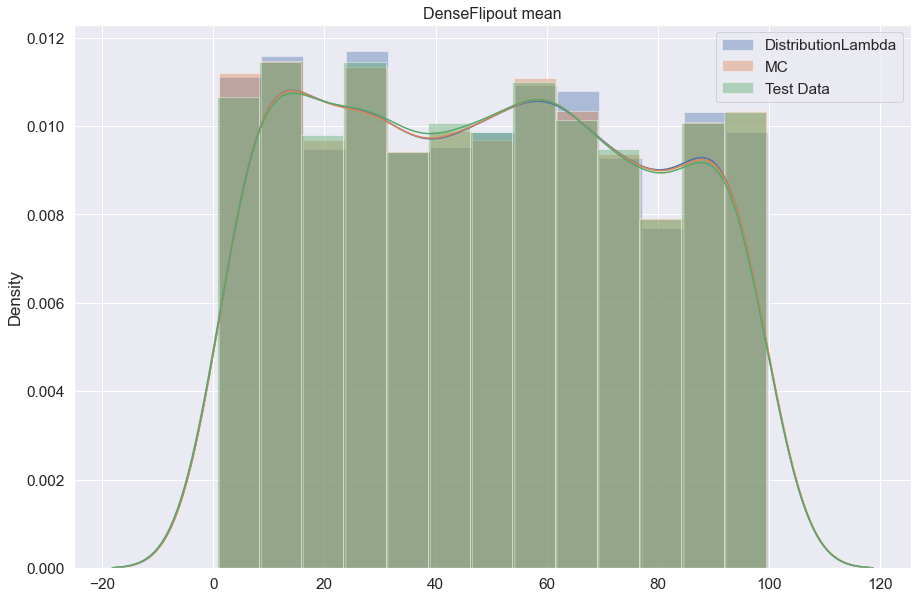

In [51]:
plt.figure(figsize=(15, 10))
sns.distplot(yhat.mean(),label="DistributionLambda")
sns.distplot(np.mean(np.array(predictions), axis=0), label= "MC")
sns.distplot(y_test, label= "Test Data")
plt.title("DenseFlipout mean",size = 16 )
#plt.xlim([0, 1.25])
plt.legend()

In [52]:
np.arange(1,len(np.array(predictions)))

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 1)                 12545     
Total params: 15,161
Trainable params: 15,161
Non-trainable params: 0
_________________________________________________________________
None
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
___________________________

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 1)                 12545     
Total params: 15,161
Trainable params: 15,161
Non-trainable params: 0
_________________________________________________________________
None
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
___________________________

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 1)                 12545     
Total params: 15,161
Trainable params: 15,161
Non-trainable params: 0
_________________________________________________________________
None
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
___________________________

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 1)                 12545     
Total params: 15,161
Trainable params: 15,161
Non-trainable params: 0
_________________________________________________________________
None
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
___________________________

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 8)         2312      
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 1)                 12545     
Total params: 15,161
Trainable params: 15,161
Non-trainable params: 0
_________________________________________________________________
None
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
___________________________

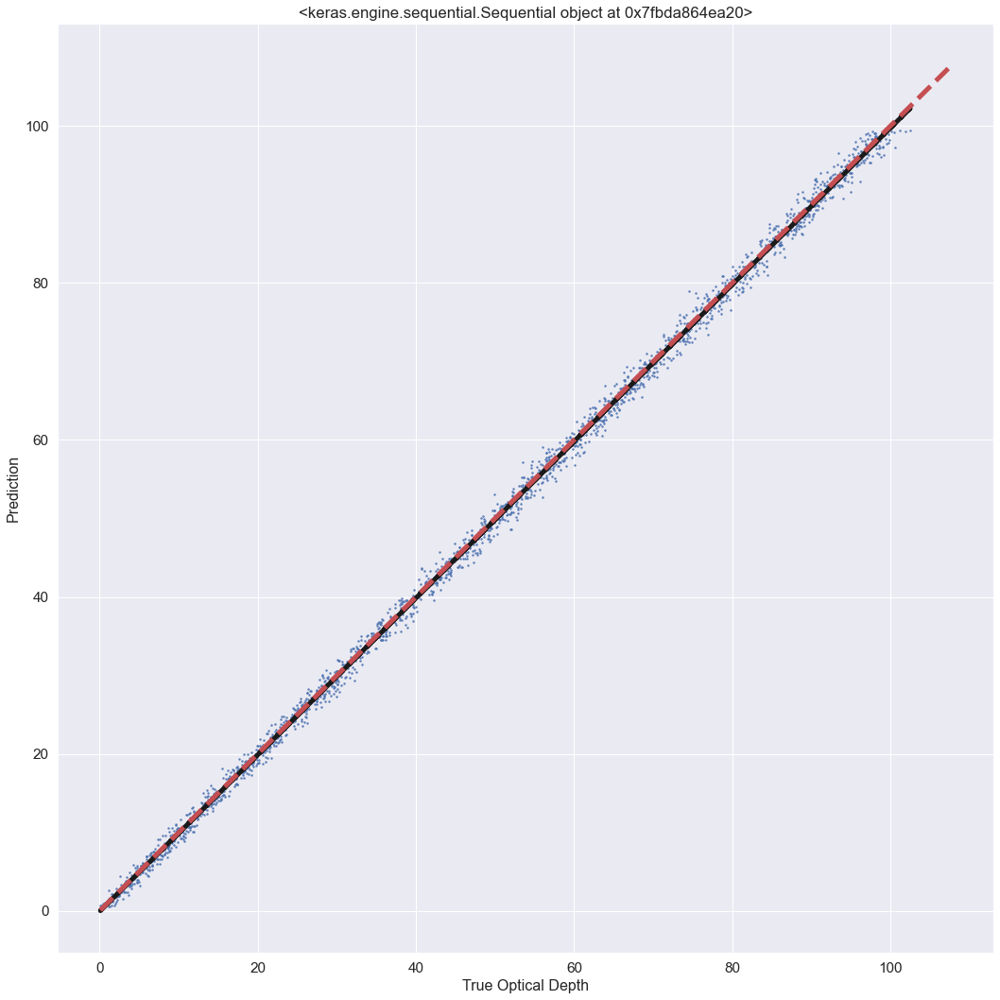

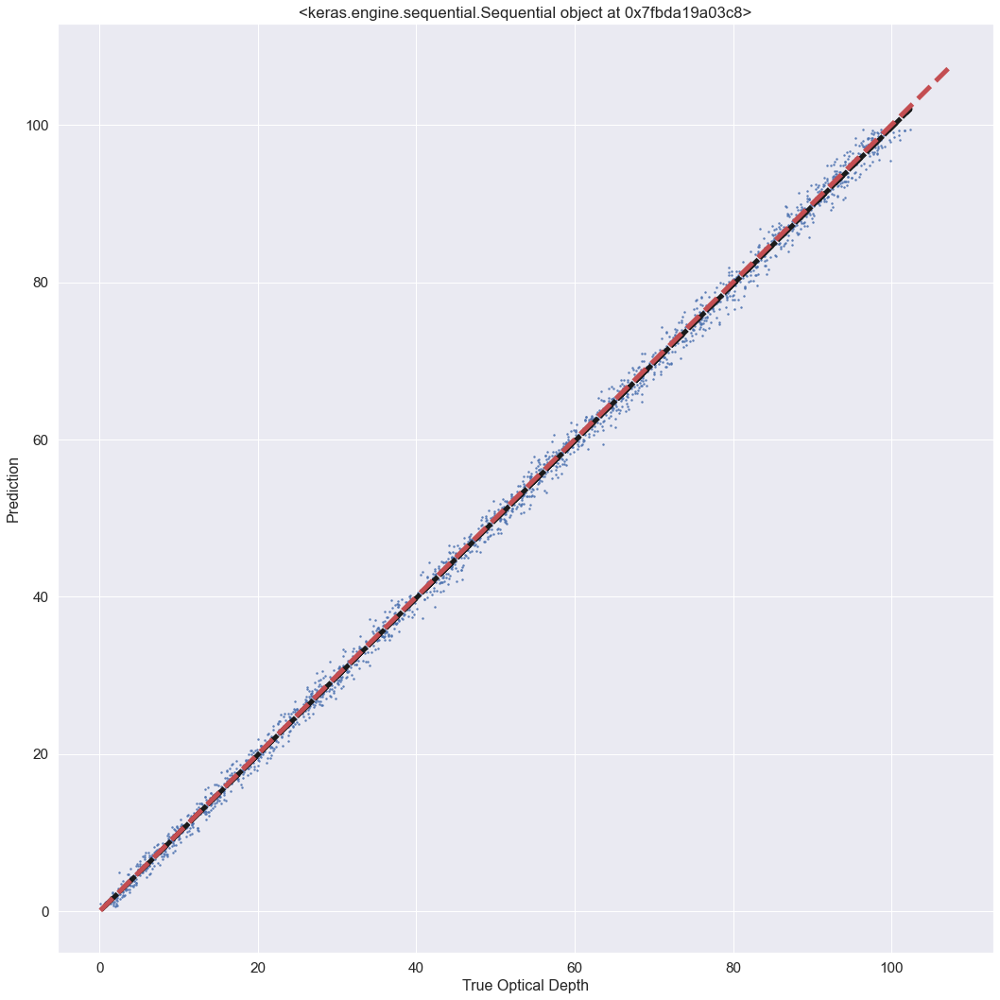

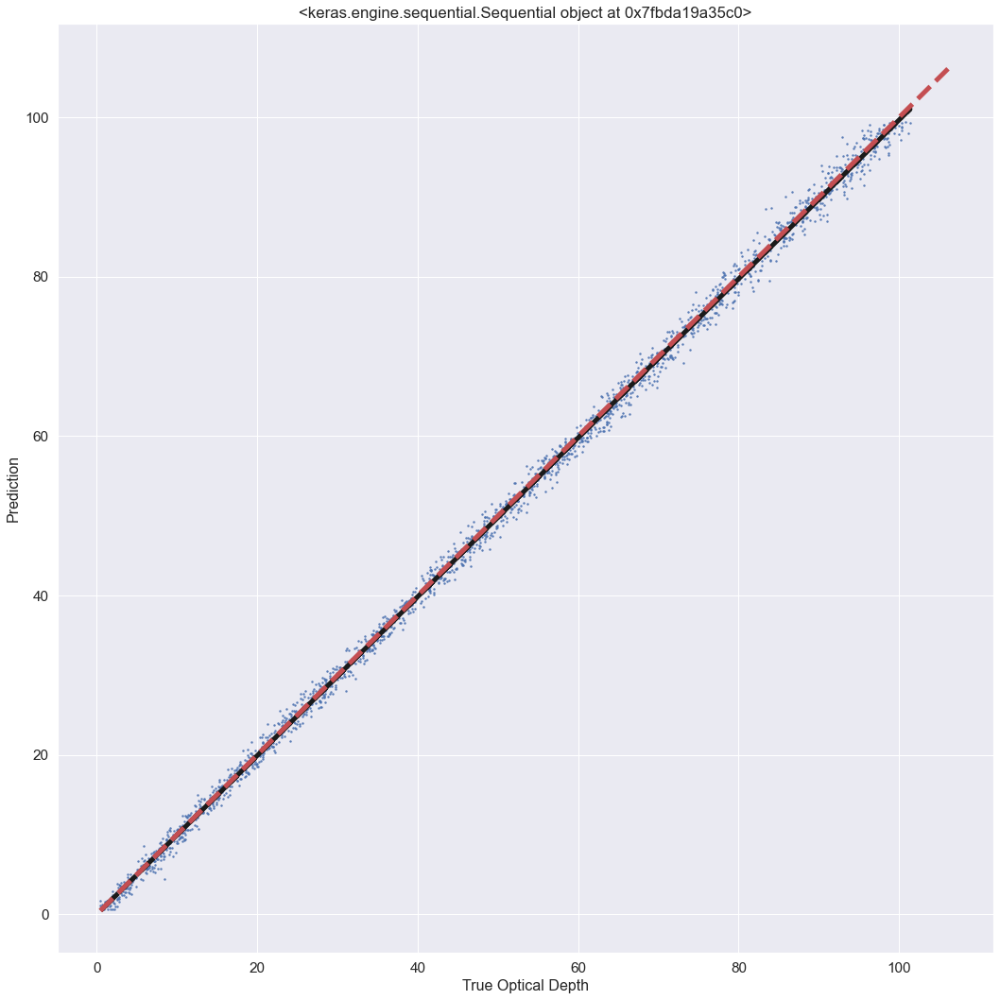

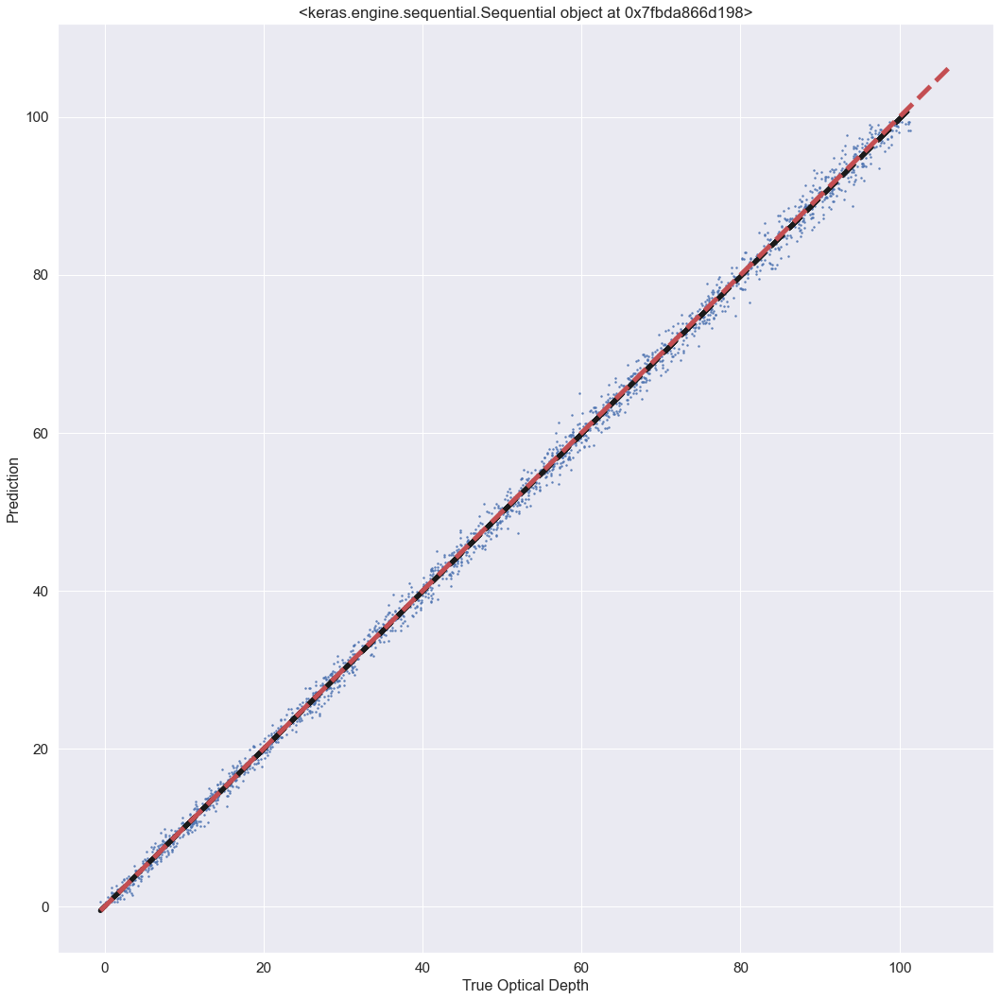

In [53]:
coefficients = []

fp = open(outputdir+"bestmodel_estimated_coefficients_1.log", 'w+')
fp.write("b_0, b_1 \n")

if __name__ == "__main__":

    for p in np.arange(len(tuner.get_best_models(num_models=20))):
        main(x=np.array(predictions)[p], y=y_test, labelname=str(tuner.get_best_models(num_models=15)[p-1]))
    fp.close()
    #statistics_plot_coef(coefficient=coefficients)
    #statistics_plot_dev(coefficient=coefficients)

### Empirical Examination of Posterior Distribution

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

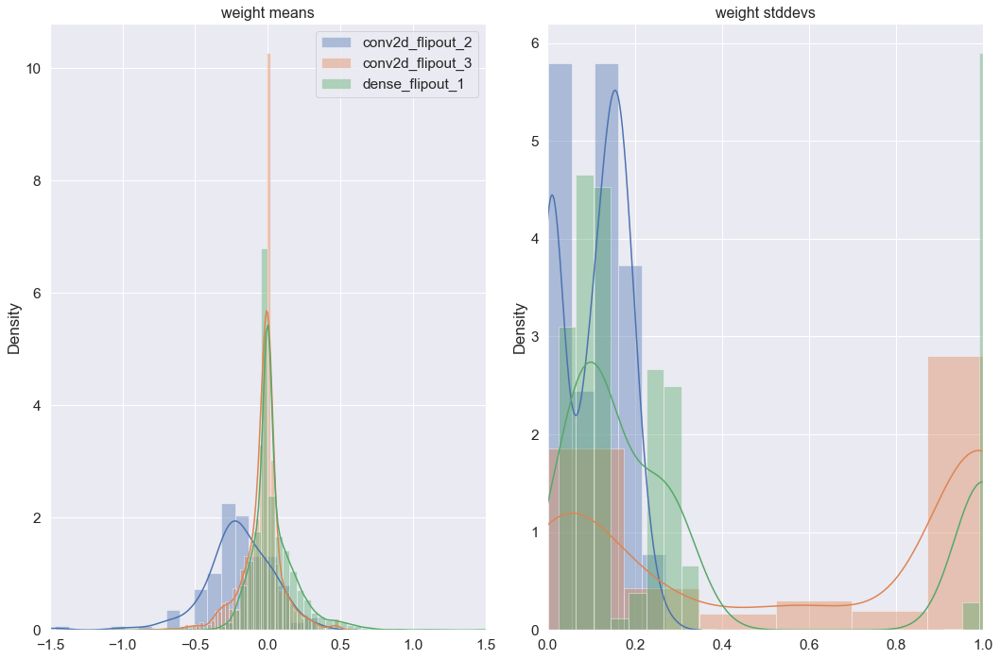

In [54]:
bnn_model = model#tuner.get_best_models(num_models=1)[0]
sns.set(font_scale=1.4)
def plot_weight_posteriors(names, qm_vals, qs_vals):
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(1, 2, 1)
    for n, qm in zip(names, qm_vals):
        sns.distplot(tf.reshape(qm, shape=[-1]), ax=ax, label=n)
    ax.set_title("weight means",size = 16 )
    ax.set_xlim([-1.5, 1.5])
    ax.legend()
    ax = fig.add_subplot(1, 2, 2)
    for n, qs in zip(names, qs_vals):
        sns.distplot(tf.reshape(qs, shape=[-1]), ax=ax)
    ax.set_title("weight stddevs", size = 16)
    ax.set_xlim([0, 1.0])
    fig.tight_layout()
    plt.show()
    
    
names = [layer.name for layer in bnn_model.layers if "flipout" in layer.name]
qm_vals = [
    layer.kernel_posterior.mean()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]
qs_vals = [
    layer.kernel_posterior.stddev()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]

plot_weight_posteriors(names, qm_vals, qs_vals)

In [55]:
qs_vals

[<tf.Tensor: shape=(3, 3, 1, 16), dtype=float32, numpy=
 array([[[[0.00447084, 0.0005128 , 0.00751978, 0.17164883, 0.01900782,
           0.00308188, 0.15207544, 0.11769486, 0.2232507 , 0.14040379,
           0.1823159 , 0.01709674, 0.15578158, 0.11284351, 0.01546021,
           0.13510503]],
 
         [[0.00473497, 0.00097688, 0.0198551 , 0.17905894, 0.01672102,
           0.00274728, 0.11420964, 0.15662037, 0.19505936, 0.13516462,
           0.15975122, 0.03480269, 0.18750226, 0.09712557, 0.12591974,
           0.17438671]],
 
         [[0.00498187, 0.00103057, 0.02160008, 0.1589554 , 0.00830243,
           0.0017334 , 0.15975106, 0.0998915 , 0.17935874, 0.09636048,
           0.12358484, 0.0021322 , 0.15714929, 0.0691857 , 0.09794047,
           0.14640461]]],
 
 
        [[[0.01411078, 0.00092539, 0.00525325, 0.18642804, 0.05526419,
           0.00237459, 0.12967663, 0.1646142 , 0.19441669, 0.18181443,
           0.15629227, 0.02136481, 0.11473047, 0.21571492, 0.11548259,
        

In [56]:
tf.reshape(bnn_model.layers[-2].kernel_posterior.stddev(), shape=[-1])

<tf.Tensor: shape=(6272,), dtype=float32, numpy=
array([0.30236548, 0.12172141, 0.21125238, ..., 0.03037707, 0.9999962 ,
       0.08852369], dtype=float32)>

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


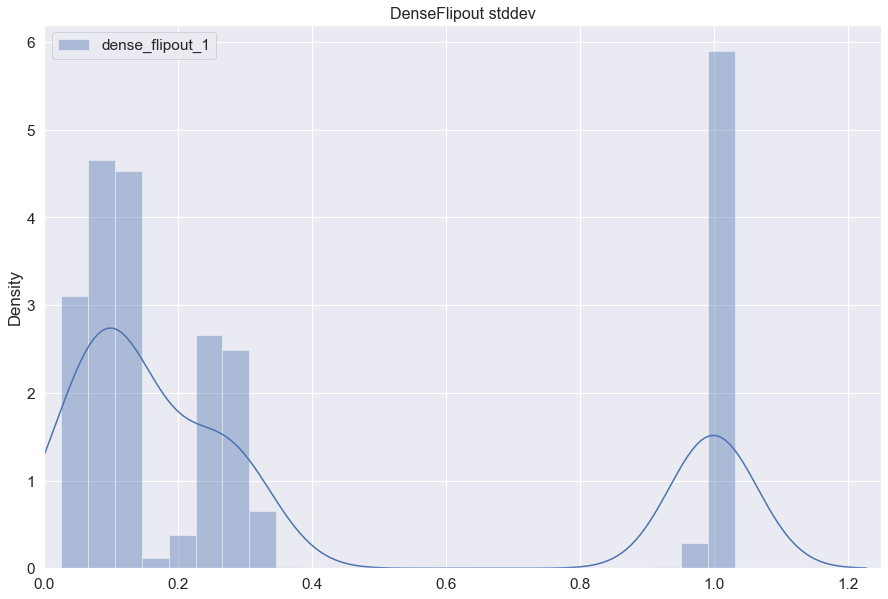

In [57]:
plt.figure(figsize=(15, 10))
sns.distplot(tf.reshape(bnn_model.layers[-2].kernel_posterior.stddev(), shape=[-1]),
             label="{}".format(str(bnn_model.layers[-2].name)))
plt.title("DenseFlipout stddev",size = 16 )
plt.xlim([0, 1.25])
plt.legend()

# Model 2

## Monte Carlo 

In [58]:
outputdir = ""
if os.path.isdir(project_name): # check to see if path exists
    os.system("rm -rvf {}".format(project_name))

def train_test_og_model(hp):

    # Making a model.
    model = Sequential()

    # Added Layers.
    model.add(tfp.layers.Convolution2DFlipout(filters = 16,
                                              input_shape=(nx, ny, 1), kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(tfp.layers.DenseFlipout(8, activation="relu", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.Convolution2DFlipout(filters = 8,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())

    model.add(tfp.layers.DenseFlipout(4, activation="relu", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.Convolution2DFlipout(filters = 4,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())

    model.add(tfp.layers.DenseFlipout(2, activation="relu", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.Convolution2DFlipout(filters = 2,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())

    model.add(tfp.layers.DenseFlipout(4, activation="relu", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.Convolution2DFlipout(filters = 4,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())

    model.add(tfp.layers.DenseFlipout(2, activation="relu", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.Convolution2DFlipout(filters = 2,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())

    model.add(tfp.layers.DenseFlipout(1, activation="relu", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.Convolution2DFlipout(filters = 1,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())

    model.add(tfp.layers.Convolution2DFlipout(filters = 1,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())
    
    model.add(Flatten())
    model.add(tfp.layers.DenseFlipout(1, activation="linear", kernel_divergence_fn=kl_divergence_function,))

    #for l in range(hp.Int('loss', 0, len(losses))):
    model.compile(optimizer= "adam", loss = hp.Choice('loss_type', ["mse", "mae", "mape", "Mean_Squared_over_true_Error"], ordered=False, default="mse"), metrics=["mse"])

    # Visualize Model
    print(model.summary())

    return model

# Start Tuning based on low validation loss
tuner = RandomSearch(train_test_og_model,
                     objective='val_loss', # 'loss', 'val_loss', 'val_accuracy'
                     max_trials= num_models,# specify the number of different models to try
                     executions_per_trial=1, #2,
                     directory=outputdir,
                     seed=42,
                     project_name=project_name)

# Print a summary of the search space
tuner.search_space_summary()

# Show the best models, their hyperparameters, and the resulting metrics.
tuner.search(X_train, y_train,
                          epochs=5,#hp.Int('epoch',min_value=10,max_value=HP_EPOCH,step=10,default=10),
                          validation_data=(X_test, y_test),
                          batch_size=HP_BATCH_SIZE,
                         #callbacks=[plotlosses],
                         verbose=1)

Trial 4 Complete [00h 01m 53s]
val_loss: 25.169979095458984

Best val_loss So Far: 1.0092462301254272
Total elapsed time: 00h 07m 47s
INFO:tensorflow:Oracle triggered exit


In [59]:
tuner.results_summary()

Results summary
Results in ./toy_model_tuner_32
Showing 10 best trials
Objective(name='val_loss', direction='min')
Trial summary
Hyperparameters:
loss_type: Mean_Squared_over_true_Error
Score: 1.0092462301254272
Trial summary
Hyperparameters:
loss_type: mse
Score: 24.979970932006836
Trial summary
Hyperparameters:
loss_type: mae
Score: 25.169979095458984
Trial summary
Hyperparameters:
loss_type: mape
Score: 85.77619171142578


In [60]:
# Retrieve the best model.
best_model = tuner.get_best_models(num_models=1)[0]

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

In [61]:
# Save best hyperperam Model
print("saving best hyperparameter model ...")
best_model.save(outputdir+"hyperParam_model_{}.h5".format(idx))

# Save best hyperperam Model Weights
print("saving best hyperparameter model weights ...")
best_model.save_weights(outputdir+"hyperParam_model_weights_{}.h5".format(idx))

# Save all other models so that we can see how the model behaves based on complexity
for indx in np.arange(len(tuner.get_best_models(num_models=20))):
    model_ = tuner.get_best_models(num_models=num_models)[indx]
    # Save Model weights
    model_.save_weights(outputdir+"hyperParam_weights_{}_{}.h5".format(str(indx+1),idx))
    print("Saving ... "+outputdir+"hyperParam_weights_{}_{}.h5".format(str(indx+1),idx))
    # Save Model
    model_.save(outputdir+"hyperParam_model_{}_{}.h5".format(str(indx+1),idx))
    print("Saving ... "+outputdir+"hyperParam_model_{}_{}.h5".format(str(indx+1),idx))

saving best hyperparameter model ...
saving best hyperparameter model weights ...
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
________________________________________

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Saving ... hyperParam_weights_1_32.h5
Saving ... hyperParam_model_1_32.h5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
________________________________________________

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Saving ... hyperParam_weights_2_32.h5
Saving ... hyperParam_model_2_32.h5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
________________________________________________

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Saving ... hyperParam_weights_3_32.h5
Saving ... hyperParam_model_3_32.h5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
________________________________________________

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Saving ... hyperParam_weights_4_32.h5
Saving ... hyperParam_model_4_32.h5


In [62]:
# print best performing model's loss function
print("Print potential best model")
print(tuner.get_best_models(num_models=1)[0].loss)

print("Print all models")
print(tuner.get_best_models(num_models=20))

print(tuner.search_space_summary())

print(tuner.results_summary())

Print potential best model
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou 

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

[<keras.engine.sequential.Sequential object at 0x7fbd2755c4a8>, <keras.engine.sequential.Sequential object at 0x7fbd2183c518>, <keras.engine.sequential.Sequential object at 0x7fbd22b02908>, <keras.engine.sequential.Sequential object at 0x7fbd222b6e48>]
Search space summary
Default search space size: 1
loss_type (Choice)
{'default': 'mse', 'conditions': [], 'values': ['mse', 'mae', 'mape', 'Mean_Squared_over_true_Error'], 'ordered': False}
None
Results summary
Results in ./toy_model_tuner_32
Showing 10 best trials
Objective(name='val_loss', direction='min')
Trial summary
Hyperparameters:
loss_type: Mean_Squared_over_true_Error
Score: 1.0092462301254272
Trial summary
Hyperparameters:
loss_type: mse
Score: 24.979970932006836
Trial summary
Hyperparameters:
loss_type: mae
Score: 25.169979095458984
Trial summary
Hyperparameters:
loss_type: mape
Score: 85.77619171142578
None


Starting MC Sampling
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None,

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

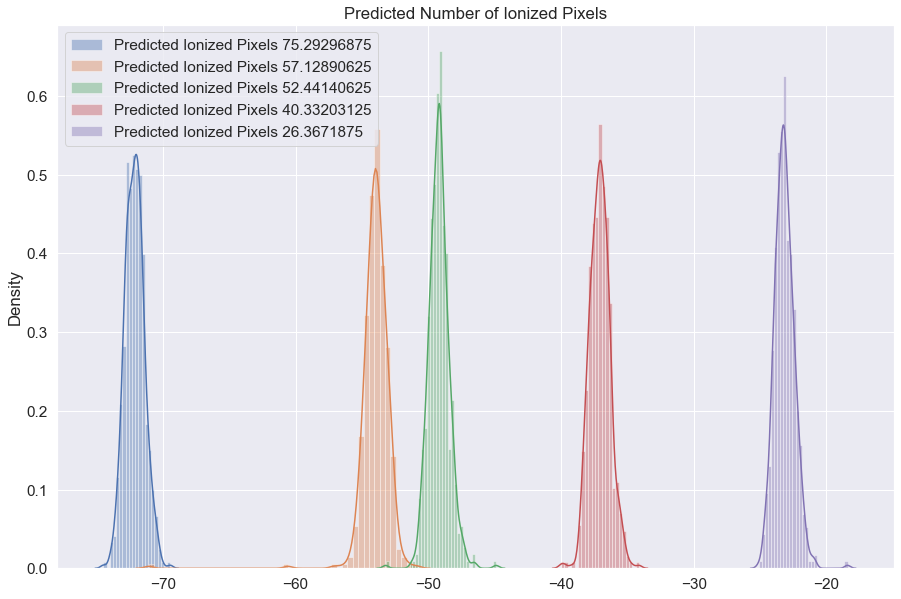

In [63]:
# Do MC Sampling
print("Starting MC Sampling")
bestmodel=tuner.get_best_models(num_models=1)[0]#.predict(X_test)
pred = []

for i in range(500):
    y_p = bestmodel.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])
    pred.append(y_p)

plt.figure(figsize=(15, 10))
plt.title("Predicted Number of Ionized {}".format("Pixels",size = 16 ))
sns.distplot(np.array(pred)[:,0]-y_test[0],label="Predicted Ionized Pixels {}".format(str(y_test[0])))
sns.distplot(np.array(pred)[:,1]-y_test[1],label="Predicted Ionized Pixels {}".format(str(y_test[1])))
sns.distplot(np.array(pred)[:,2]-y_test[2],label="Predicted Ionized Pixels {}".format(str(y_test[2])))
sns.distplot(np.array(pred)[:,3]-y_test[3],label="Predicted Ionized Pixels {}".format(str(y_test[3])))
sns.distplot(np.array(pred)[:,4]-y_test[4],label="Predicted Ionized Pixels {}".format(str(y_test[4])))
plt.legend(markerscale=2.5)
#plt.savefig(outputdir+"predicted_number_of_ionized_pixels.png")


No handles with labels found to put in legend.


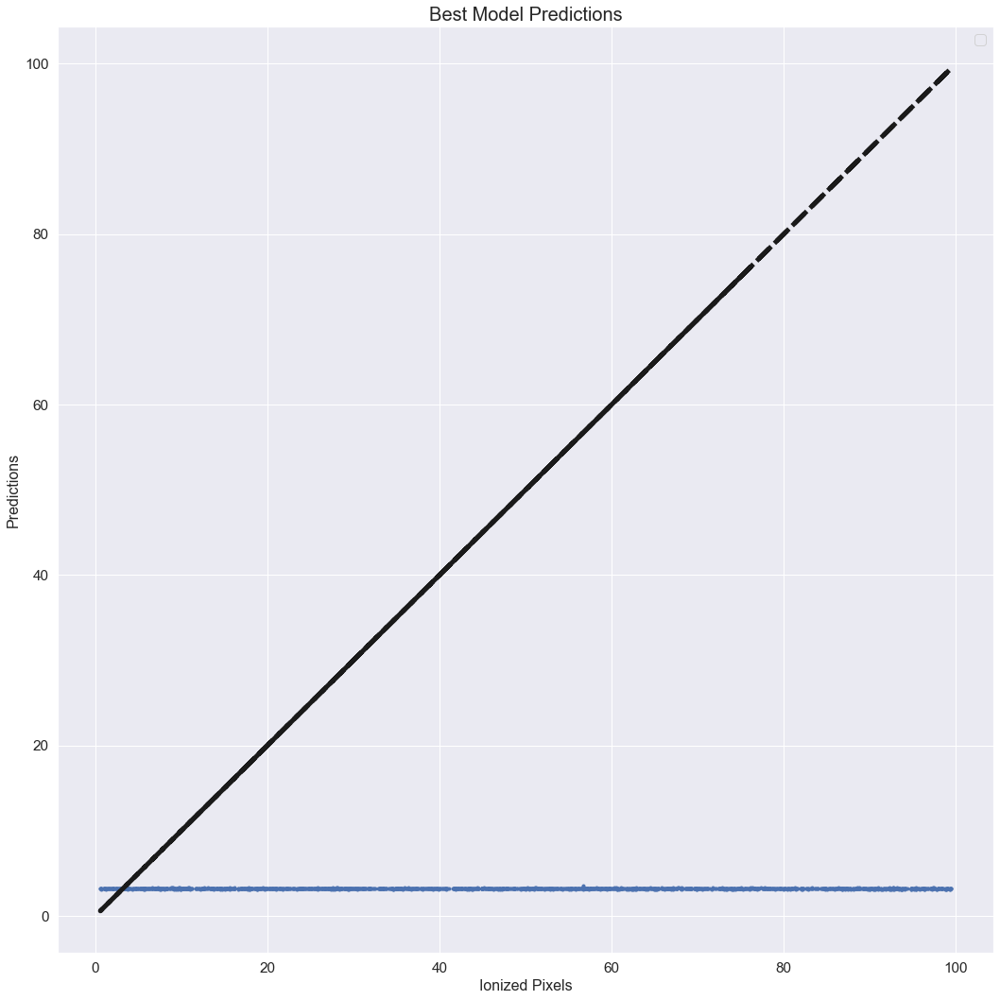

In [64]:
plt.figure(figsize=(15,15))
plt.title("Best Model Predictions", size = 20)
plt.plot(y_test, np.mean(np.array(pred), axis=0), '.')#, label = str(tuner.get_best_models(num_models=num_models)[l-1]))
plt.plot(y_test,y_test, "k--", linewidth=5)
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig(outputdir+"BestModel_Predictions.png")


In [65]:
# make predictions
prediction = []
predictions = np.empty([len(X_test),])

for m in tuner.get_best_models(num_models=num_models):
    for i in range(5):
        y_p = m.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])
        prediction.append(y_p) # (500, 100, 1) = (# of masks, # of datasets, # of classes)
    prediction = np.mean(np.array(prediction), axis=0)
    predictions = np.vstack((predictions, prediction))
    prediction = []
print(X_test.shape)
print(predictions.shape)
print(y_test.shape)

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

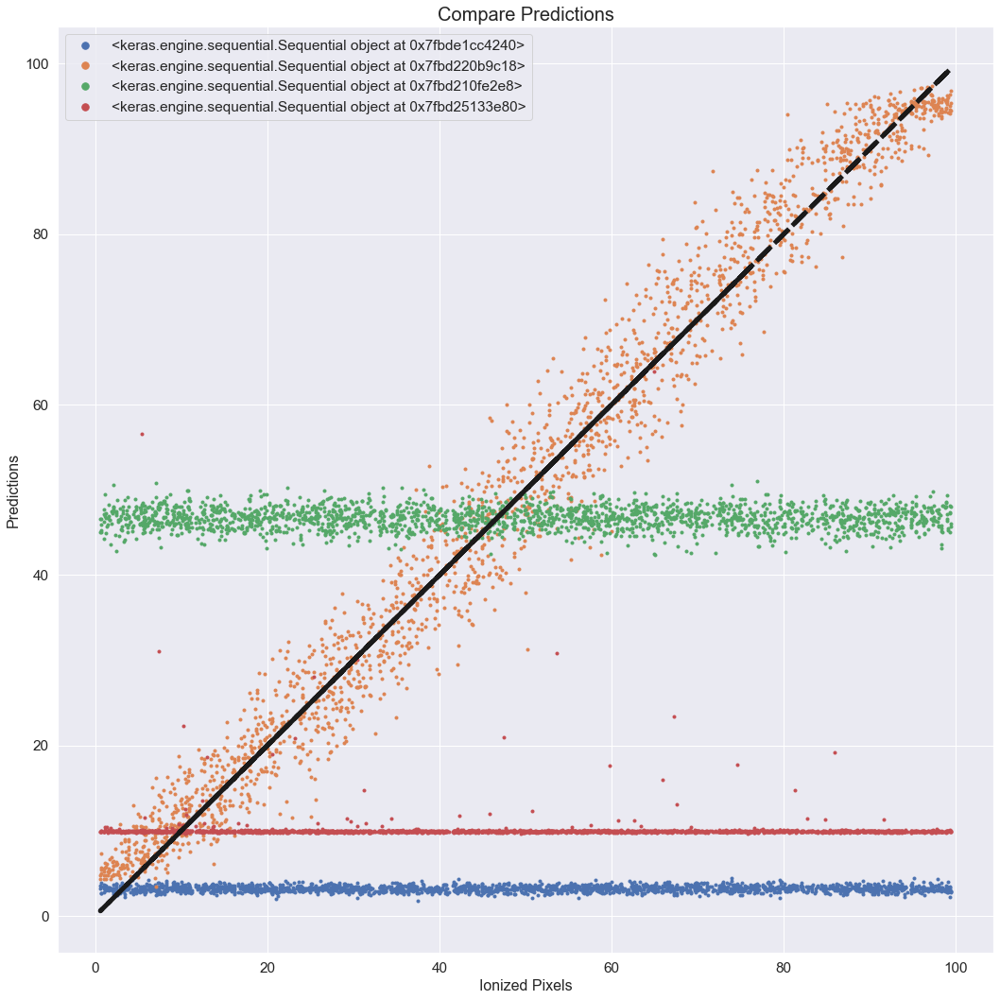

In [66]:
# Plot one-to-one predictions
plt.figure(figsize=(15,15))
plt.title("Compare Predictions", size = 20)

for l in np.arange(1,5):
    plt.plot(y_test, predictions[l], '.', label = str(tuner.get_best_models(num_models=num_models)[l-1]))
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig(outputdir+"Compare_Predictions.png")

In [67]:
# Empirical Examination of Posterior Distribution
bnn_model = tuner.get_best_models(num_models=1)[0]
sns.set(font_scale=1.4)
def plot_weight_posteriors(names, qm_vals, qs_vals):
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(1, 2, 1)
    for n, qm in zip(names, qm_vals):
        sns.distplot(tf.reshape(qm, shape=[-1]), ax=ax, label=n)
    ax.set_title("weight means",size = 16 )
    ax.set_xlim([-1.5, 1.5])
    ax.legend()
    ax = fig.add_subplot(1, 2, 2)
    for n, qs in zip(names, qs_vals):
        sns.distplot(tf.reshape(qs, shape=[-1]), ax=ax)
    ax.set_title("weight stddevs", size = 16)
    ax.set_xlim([0, 1.0])
    fig.tight_layout()
    #plt.savefig(outputdir+"empirical_examination_mc.png")#show()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


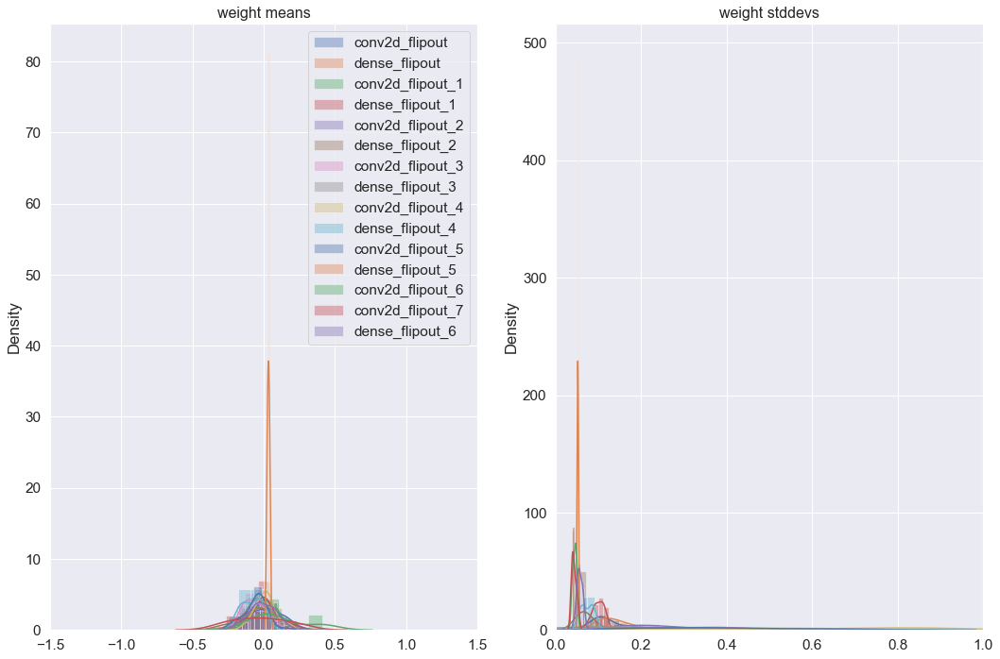

In [68]:
names = [layer.name for layer in bnn_model.layers if "flipout" in layer.name]
qm_vals = [
    layer.kernel_posterior.mean()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]
qs_vals = [
    layer.kernel_posterior.stddev()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]

plot_weight_posteriors(names, qm_vals, qs_vals)

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


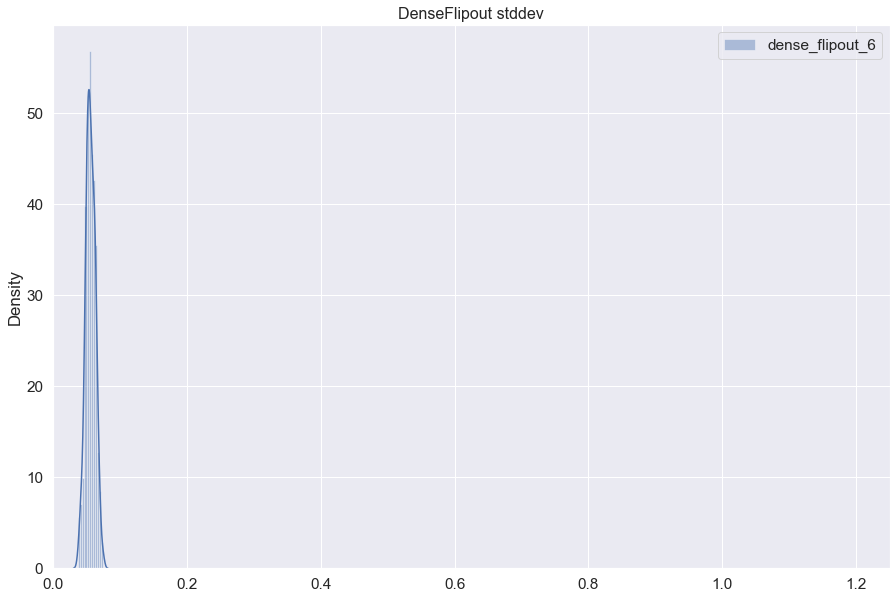

In [69]:
plt.figure(figsize=(15, 10))
sns.distplot(tf.reshape(bnn_model.layers[-1].kernel_posterior.stddev(), shape=[-1]),
             label="{}".format(str(bnn_model.layers[-1].name)))
plt.title("DenseFlipout stddev",size = 16 )
plt.xlim([0, 1.25])
plt.legend()
#plt.savefig(outputdir+"DenseFlipout_stddev_mc.png")

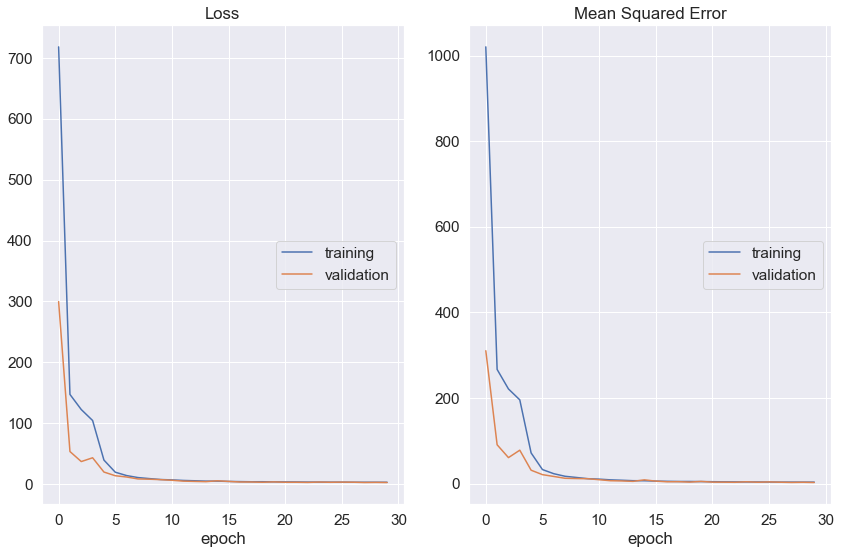

Loss
	training         	 (min:    2.650, max:  718.359, cur:    2.650)
	validation       	 (min:    2.254, max:  299.607, cur:    2.254)
Mean Squared Error
	training         	 (min:    3.480, max: 1020.329, cur:    3.492)
	validation       	 (min:    2.578, max:  310.444, cur:    2.578)
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout_8 (Conv2DFlip (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization_8 (Batch (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout_7 (DenseFlipou (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_9 (Conv2DFlip (

In [70]:
# Learn STD and Mean
def train_test_og_model():
    # Making a model.
    model = Sequential()

    # Added Layers.
    model.add(tfp.layers.Convolution2DFlipout(filters = 16,
                                              input_shape=(nx, ny, 1), kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(tfp.layers.DenseFlipout(8, activation="relu", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.Convolution2DFlipout(filters = 8,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())

    model.add(tfp.layers.DenseFlipout(4, activation="relu", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.Convolution2DFlipout(filters = 4,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())

    model.add(tfp.layers.DenseFlipout(2, activation="relu", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.Convolution2DFlipout(filters = 2,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())

    model.add(tfp.layers.DenseFlipout(4, activation="relu", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.Convolution2DFlipout(filters = 4,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())

    model.add(tfp.layers.DenseFlipout(2, activation="relu", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.Convolution2DFlipout(filters = 2,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())

    model.add(tfp.layers.DenseFlipout(1, activation="relu", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.Convolution2DFlipout(filters = 1,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())

    model.add(tfp.layers.Convolution2DFlipout(filters = 1,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())
    
    model.add(Flatten())
    model.add(tfp.layers.DenseFlipout(1, activation="linear", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.DistributionLambda(
        lambda t: tfd.Normal(loc=t[..., :1],
                             #scale = 1)))
                             scale=1e-3 + tf.math.softplus(0.01 * t[..., :1]))))

    model.compile(optimizer= "adam", loss = "neg_log_likelihood", metrics=["mse"])

    plotlosses = PlotLossesKeras()

    model.fit(X_train, y_train, validation_data=(X_test, y_test),
              epochs=HP_EPOCH, batch_size=HP_BATCH_SIZE,
              callbacks=[plotlosses],
              verbose=1)

    # Visualize Model
    print(model.summary())

    loss = model.evaluate(X_test, y_test)
    return model

model = train_test_og_model()

In [71]:
# make predictions
print("Make MC predictions")
predictions = []
for i in range(500):
    y_p = model.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])
    predictions.append(y_p) # (500, 100, 1) = (# of masks, # of datasets, # of classes)

prediction = np.mean(np.array(predictions), axis=0)
print(X_test.shape)
print(prediction.shape)
print(y_test.shape)

Make MC predictions
(2000, 32, 32, 1)
(2000,)
(2000,)


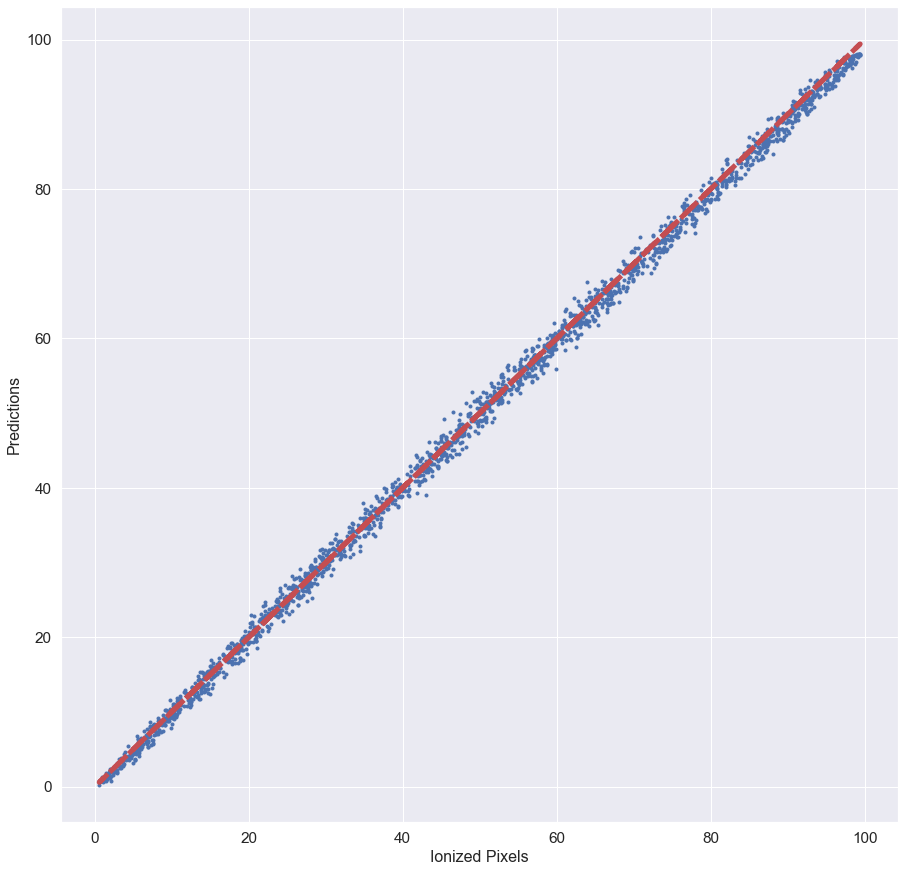

In [72]:
# Plot one-to-one predictions
plt.figure(figsize=(15,15))
plt.title("")
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.plot(y_test, prediction, '.')
plt.plot(y_test,y_test, "r--", linewidth=5)
#plt.savefig(outputdir+"Empirical_one2one_plots.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

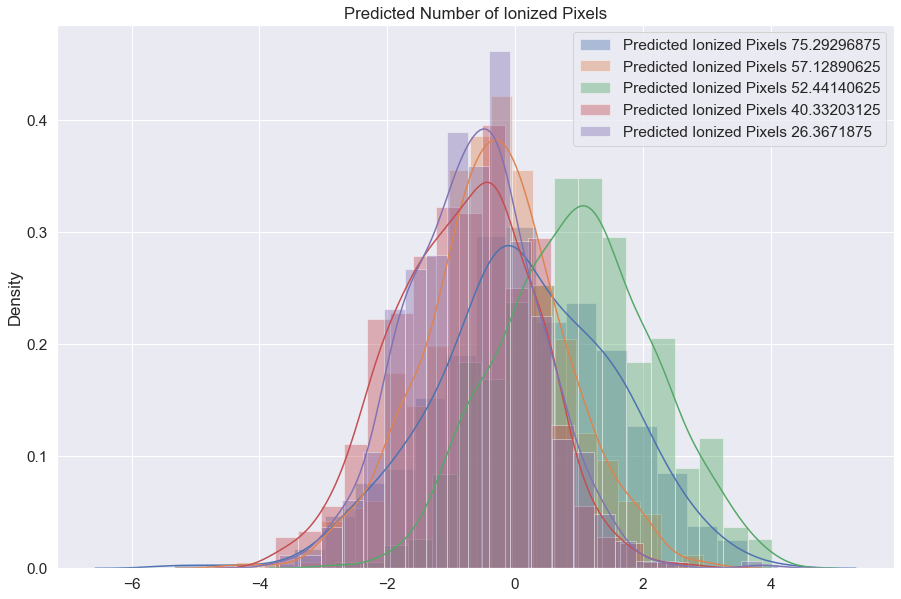

In [73]:
plt.figure(figsize=(15, 10))
plt.title("Predicted Number of Ionized {}".format("Pixels",size = 16 ))
sns.distplot(np.array(predictions)[:,0]-y_test[0],label="Predicted Ionized Pixels {}".format(str(y_test[0])))
sns.distplot(np.array(predictions)[:,1]-y_test[1],label="Predicted Ionized Pixels {}".format(str(y_test[1])))
sns.distplot(np.array(predictions)[:,2]-y_test[2],label="Predicted Ionized Pixels {}".format(str(y_test[2])))
sns.distplot(np.array(predictions)[:,3]-y_test[3],label="Predicted Ionized Pixels {}".format(str(y_test[3])))
sns.distplot(np.array(predictions)[:,4]-y_test[4],label="Predicted Ionized Pixels {}".format(str(y_test[4])))
plt.legend(markerscale=2.5)
#plt.savefig(outputdir+"predicted_number_of_ionized_empirical.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


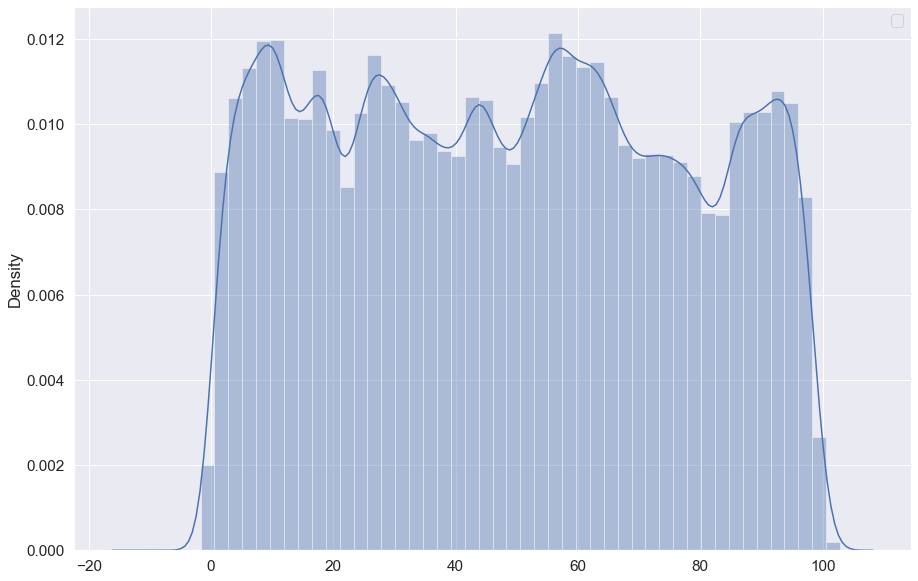

In [74]:
# Plot the distribution of the predictions within a certain range.
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions))
plt.legend(markerscale=2.5)
#plt.savefig(outputdir+"range_of_predct0.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


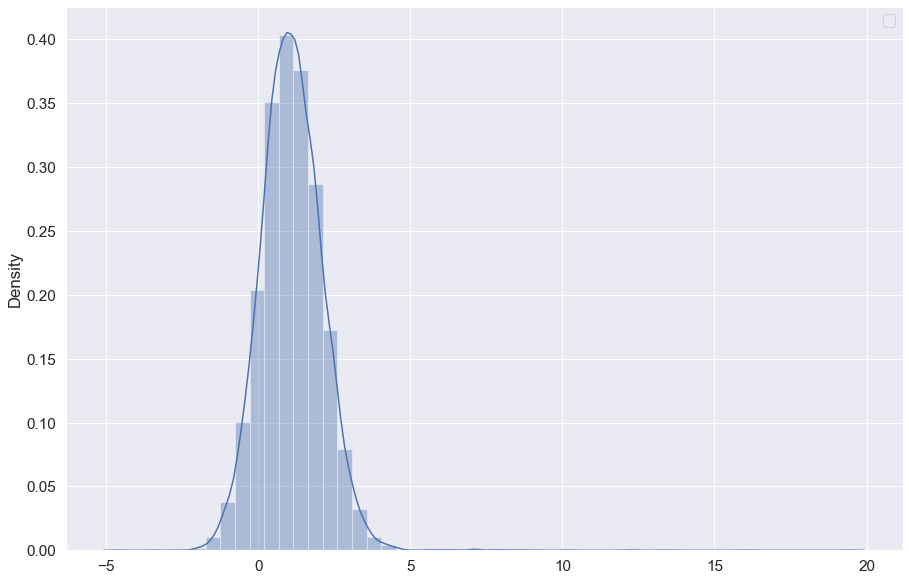

In [75]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions)[: , np.logical_and(y_test < 2, y_test >= 0)])
plt.legend(markerscale=2.5)
#plt.savefig(outputdir+"range_of_predct1.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


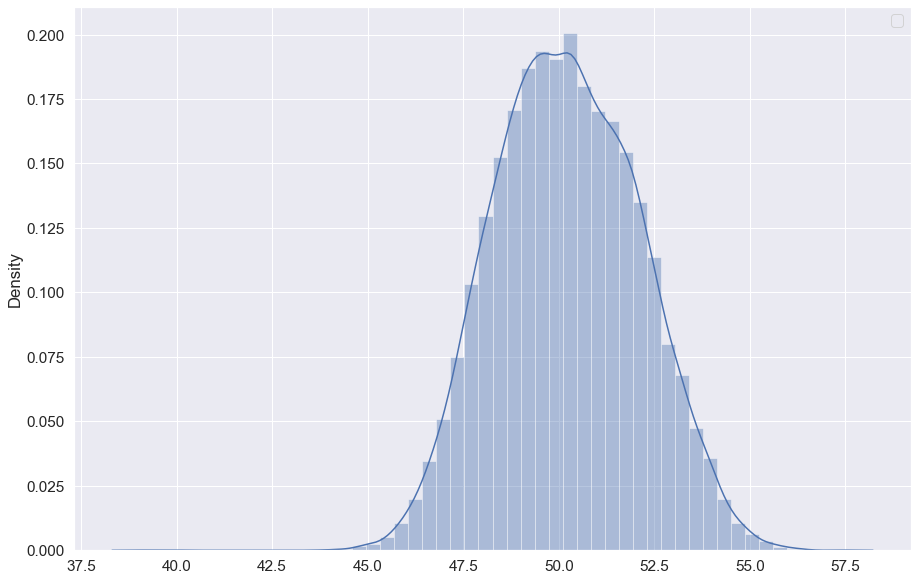

In [76]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions)[: , np.logical_and(y_test < 51, y_test >= 49)])
plt.legend(markerscale=2.5)
#plt.savefig(outputdir+"range_of_predct2.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


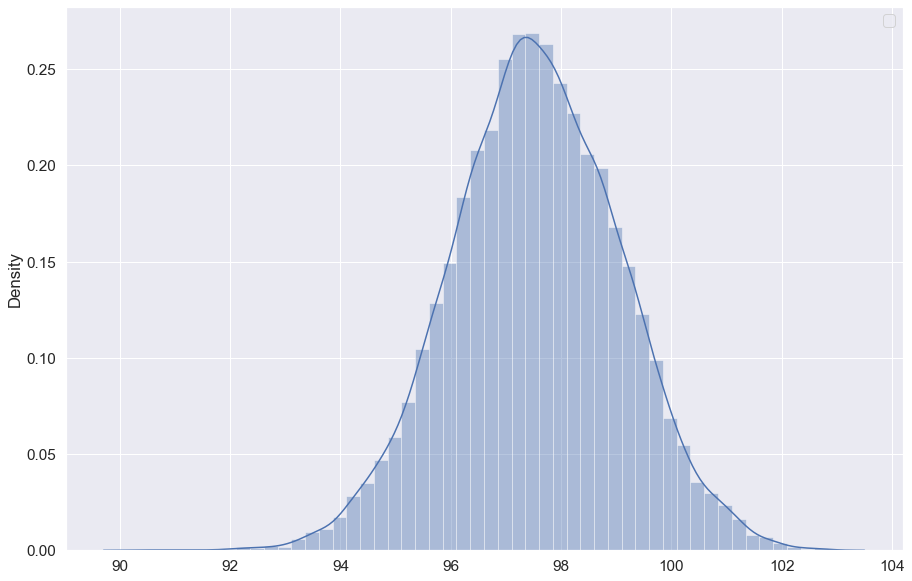

In [77]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions)[: , np.logical_and(y_test < 100, y_test >= 98)])
plt.legend(markerscale=2.5)
#plt.savefig(outputdir+"range_of_predct3.png")

## Error Bars
METHOD 1: Empirical error bars for the posterior using Monte Carlo

METHOD 2: Sigma in output layer

In [78]:
yhat = model(X_test) # model.predict(X_test)

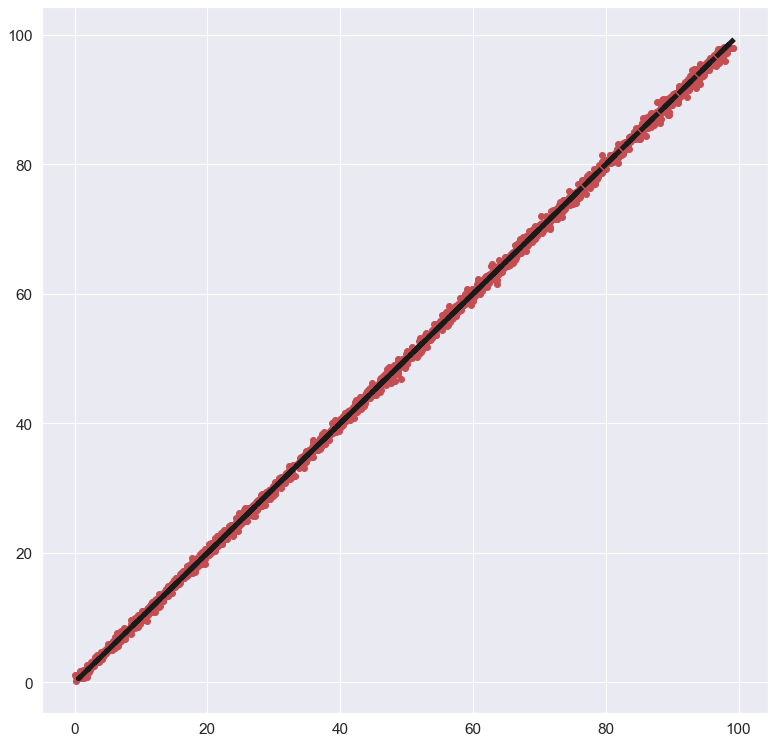

In [79]:
# Compare predicted values
plt.figure(figsize=(13,13))
plt.plot(yhat.mean(), np.mean(np.array(predictions), axis=0), 'r o', label = "")
plt.plot(y_test,y_test, "k--", linewidth=5)

No handles with labels found to put in legend.


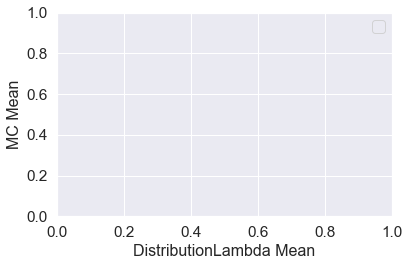

In [80]:
plt.xlabel("DistributionLambda Mean", size = 16)
plt.ylabel("MC Mean", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig(outputdir+"DistributionLambda_MC_mean.png")

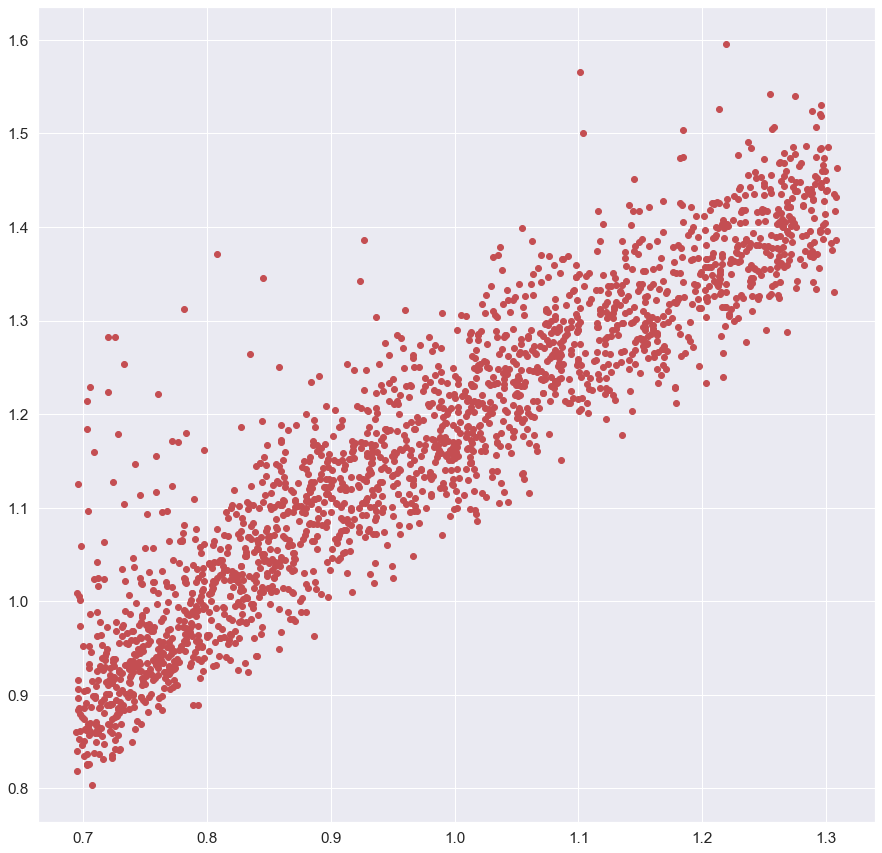

In [81]:
# Compare STDs
plt.figure(figsize=(15,15))
plt.plot(yhat.stddev(), np.std(np.array(predictions), axis=0), 'r o', label = "")
plt.xlabel("DistributionLambda STD", size = 16)
plt.ylabel("MC STD", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig(outputdir+"DistributionLambda_MC_std.png")

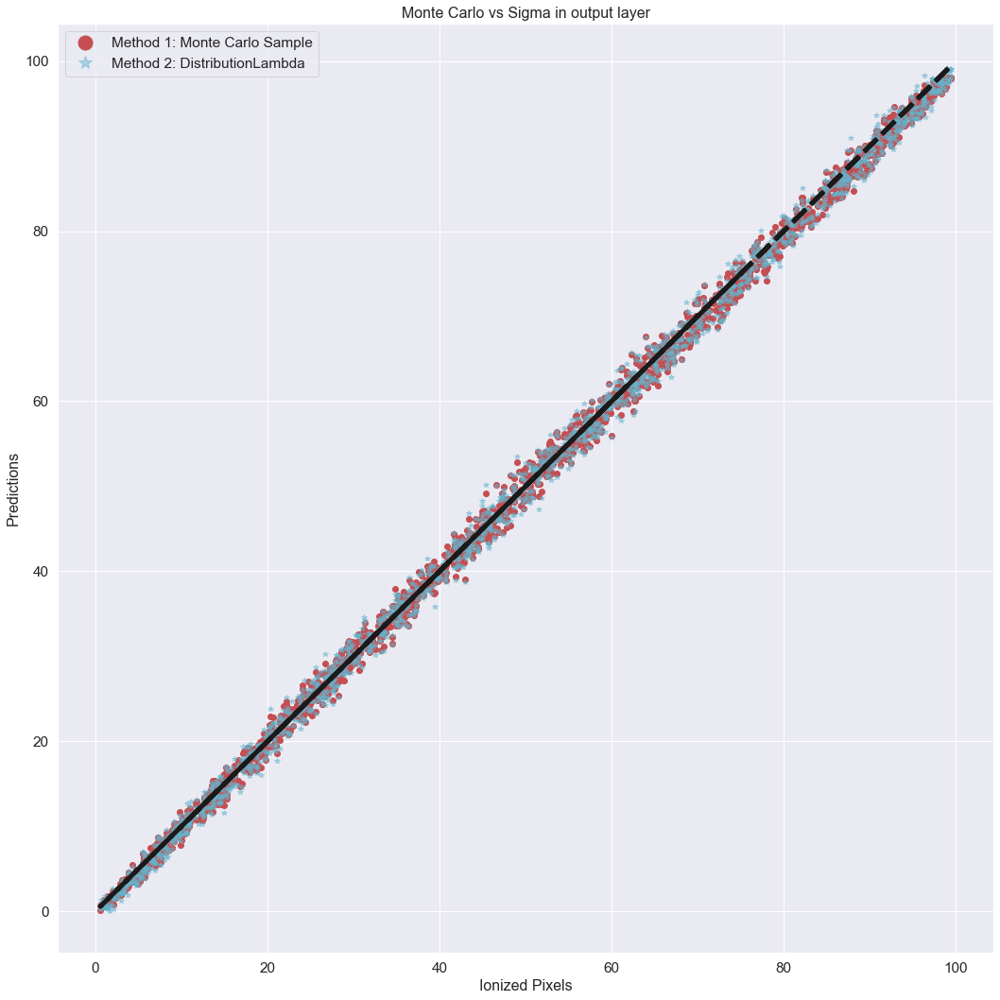

In [83]:
# Plot one-to-one predictions
plt.figure(figsize=(15,15))
plt.title("Monte Carlo vs Sigma in output layer", size = 16)
plt.plot(y_test, np.mean(np.array(predictions), axis=0), 'r o', label = "Method 1: Monte Carlo Sample")
plt.plot(y_test, yhat.mean(), 'c *', alpha = 0.5, label = "Method 2: DistributionLambda")
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig(outputdir+"Monte_Carlo_vs_Sigma_in_output_layer.png")

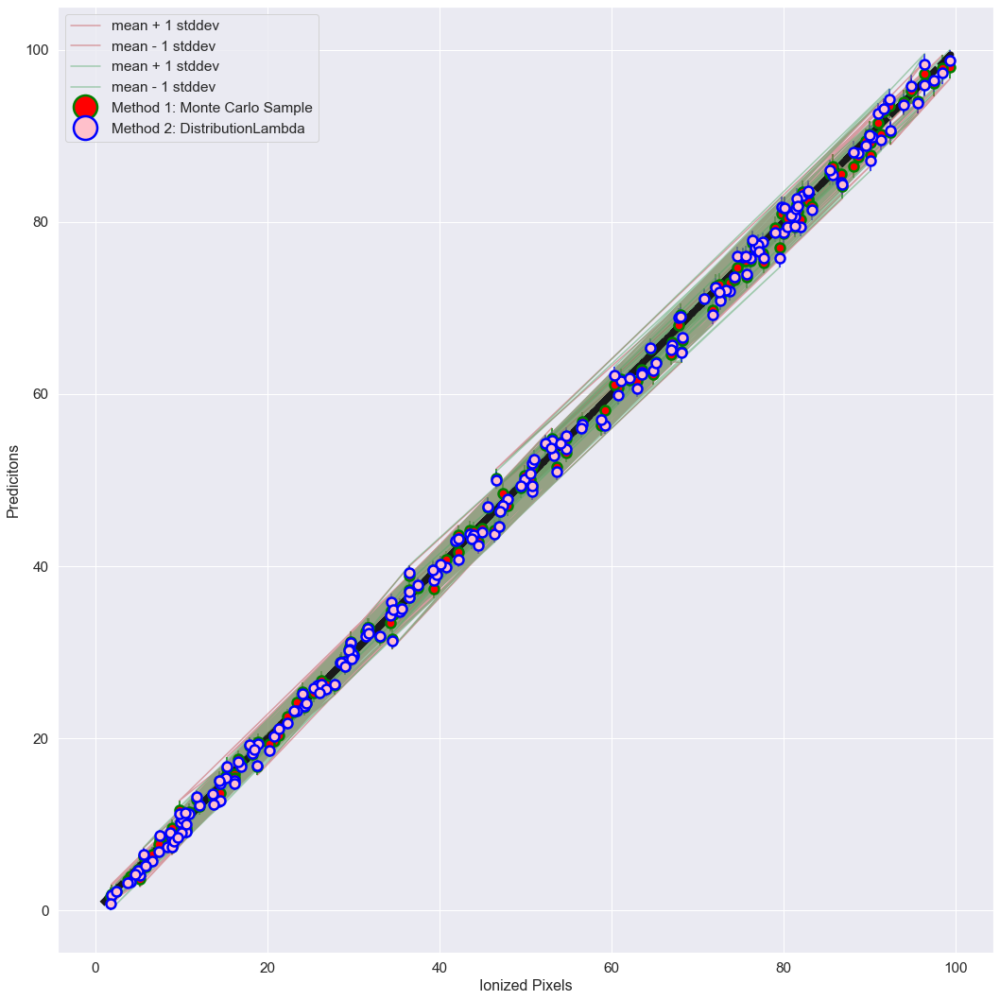

In [84]:
# Plot Error
plt.figure(figsize=(15,15))
#plt.title("Error bars for the posterior using Monte Carlo vs Sigma in output layer", size = 16)

plt.errorbar(y_test[0::10], np.mean(np.array(predictions), axis=0)[0::10], yerr=np.std(predictions, axis=0)[0::10], marker='.',
                          mfc='red', mec='green', c='green', mew=2.5, ms=20, ls='', label="Method 1: Monte Carlo Sample")
plt.errorbar(y_test[0::10], yhat.mean().numpy()[0::10,0], yerr=yhat.stddev().numpy()[0::10,0], marker='.',
                          mfc='pink', mec='blue', c='blue', mew=2.5, ms=20, ls='', label="Method 2: DistributionLambda")

plt.plot(y_test[0::10],np.mean(np.array(predictions), axis=0)[0::10]+np.std(predictions, axis=0)[0::10], 'r-', alpha=0.5,
                  label='mean + 1 stddev'
                 )
plt.plot(y_test[0::10],np.mean(np.array(predictions), axis=0)[0::10]-np.std(predictions, axis=0)[0::10], 'r-', alpha=0.5,
                  label='mean - 1 stddev'
                 )

plt.plot(y_test[0::10],yhat.mean().numpy()[0::10]+yhat.stddev().numpy()[0::10], 'g-', alpha=0.5,
                  label='mean + 1 stddev'
                 )
plt.plot(y_test[0::10],yhat.mean().numpy()[0::10]-yhat.stddev().numpy()[0::10], 'g-', alpha=0.5,
                  label='mean - 1 stddev'
                 )

plt.plot(y_test,y_test, "k--", linewidth=7)
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predicitons", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig(outputdir+"error_plot1.png")


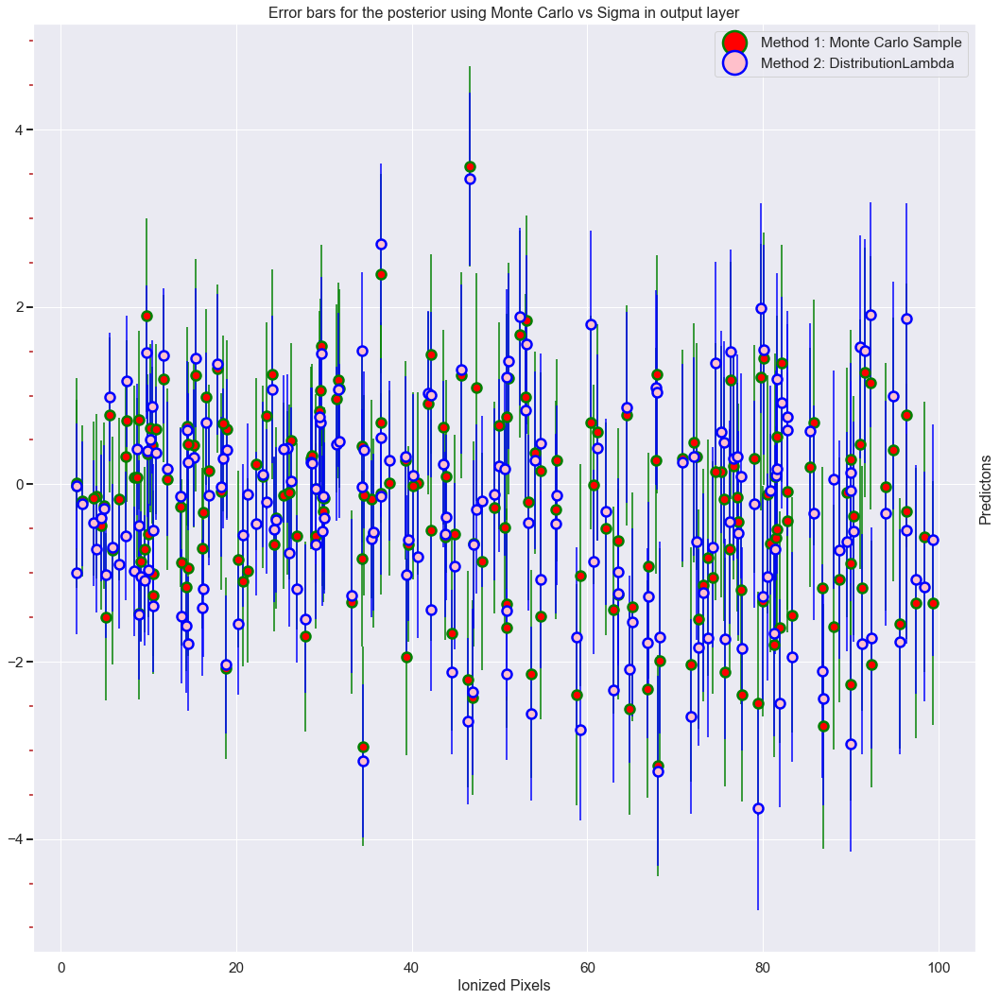

In [85]:
# Plot Error

f=plt.figure(figsize=(15,15))

ax = f.add_subplot(111)
ax.yaxis.tick_left()
ax.yaxis.set_label_position("right")

ax.yaxis.set_minor_locator(AutoMinorLocator())
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=7)
ax.tick_params(which='minor', length=4, color='r')

plt.title("Error bars for the posterior using Monte Carlo vs Sigma in output layer", size = 16)

ax.errorbar(y_test[0::10], (np.mean(np.array(predictions), axis=0)-y_test)[0::10], yerr=np.std(predictions, axis=0)[0::10], marker='.',
                         mfc='red', mec='green', c='green', mew=2.5, ms=20, ls='', label="Method 1: Monte Carlo Sample")
ax.errorbar(y_test[0::10], yhat.mean().numpy()[0::10,0]-y_test[0::10], yerr=yhat.stddev().numpy()[0::10,0], marker='.',
                         mfc='pink', mec='blue', c='blue', mew=2.5, ms=20, ls='', label="Method 2: DistributionLambda")
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictons", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig(outputdir+"error_plot2.png")

In [86]:
print("Print weights")
print(model.weights)

Print weights
[<tf.Variable 'conv2d_flipout_8/kernel_posterior_loc:0' shape=(3, 3, 1, 16) dtype=float32, numpy=
array([[[[ 0.1264692 , -0.13322389,  0.24950828, -0.22015917,
          -0.2858099 , -0.0313394 ,  0.01628547,  0.10175131,
          -0.53437763,  0.02500581,  0.07666028,  0.03834202,
           0.0760252 , -0.39422715,  0.20327741, -0.1759363 ]],

        [[-0.4045463 ,  0.5400181 , -0.28522032,  0.12905611,
          -0.51392883, -1.0871848 , -0.38587987, -0.18596935,
          -0.6518774 ,  0.2564755 , -0.24042891,  0.17976783,
          -0.08400536, -0.3504581 ,  0.16737826, -0.45715088]],

        [[-0.2460932 ,  0.43504158,  0.33428296,  0.04247079,
          -0.2699537 , -0.05216308, -0.11217566,  0.19144225,
           0.00465102, -0.25797   ,  0.4561674 ,  0.00694215,
          -0.3978786 , -0.4650391 ,  0.14444645,  0.09542967]]],


       [[[ 0.09379639,  0.288198  ,  0.7659498 , -0.9782432 ,
           0.09020008, -0.8462841 , -0.10617196, -0.20468573,
         

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


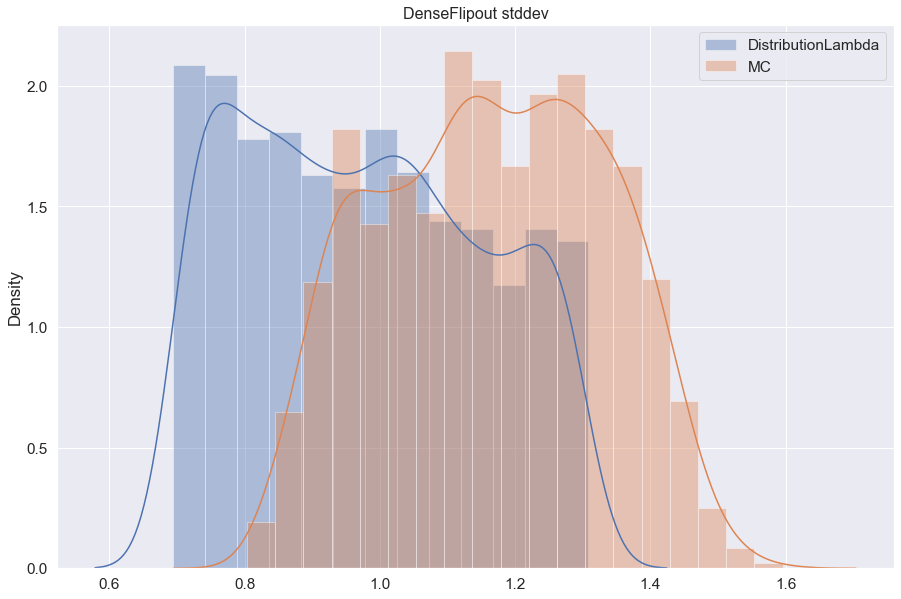

In [87]:
plt.figure(figsize=(15, 10))
sns.distplot(yhat.stddev(),label="DistributionLambda")
sns.distplot(np.std(np.array(predictions), axis=0), label= "MC")
plt.title("DenseFlipout stddev",size = 16 )
plt.legend()
#plt.savfig(outputdir+"DenseFlipout_stddev.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

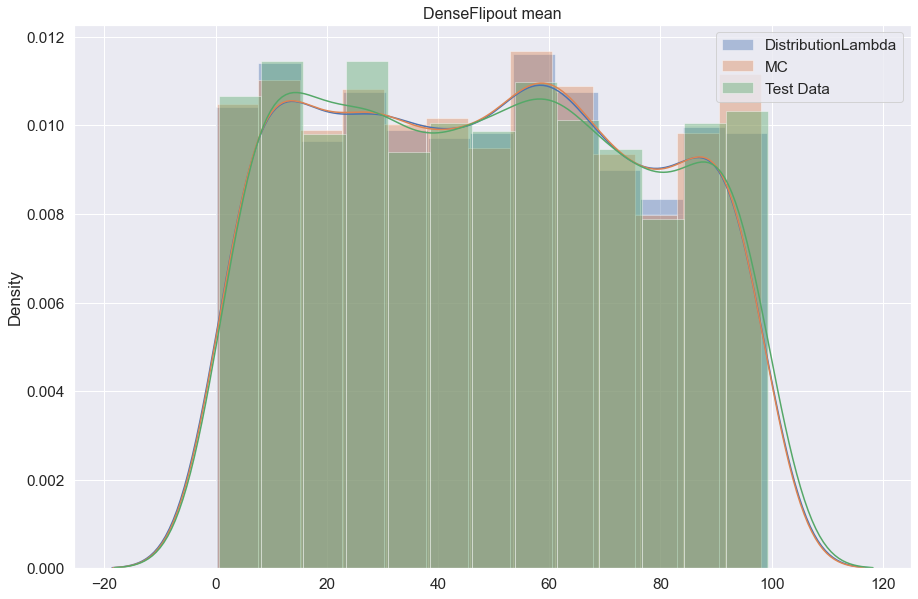

In [88]:
plt.figure(figsize=(15, 10))
sns.distplot(yhat.mean(),label="DistributionLambda")
sns.distplot(np.mean(np.array(predictions), axis=0), label= "MC")
sns.distplot(y_test, label= "Test Data")
plt.title("DenseFlipout mean",size = 16 )
plt.legend()
#plt.savfig(outputdir+"DenseFlipout_mean.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Estimated coefficients:
b_0 = -0.01617138148482411         
b_1 = 1.0061776249002663


/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

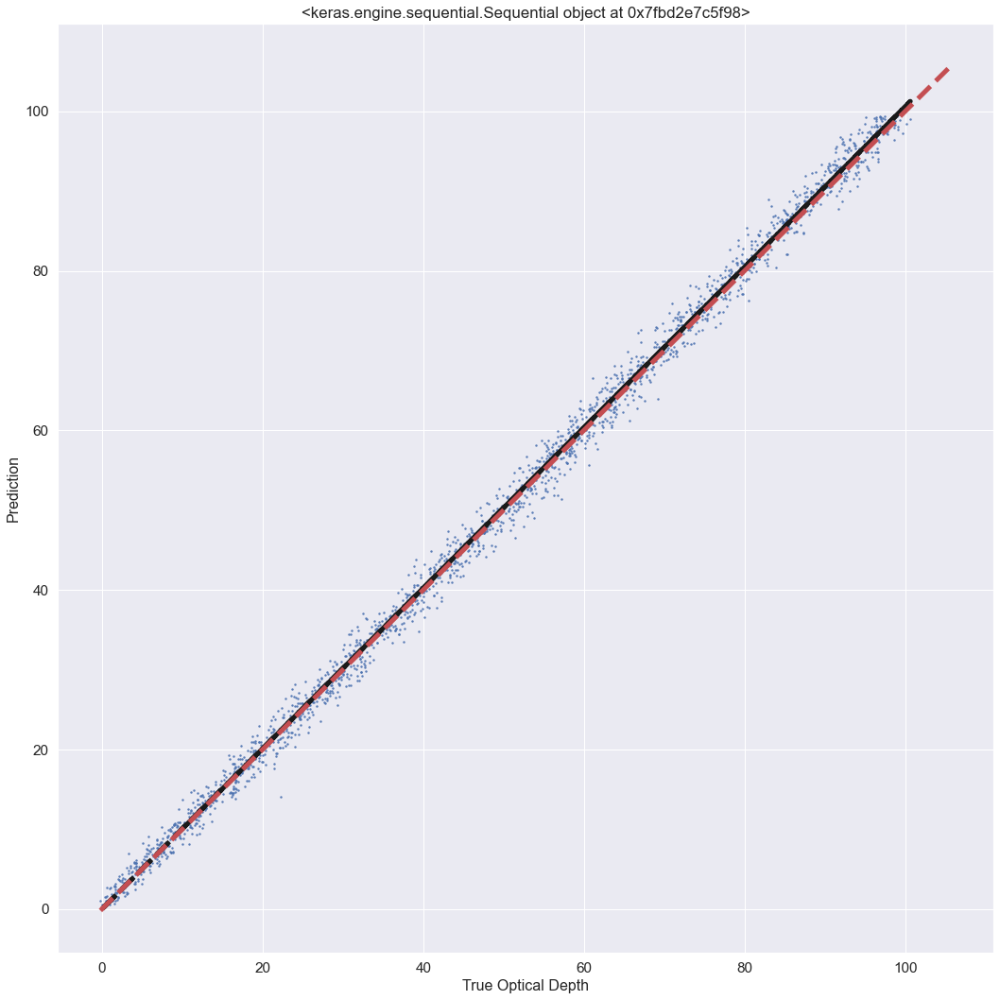

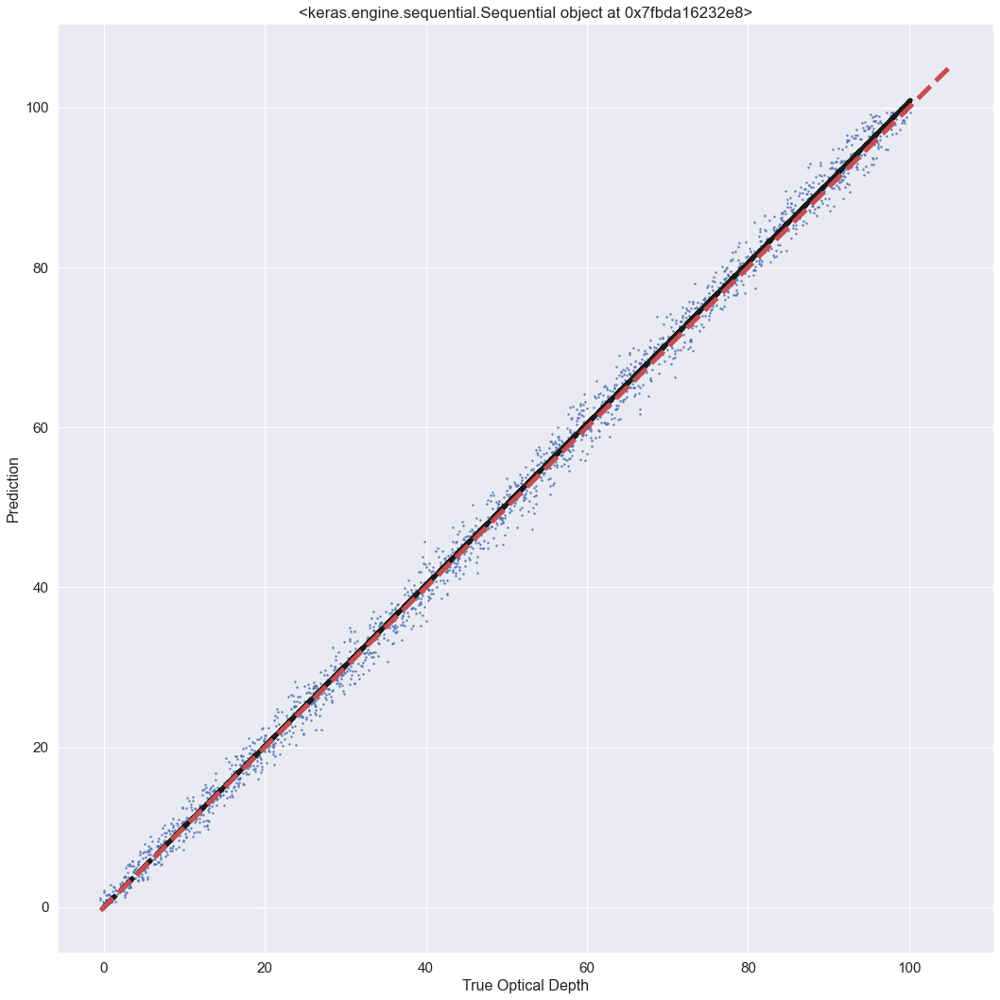

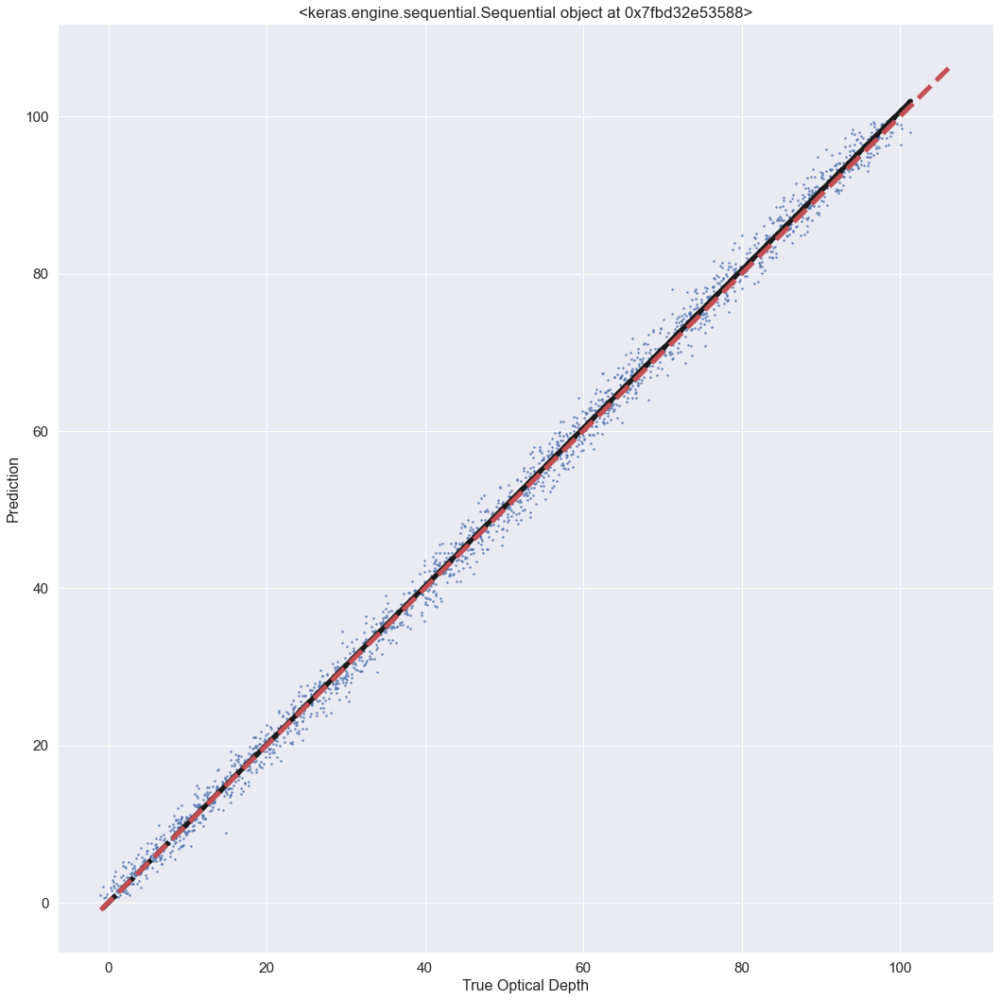

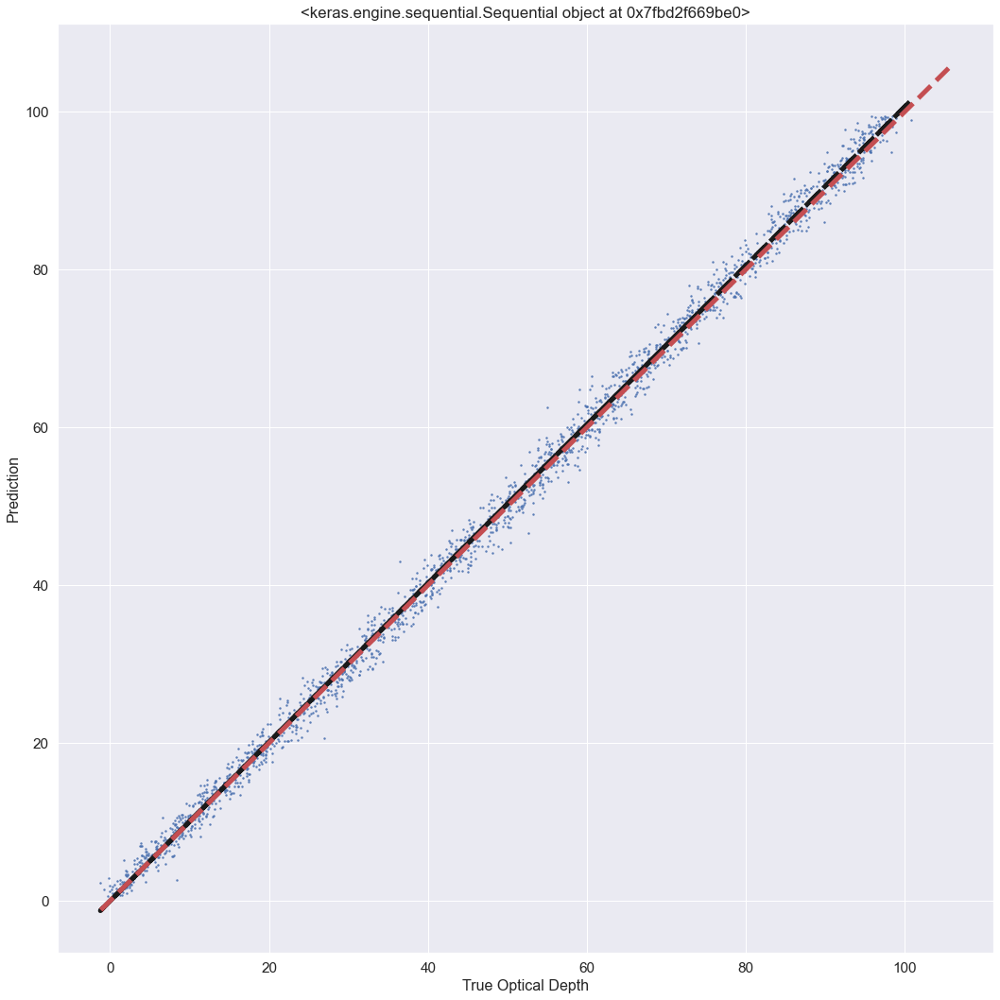

In [89]:
coefficients = []

fp = open(outputdir+"bestmodel_estimated_coefficients_1.log", 'w+')
fp.write("b_0, b_1 \n")

if __name__ == "__main__":

    for p in np.arange(len(tuner.get_best_models(num_models=20))):
        main(x=np.array(predictions)[p], y=y_test, labelname=str(tuner.get_best_models(num_models=15)[p-1]))
    fp.close()

# Empirical Examination of Posterior Distribution

In [90]:
bnn_model = tuner.get_best_models(num_models=1)[0]
sns.set(font_scale=1.4)
def plot_weight_posteriors(names, qm_vals, qs_vals):
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(1, 2, 1)
    for n, qm in zip(names, qm_vals):
        sns.distplot(tf.reshape(qm, shape=[-1]), ax=ax, label=n)
    ax.set_title("weight means",size = 16 )
    ax.set_xlim([-1.5, 1.5])
    ax.legend()
    ax = fig.add_subplot(1, 2, 2)
    for n, qs in zip(names, qs_vals):
        sns.distplot(tf.reshape(qs, shape=[-1]), ax=ax)
    ax.set_title("weight stddevs", size = 16)
    ax.set_xlim([0, 1.0])
    fig.tight_layout()
    #plt.savefig(outputdir+"empirical_examination_DistributionLambda.png")#show()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
dense_flipout (DenseFlipout) (None, 15, 15, 8)         264       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         1160      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
dense_flipout_1 (DenseFlipou (None, 15, 15, 4)         6

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

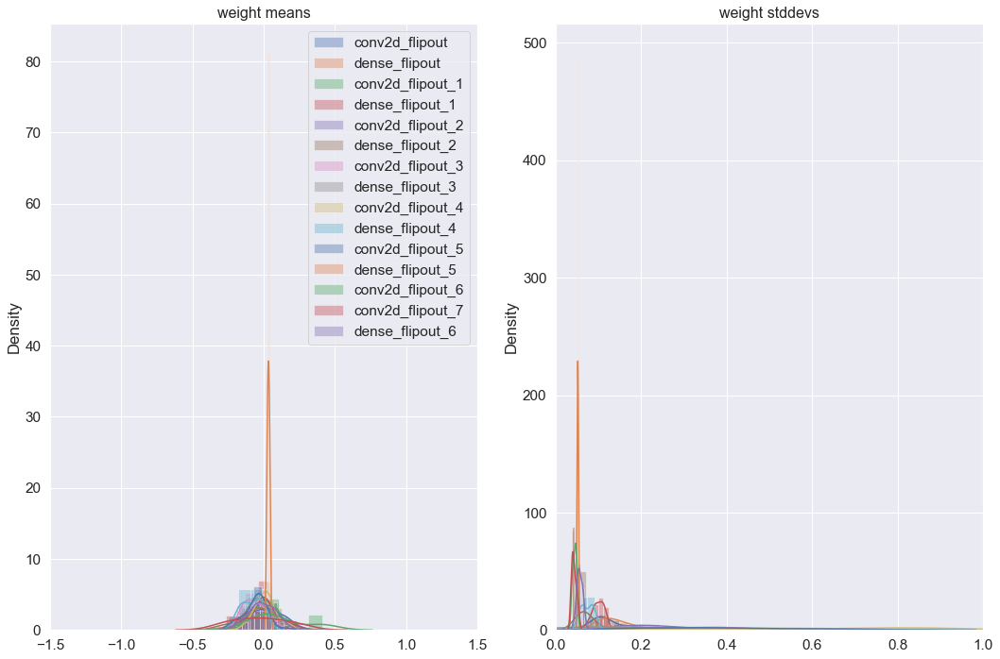

In [91]:
names = [layer.name for layer in bnn_model.layers if "flipout" in layer.name]
qm_vals = [
    layer.kernel_posterior.mean()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]
qs_vals = [
    layer.kernel_posterior.stddev()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]

plot_weight_posteriors(names, qm_vals, qs_vals)

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


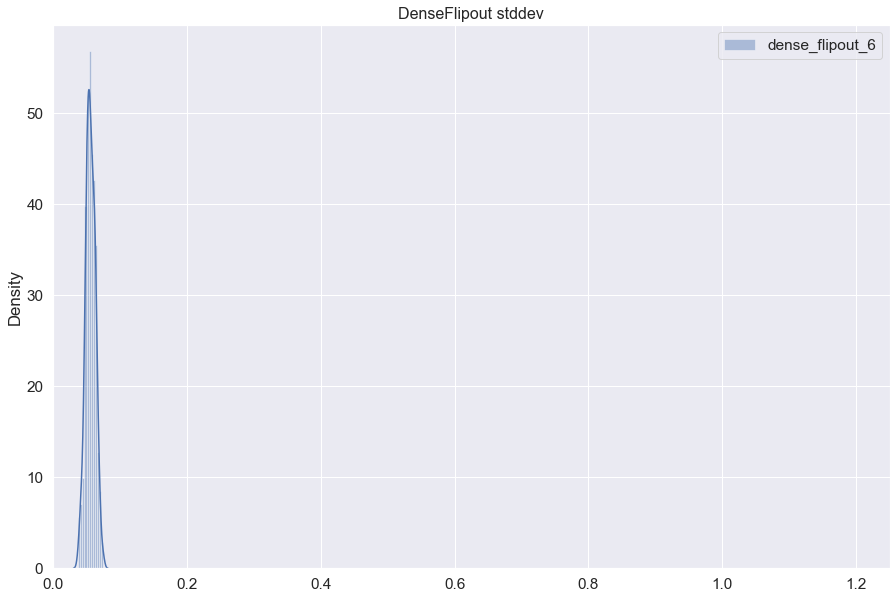

In [92]:
plt.figure(figsize=(15, 10))
sns.distplot(tf.reshape(bnn_model.layers[-1].kernel_posterior.stddev(), shape=[-1]),
             label="{}".format(str(bnn_model.layers[-1].name)))
plt.title("DenseFlipout stddev",size = 16 )
plt.xlim([0, 1.25])
plt.legend()
#plt.savefig(outputdir+"DenseFlipout_stddev_DistributionLambda.png")

# Model 3

## Monte Carlo 

In [94]:
#outputdir = 
if os.path.isdir(project_name): # check to see if path exists
    os.system("rm -rvf {}".format(project_name))

def train_test_og_model(hp):

    # Making a model.
    model = Sequential()

    # Added Layers.
    model.add(tfp.layers.Convolution2DFlipout(filters = 16,
                                              input_shape=(nx, ny, 1), kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(tfp.layers.Convolution2DFlipout(filters = 8,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    
    model.add(Flatten())
    model.add(tfp.layers.DenseFlipout(1, activation="linear", kernel_divergence_fn=kl_divergence_function,))

    #for l in range(hp.Int('loss', 0, len(losses))):
    model.compile(optimizer= "adam", loss = hp.Choice('loss_type', ["mse", "mae", "mape", "Mean_Squared_over_true_Error"], ordered=False, default="mse"), metrics=["mse"])

    # Visualize Model
    print(model.summary())

    return model

# Start Tuning based on low validation loss
tuner = RandomSearch(train_test_og_model,
                     objective='val_loss', # 'loss', 'val_loss', 'val_accuracy'
                     max_trials= num_models,# specify the number of different models to try
                     executions_per_trial=1, #2,
                     directory=outputdir,
                     seed=42,
                     project_name=project_name)

# Print a summary of the search space
tuner.search_space_summary()

# Show the best models, their hyperparameters, and the resulting metrics.
tuner.search(X_train, y_train,
                          epochs=5,#hp.Int('epoch',min_value=10,max_value=HP_EPOCH,step=10,default=10),
                          validation_data=(X_test, y_test),
                          batch_size=HP_BATCH_SIZE,
                         #callbacks=[plotlosses],
                         verbose=1)

Trial 4 Complete [00h 00m 59s]
val_loss: 4.262815475463867

Best val_loss So Far: 0.5193189382553101
Total elapsed time: 00h 04m 07s
INFO:tensorflow:Oracle triggered exit


In [95]:
tuner.results_summary()

Results summary
Results in ./toy_model_tuner_32
Showing 10 best trials
Objective(name='val_loss', direction='min')
Trial summary
Hyperparameters:
loss_type: Mean_Squared_over_true_Error
Score: 0.5193189382553101
Trial summary
Hyperparameters:
loss_type: mae
Score: 4.262815475463867
Trial summary
Hyperparameters:
loss_type: mape
Score: 13.368800163269043
Trial summary
Hyperparameters:
loss_type: mse
Score: 17.06515121459961


In [96]:
# Retrieve the best model.
best_model = tuner.get_best_models(num_models=1)[0]

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392)               0

In [97]:
# Save best hyperperam Model
print("saving best hyperparameter model ...")
best_model.save(outputdir+"hyperParam_model_{}.h5".format(idx))

# Save best hyperperam Model Weights
print("saving best hyperparameter model weights ...")
best_model.save_weights(outputdir+"hyperParam_model_weights_{}.h5".format(idx))

# Save all other models so that we can see how the model behaves based on complexity
for indx in np.arange(len(tuner.get_best_models(num_models=20))):
    model_ = tuner.get_best_models(num_models=num_models)[indx]
    # Save Model weights
    model_.save_weights(outputdir+"hyperParam_weights_{}_{}.h5".format(str(indx+1),idx))
    print("Saving ... "+outputdir+"hyperParam_weights_{}_{}.h5".format(str(indx+1),idx))
    # Save Model
    model_.save(outputdir+"hyperParam_model_{}_{}.h5".format(str(indx+1),idx))
    print("Saving ... "+outputdir+"hyperParam_model_{}_{}.h5".format(str(indx+1),idx))

saving best hyperparameter model ...
saving best hyperparameter model weights ...
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
________________________________________

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392)               0

Saving ... hyperParam_weights_1_32.h5
Saving ... hyperParam_model_1_32.h5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
________________________________________________

Saving ... hyperParam_weights_2_32.h5
Saving ... hyperParam_model_2_32.h5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
________________________________________________

Saving ... hyperParam_weights_3_32.h5
Saving ... hyperParam_model_3_32.h5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
________________________________________________

Saving ... hyperParam_weights_4_32.h5
Saving ... hyperParam_model_4_32.h5


In [98]:
# print best performing model's loss function
print("Print potential best model")
print(tuner.get_best_models(num_models=1)[0].loss)

Print potential best model
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            

In [99]:
print("Print all models")
print(tuner.get_best_models(num_models=20))

Print all models
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392

In [100]:
print(tuner.search_space_summary())

Search space summary
Default search space size: 1
loss_type (Choice)
{'default': 'mse', 'conditions': [], 'values': ['mse', 'mae', 'mape', 'Mean_Squared_over_true_Error'], 'ordered': False}
None


In [101]:
print(tuner.results_summary())

Results summary
Results in ./toy_model_tuner_32
Showing 10 best trials
Objective(name='val_loss', direction='min')
Trial summary
Hyperparameters:
loss_type: Mean_Squared_over_true_Error
Score: 0.5193189382553101
Trial summary
Hyperparameters:
loss_type: mae
Score: 4.262815475463867
Trial summary
Hyperparameters:
loss_type: mape
Score: 13.368800163269043
Trial summary
Hyperparameters:
loss_type: mse
Score: 17.06515121459961
None


Starting MC Sampling
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None,

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

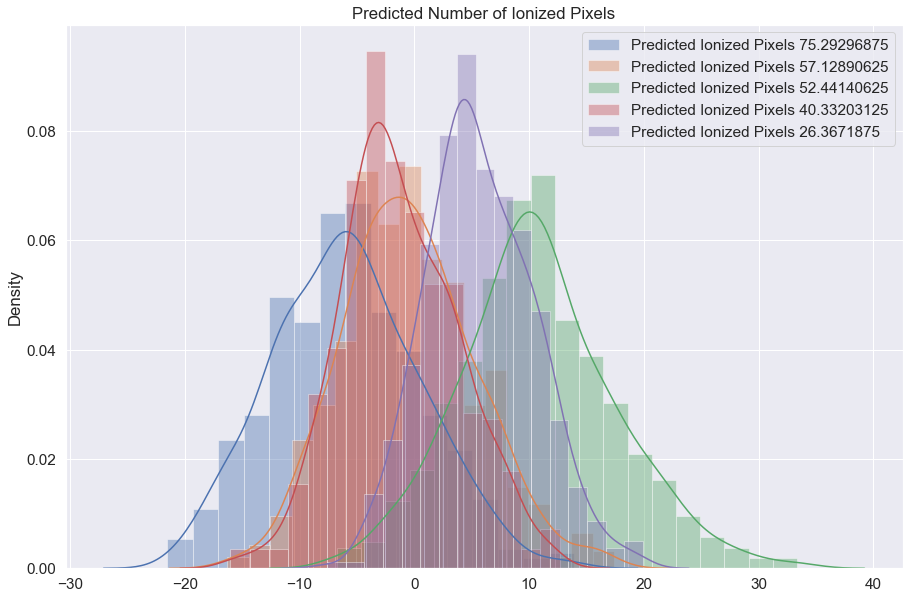

In [102]:
# Do MC Sampling
print("Starting MC Sampling")
bestmodel=tuner.get_best_models(num_models=1)[0]#.predict(X_test)
pred = []

for i in range(500):
    y_p = bestmodel.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])
    pred.append(y_p)

plt.figure(figsize=(15, 10))
plt.title("Predicted Number of Ionized {}".format("Pixels",size = 16 ))
sns.distplot(np.array(pred)[:,0]-y_test[0],label="Predicted Ionized Pixels {}".format(str(y_test[0])))
sns.distplot(np.array(pred)[:,1]-y_test[1],label="Predicted Ionized Pixels {}".format(str(y_test[1])))
sns.distplot(np.array(pred)[:,2]-y_test[2],label="Predicted Ionized Pixels {}".format(str(y_test[2])))
sns.distplot(np.array(pred)[:,3]-y_test[3],label="Predicted Ionized Pixels {}".format(str(y_test[3])))
sns.distplot(np.array(pred)[:,4]-y_test[4],label="Predicted Ionized Pixels {}".format(str(y_test[4])))
plt.legend(markerscale=2.5)
#plt.savefig("predicted_number_of_ionized_pixels.png")

No handles with labels found to put in legend.


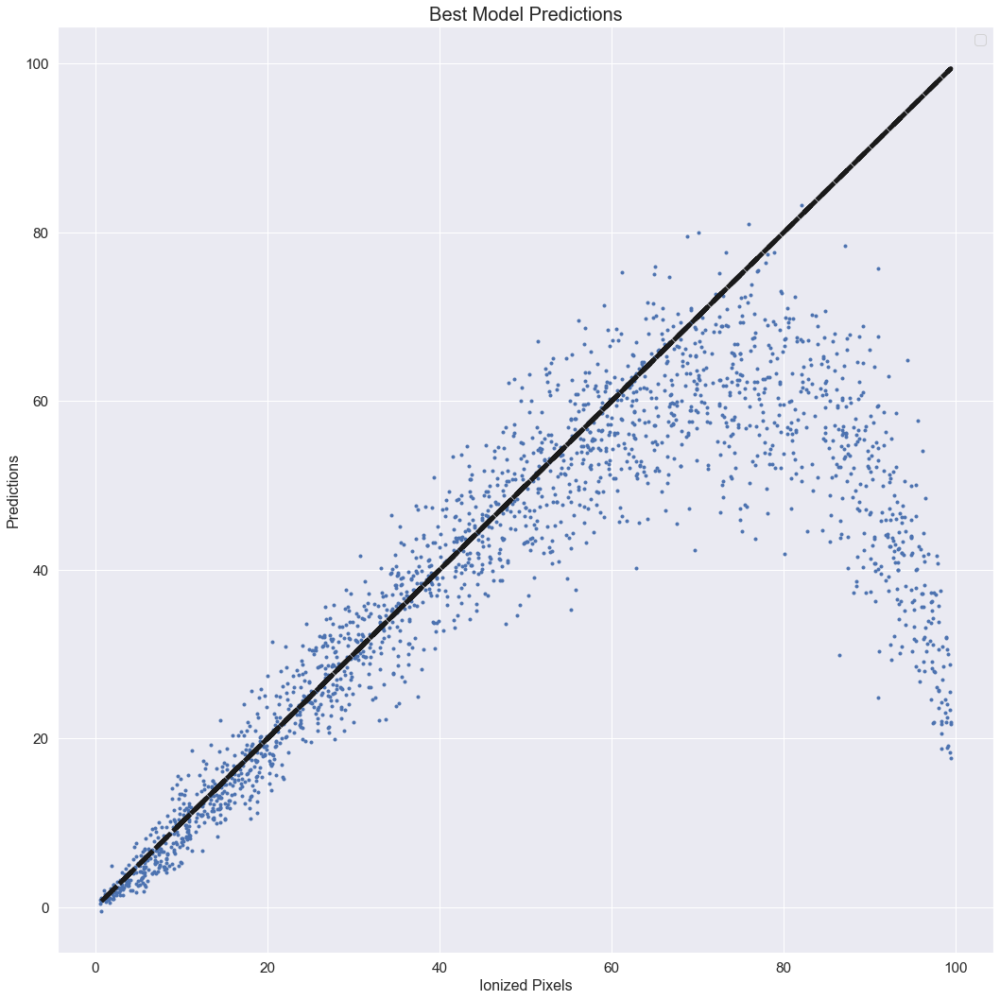

In [103]:
plt.figure(figsize=(15,15))
plt.title("Best Model Predictions", size = 20)
plt.plot(y_test, np.mean(np.array(pred), axis=0), '.')#, label = str(tuner.get_best_models(num_models=num_models)[l-1]))
plt.plot(y_test,y_test, "k--", linewidth=5)
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("BestModel_Predictions.png")

In [104]:
# make predictions
prediction = []
predictions = np.empty([len(X_test),])

for m in tuner.get_best_models(num_models=num_models):
    for i in range(5):
        y_p = m.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])
        prediction.append(y_p) # (500, 100, 1) = (# of masks, # of datasets, # of classes)
    prediction = np.mean(np.array(prediction), axis=0)
    predictions = np.vstack((predictions, prediction))
    prediction = []
print(X_test.shape)
print(predictions.shape)
print(y_test.shape)

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392)               0

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392)               0

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392)               0

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392)               0

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392)               0

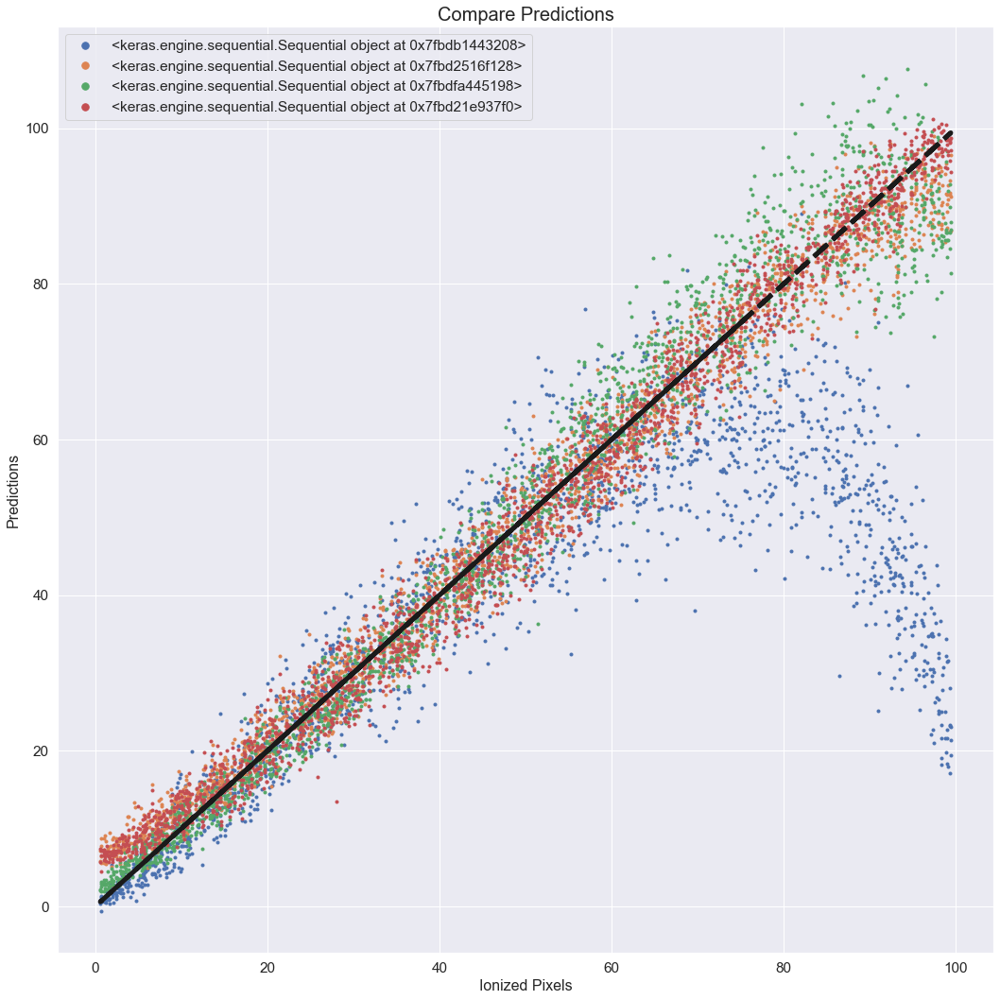

In [105]:
# Plot one-to-one predictions
plt.figure(figsize=(15,15))
plt.title("Compare Predictions", size = 20)

for l in np.arange(1,5):
    plt.plot(y_test, predictions[l], '.', label = str(tuner.get_best_models(num_models=num_models)[l-1]))
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("Compare_Predictions.png")

# Empirical Examination of Posterior Distribution

In [106]:
bnn_model = tuner.get_best_models(num_models=1)[0]
sns.set(font_scale=1.4)
def plot_weight_posteriors(names, qm_vals, qs_vals):
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(1, 2, 1)
    for n, qm in zip(names, qm_vals):
        sns.distplot(tf.reshape(qm, shape=[-1]), ax=ax, label=n)
    ax.set_title("weight means",size = 16 )
    ax.set_xlim([-1.5, 1.5])
    ax.legend()
    ax = fig.add_subplot(1, 2, 2)
    for n, qs in zip(names, qs_vals):
        sns.distplot(tf.reshape(qs, shape=[-1]), ax=ax)
    ax.set_title("weight stddevs", size = 16)
    ax.set_xlim([0, 1.0])
    fig.tight_layout()
    #plt.savefig("empirical_examination_mc.png")#show()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392)               0

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

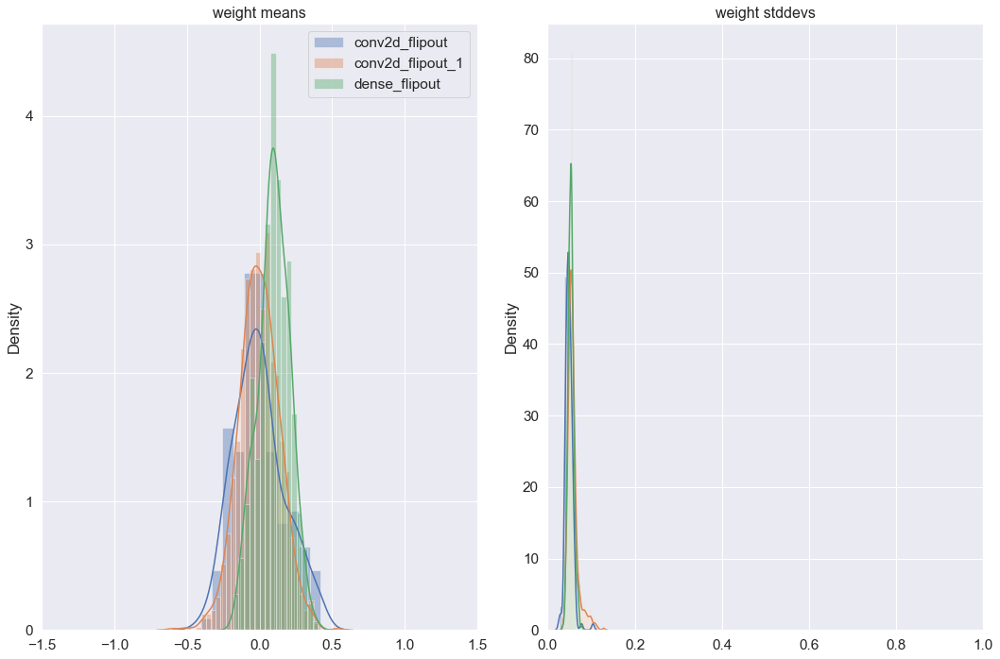

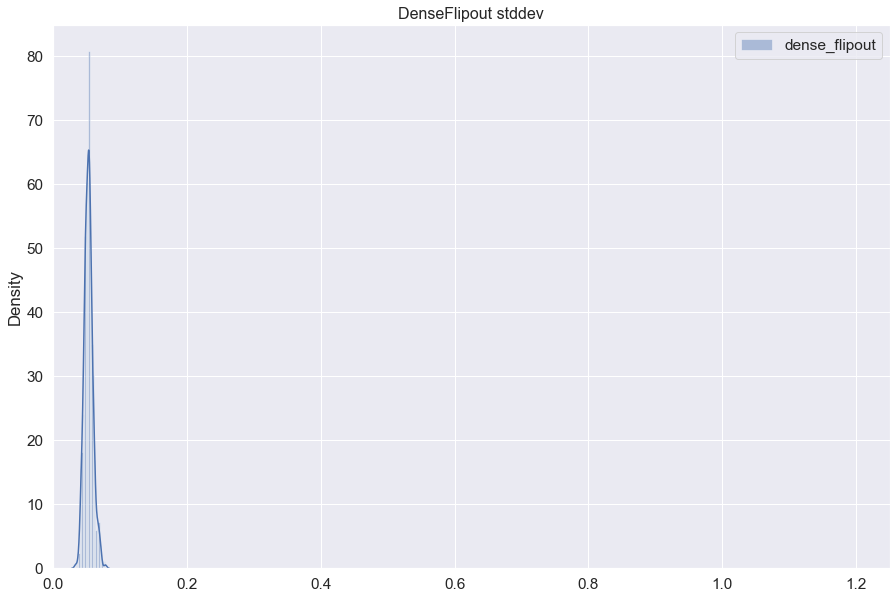

In [107]:
names = [layer.name for layer in bnn_model.layers if "flipout" in layer.name]
qm_vals = [
    layer.kernel_posterior.mean()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]
qs_vals = [
    layer.kernel_posterior.stddev()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]

plot_weight_posteriors(names, qm_vals, qs_vals)

plt.figure(figsize=(15, 10))
sns.distplot(tf.reshape(bnn_model.layers[-1].kernel_posterior.stddev(), shape=[-1]),
             label="{}".format(str(bnn_model.layers[-1].name)))
plt.title("DenseFlipout stddev",size = 16 )
plt.xlim([0, 1.25])
plt.legend()
#plt.savefig("DenseFlipout_stddev_mc.png")#plt.show()

# Learn STD and Mean

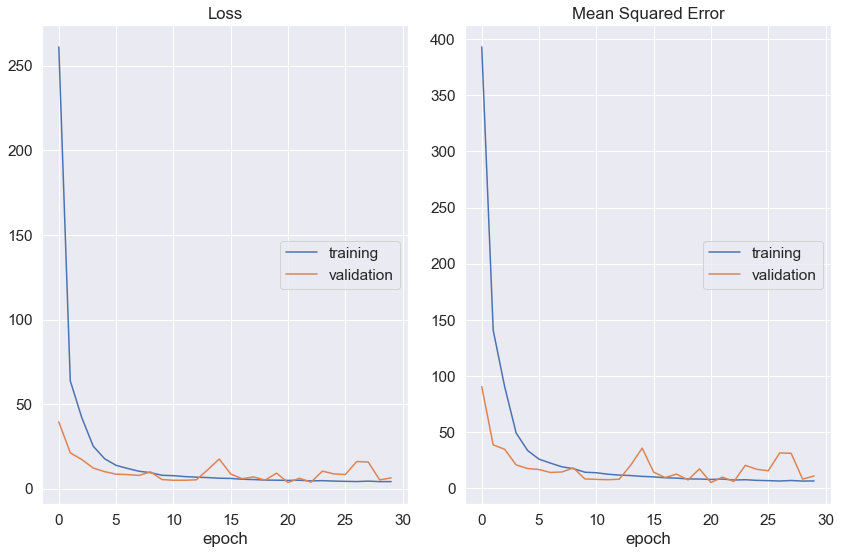

Loss
	training         	 (min:    4.191, max:  261.210, cur:    4.210)
	validation       	 (min:    3.662, max:   39.496, cur:    6.410)
Mean Squared Error
	training         	 (min:    6.442, max:  393.146, cur:    6.557)
	validation       	 (min:    5.164, max:   90.595, cur:   10.977)
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout_2 (Conv2DFlip (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization_2 (Batch (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_3 (Batch (

In [108]:
def train_test_og_model():
    # Making a model.
    model = Sequential()

    # Added Layers.
    model.add(tfp.layers.Convolution2DFlipout(filters = 16,
                                              input_shape=(nx, ny, 1), kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(tfp.layers.Convolution2DFlipout(filters = 8,
                                              kernel_size=3, activation = 'relu',
                                              kernel_divergence_fn=kl_divergence_function,
                                              padding = 'same'
                                              ))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Flatten())
    model.add(tfp.layers.DenseFlipout(1, activation="linear", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.DistributionLambda(
        lambda t: tfd.Normal(loc=t[..., :1],
                             #scale = 1)))
                             scale=1e-3 + tf.math.softplus(0.01 * t[..., :1]))))

    model.compile(optimizer= "adam", loss = "neg_log_likelihood", metrics=["mse"])

    plotlosses = PlotLossesKeras()

    model.fit(X_train, y_train, validation_data=(X_test, y_test),
              epochs=HP_EPOCH, batch_size=HP_BATCH_SIZE,
              callbacks=[plotlosses],
              verbose=1)

    # Visualize Model
    print(model.summary())

    loss = model.evaluate(X_test, y_test)
    return model

model = train_test_og_model()

In [109]:
# make predictions
print("Make MC predictions")
predictions = []
for i in range(500):
    y_p = model.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])
    predictions.append(y_p) # (500, 100, 1) = (# of masks, # of datasets, # of classes)

prediction = np.mean(np.array(predictions), axis=0)
print(X_test.shape)
print(prediction.shape)
print(y_test.shape)

Make MC predictions
(2000, 32, 32, 1)
(2000,)
(2000,)


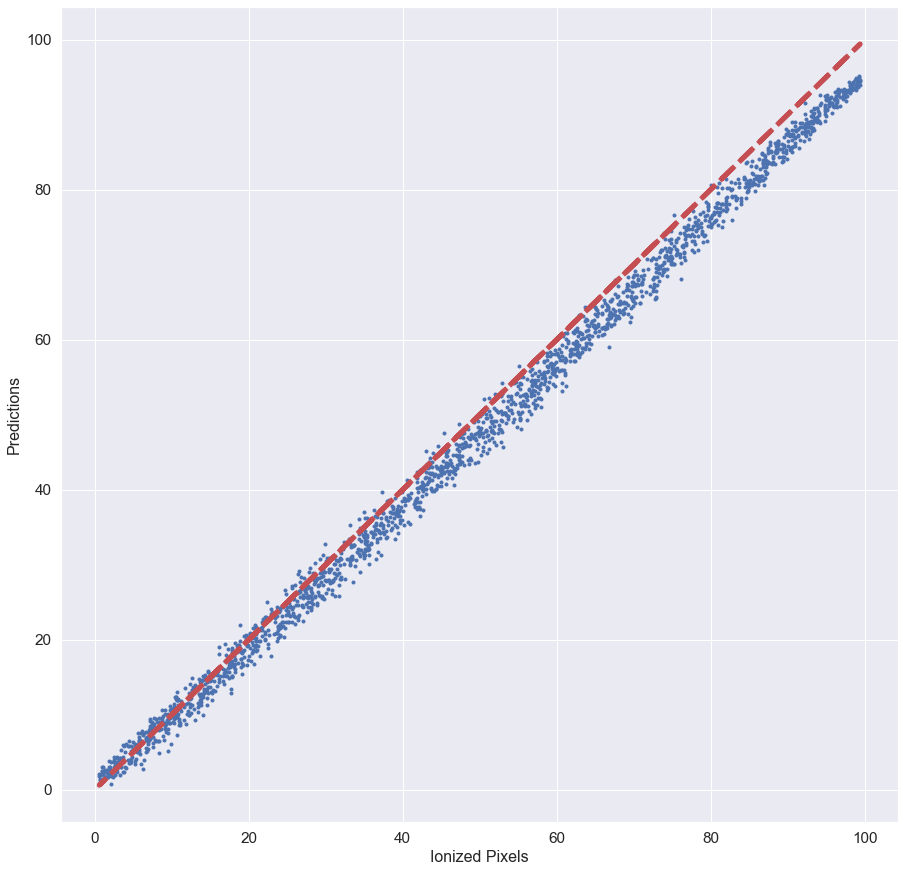

In [110]:
# Plot one-to-one predictions
plt.figure(figsize=(15,15))
plt.title("")
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.plot(y_test, prediction, '.')
plt.plot(y_test,y_test, "r--", linewidth=5)
#plt.savefig("Empirical_one2one_plots.png")#plt.show()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

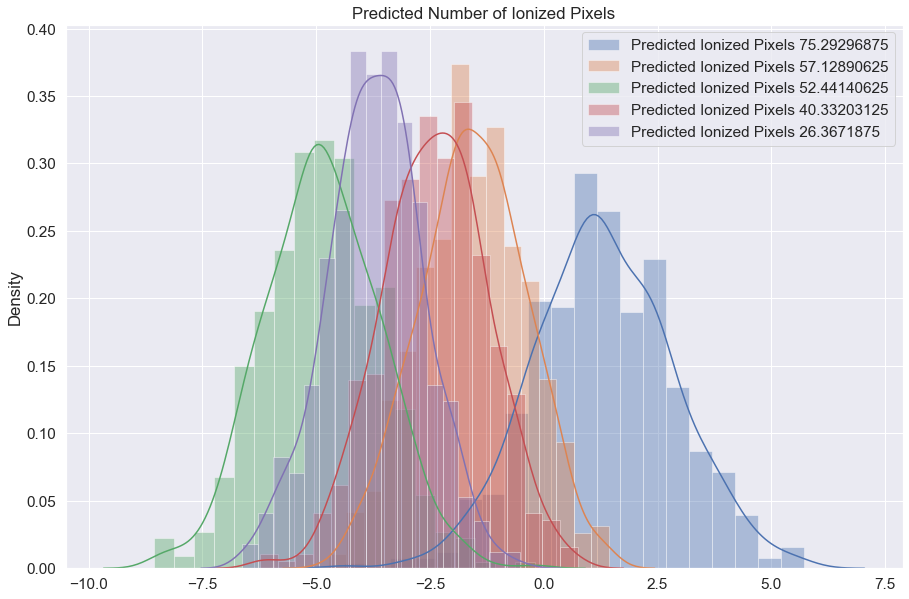

In [111]:
plt.figure(figsize=(15, 10))
plt.title("Predicted Number of Ionized {}".format("Pixels",size = 16 ))
sns.distplot(np.array(predictions)[:,0]-y_test[0],label="Predicted Ionized Pixels {}".format(str(y_test[0])))
sns.distplot(np.array(predictions)[:,1]-y_test[1],label="Predicted Ionized Pixels {}".format(str(y_test[1])))
sns.distplot(np.array(predictions)[:,2]-y_test[2],label="Predicted Ionized Pixels {}".format(str(y_test[2])))
sns.distplot(np.array(predictions)[:,3]-y_test[3],label="Predicted Ionized Pixels {}".format(str(y_test[3])))
sns.distplot(np.array(predictions)[:,4]-y_test[4],label="Predicted Ionized Pixels {}".format(str(y_test[4])))
plt.legend(markerscale=2.5)
#plt.savefig("predicted_number_of_ionized_empirical.png")#plt.show()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


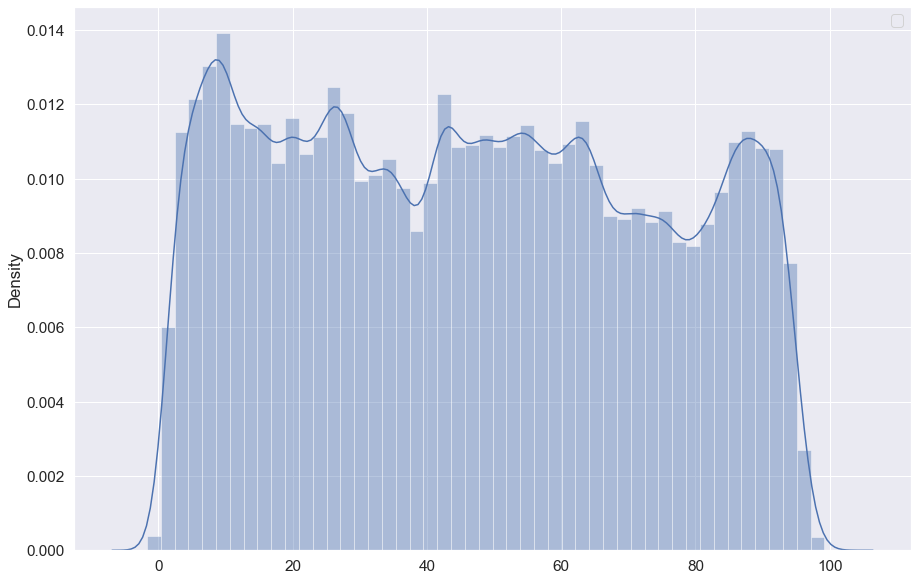

In [112]:
# Plot the distribution of the predictions within a certain range.
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions))
plt.legend(markerscale=2.5)
#plt.savefig("range_of_predct0.png")#plt.show()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


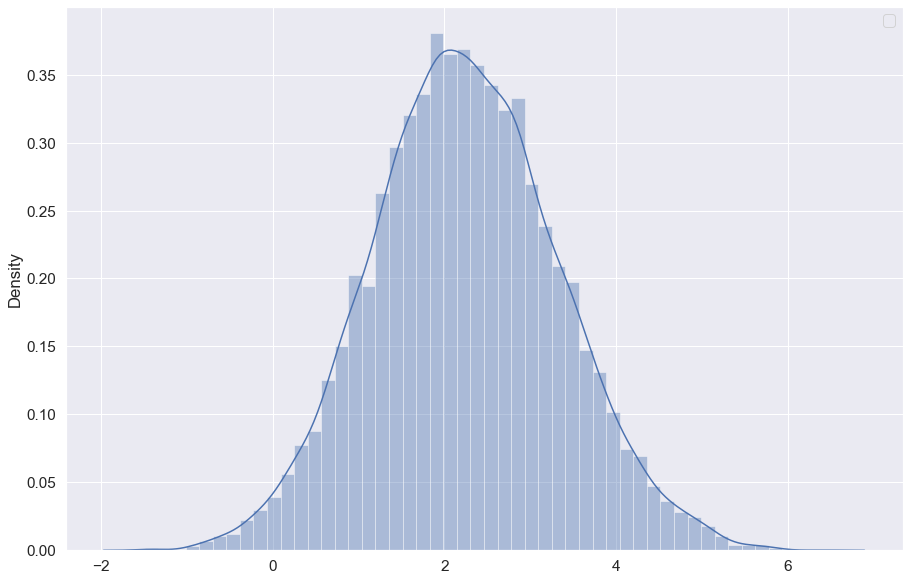

In [113]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions)[: , np.logical_and(y_test < 2, y_test >= 0)])
plt.legend(markerscale=2.5)
#plt.savefig("range_of_predct1.png")#plt.show()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


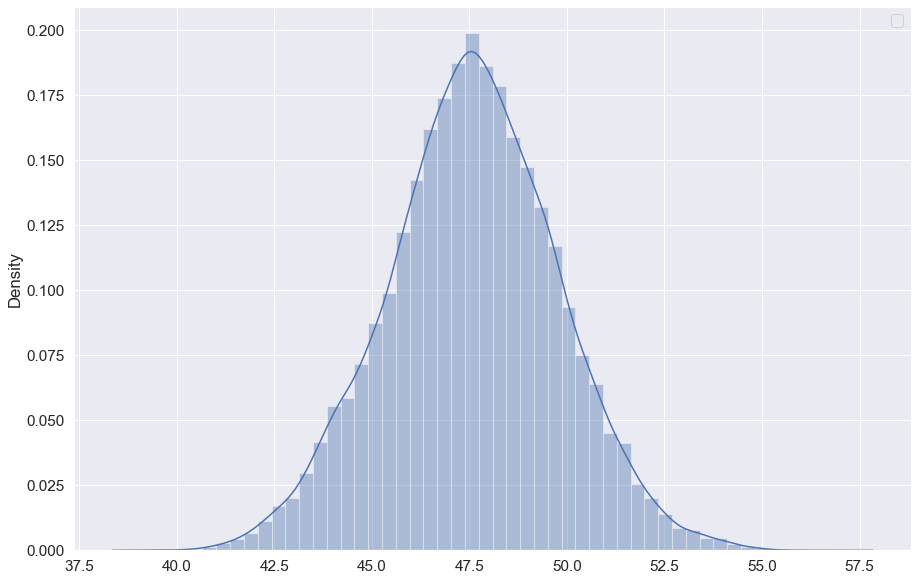

In [114]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions)[: , np.logical_and(y_test < 51, y_test >= 49)])
plt.legend(markerscale=2.5)
#plt.savefig("range_of_predct2.png")#plt.show()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


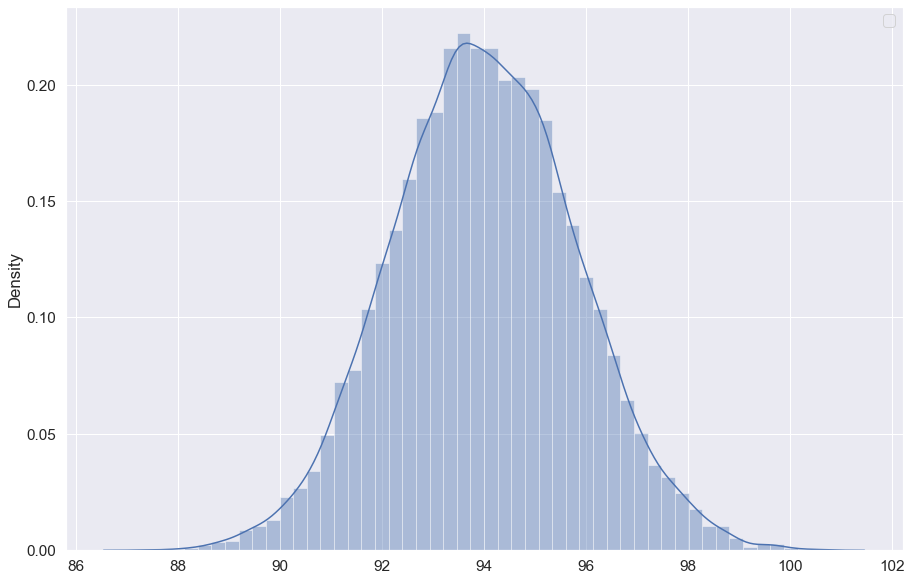

In [115]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions)[: , np.logical_and(y_test < 100, y_test >= 98)])
plt.legend(markerscale=2.5)
#plt.savefig("range_of_predct3.png")#plt.show()

# Error Bars
METHOD 1: Empirical error bars for the posterior using Monte Carlo

METHOD 2: Sigma in output layer


No handles with labels found to put in legend.


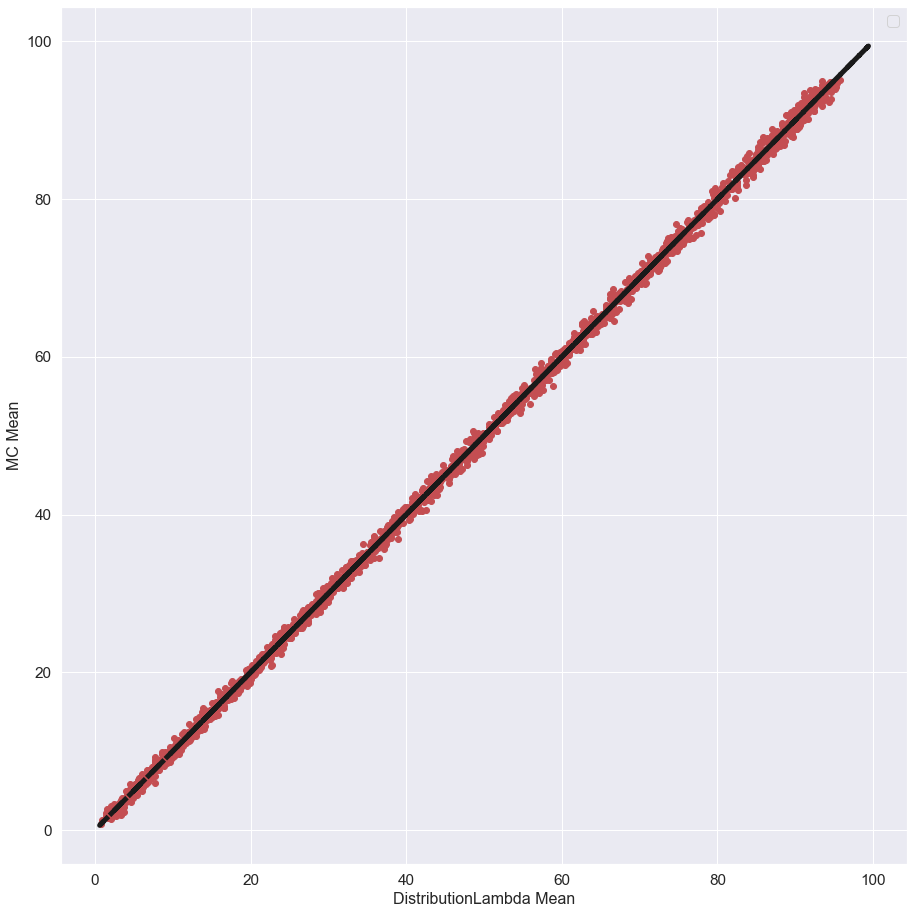

In [116]:
yhat = model(X_test) # model.predict(X_test)

# Compare predicted values
plt.figure(figsize=(13,13))
plt.plot(yhat.mean(), np.mean(np.array(predictions), axis=0), 'r o', label = "")
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("DistributionLambda Mean", size = 16)
plt.ylabel("MC Mean", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("DistributionLambda_MC_mean.png")#plt.show()

No handles with labels found to put in legend.


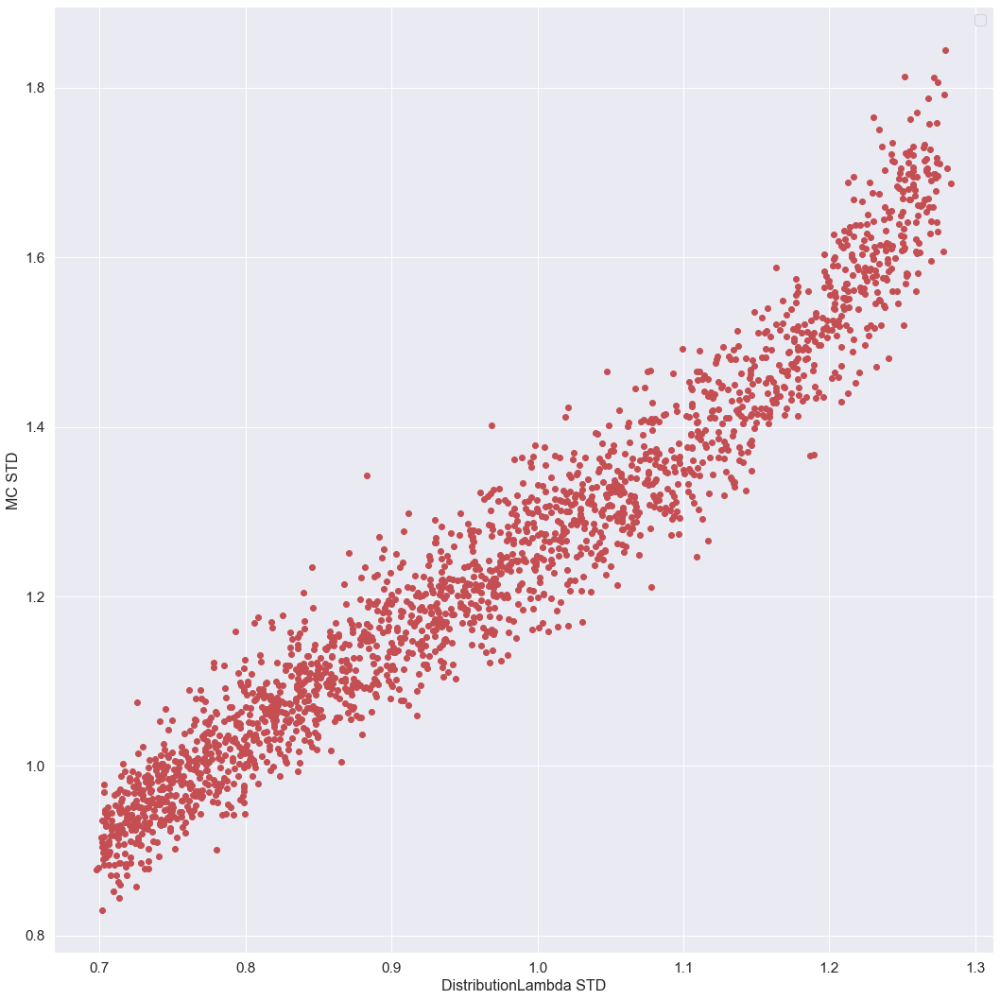

In [117]:
# Compare STDs
plt.figure(figsize=(15,15))
plt.plot(yhat.stddev(), np.std(np.array(predictions), axis=0), 'r o', label = "")

plt.xlabel("DistributionLambda STD", size = 16)
plt.ylabel("MC STD", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("DistributionLambda_MC_std.png")#plt.show()

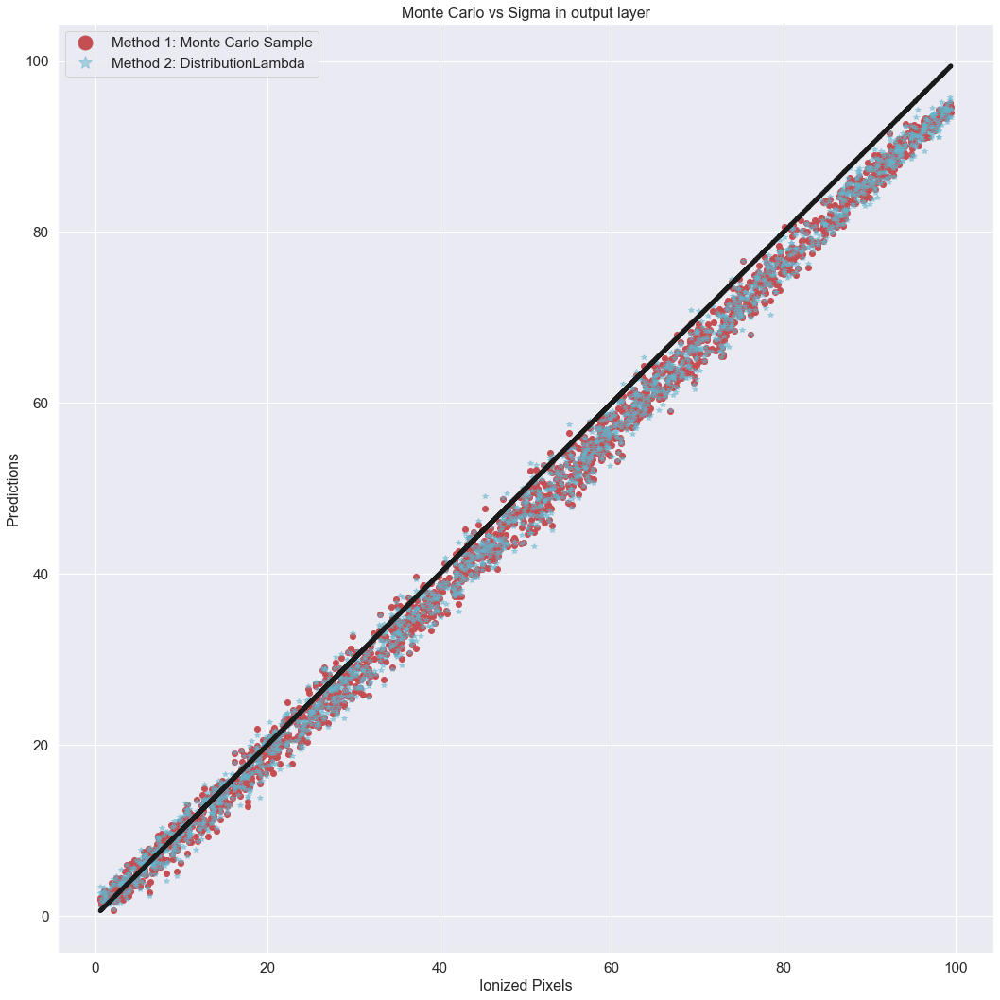

In [118]:
# Plot one-to-one predictions
plt.figure(figsize=(15,15))
plt.title("Monte Carlo vs Sigma in output layer", size = 16)

plt.plot(y_test, np.mean(np.array(predictions), axis=0), 'r o', label = "Method 1: Monte Carlo Sample")
plt.plot(y_test, yhat.mean(), 'c *', alpha = 0.5, label = "Method 2: DistributionLambda")
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("Monte_Carlo_vs_Sigma_in_output_layer.png")#plt.show()

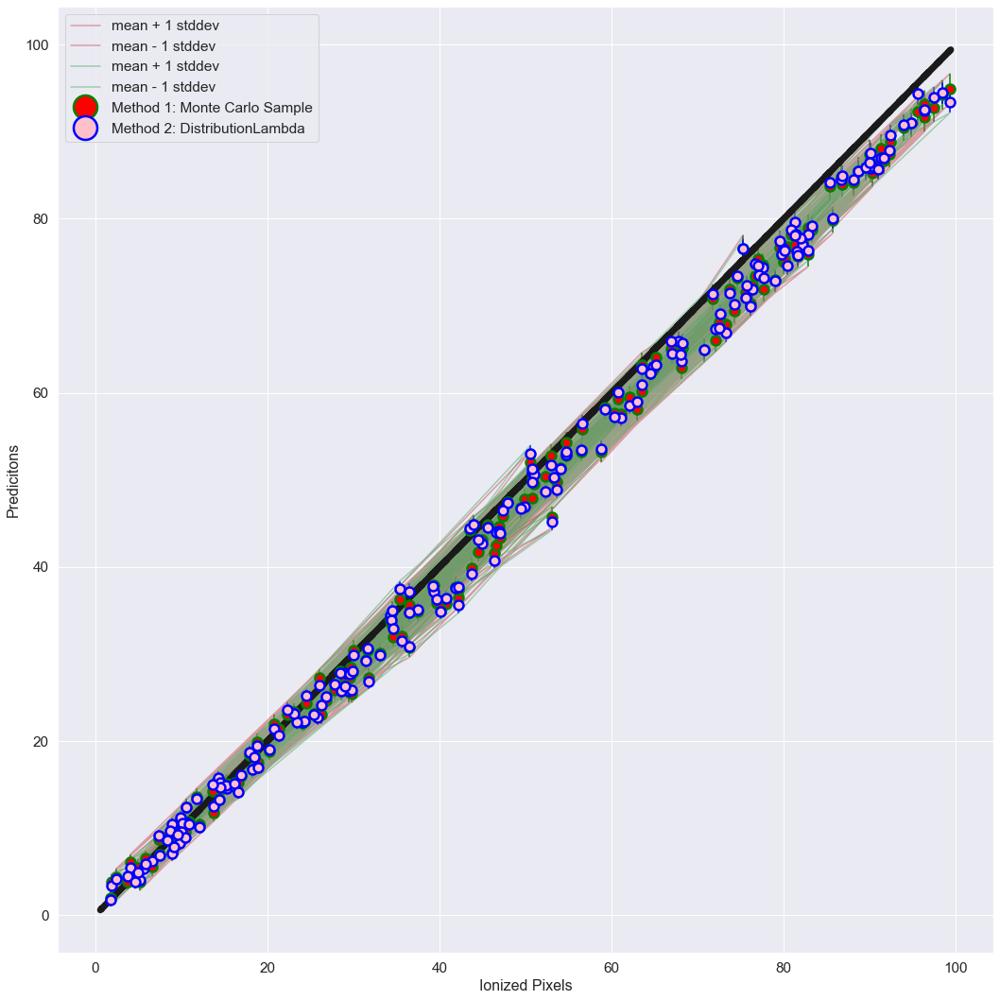

In [119]:
# Plot Error
plt.figure(figsize=(15,15))
#plt.title("Error bars for the posterior using Monte Carlo vs Sigma in output layer", size = 16)

plt.errorbar(y_test[0::10], np.mean(np.array(predictions), axis=0)[0::10], yerr=np.std(predictions, axis=0)[0::10], marker='.',
                          mfc='red', mec='green', c='green', mew=2.5, ms=20, ls='', label="Method 1: Monte Carlo Sample")
plt.errorbar(y_test[0::10], yhat.mean().numpy()[0::10,0], yerr=yhat.stddev().numpy()[0::10,0], marker='.',
                          mfc='pink', mec='blue', c='blue', mew=2.5, ms=20, ls='', label="Method 2: DistributionLambda")

plt.plot(y_test[0::10],np.mean(np.array(predictions), axis=0)[0::10]+np.std(predictions, axis=0)[0::10], 'r-', alpha=0.5,
                  label='mean + 1 stddev'
                 )
plt.plot(y_test[0::10],np.mean(np.array(predictions), axis=0)[0::10]-np.std(predictions, axis=0)[0::10], 'r-', alpha=0.5,
                  label='mean - 1 stddev'
                 )

plt.plot(y_test[0::10],yhat.mean().numpy()[0::10]+yhat.stddev().numpy()[0::10], 'g-', alpha=0.5,
                  label='mean + 1 stddev'
                 )
plt.plot(y_test[0::10],yhat.mean().numpy()[0::10]-yhat.stddev().numpy()[0::10], 'g-', alpha=0.5,
                  label='mean - 1 stddev'
                 )

plt.plot(y_test,y_test, "k--", linewidth=7)
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predicitons", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("error_plot1.png")#plt.show()

# Plot Error

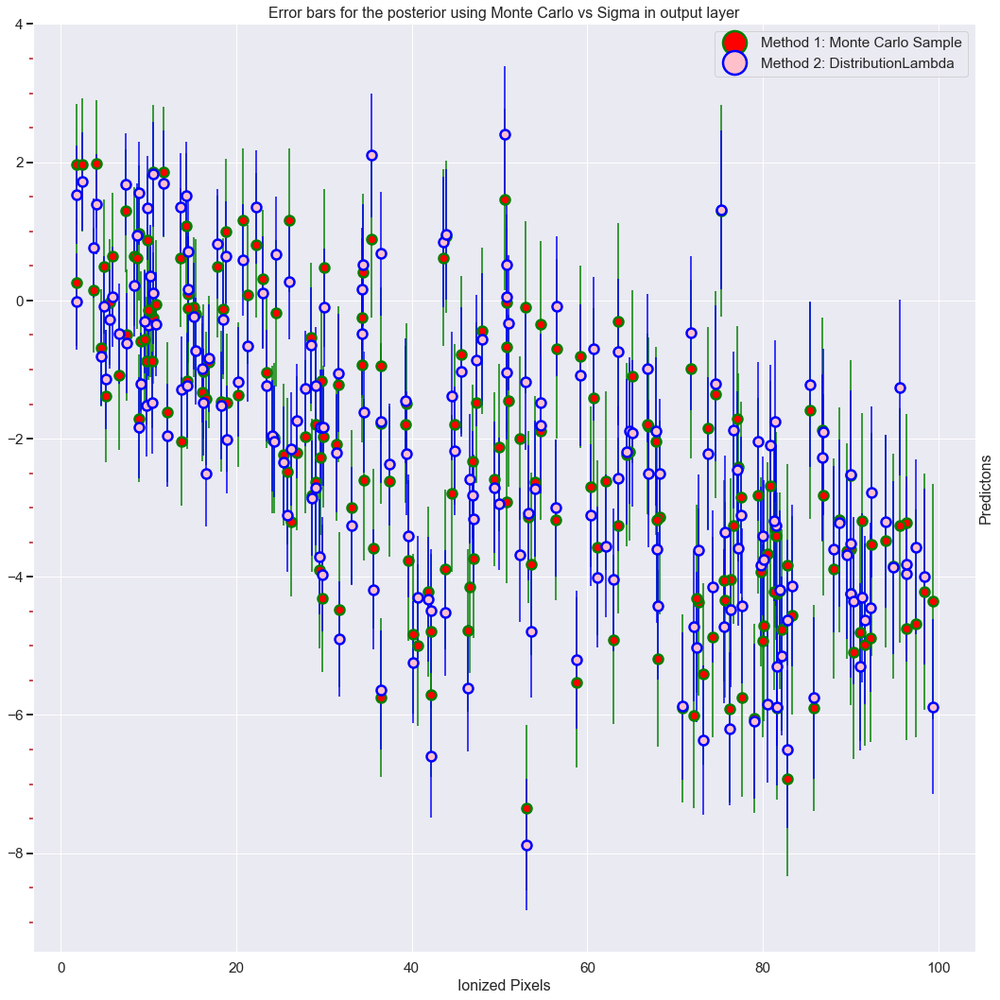

In [120]:
f=plt.figure(figsize=(15,15))

ax = f.add_subplot(111)
ax.yaxis.tick_left()
ax.yaxis.set_label_position("right")

ax.yaxis.set_minor_locator(AutoMinorLocator())
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=7)
ax.tick_params(which='minor', length=4, color='r')

plt.title("Error bars for the posterior using Monte Carlo vs Sigma in output layer", size = 16)

ax.errorbar(y_test[0::10], (np.mean(np.array(predictions), axis=0)-y_test)[0::10], yerr=np.std(predictions, axis=0)[0::10], marker='.',
                         mfc='red', mec='green', c='green', mew=2.5, ms=20, ls='', label="Method 1: Monte Carlo Sample")
ax.errorbar(y_test[0::10], yhat.mean().numpy()[0::10,0]-y_test[0::10], yerr=yhat.stddev().numpy()[0::10,0], marker='.',
                         mfc='pink', mec='blue', c='blue', mew=2.5, ms=20, ls='', label="Method 2: DistributionLambda")
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictons", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("error_plot2.png")#plt.show()

In [121]:
print("Print weights")
print(model.weights)

Print weights
[<tf.Variable 'conv2d_flipout_2/kernel_posterior_loc:0' shape=(3, 3, 1, 16) dtype=float32, numpy=
array([[[[ 0.2299754 , -0.6599365 , -0.60429066, -0.19256929,
           0.02563902, -0.2803151 ,  0.46303082, -0.30265015,
          -0.31009322, -0.1943359 , -0.22855075, -0.06291789,
          -0.2056426 , -0.01118653, -0.7636783 , -0.18514943]],

        [[-0.10823336, -0.37498444, -0.2808518 , -0.12936115,
           0.48411584, -3.629867  ,  0.29341593, -0.15974125,
          -0.23379737, -0.36950716, -0.1626114 ,  0.08614497,
          -0.18630534, -0.90946776, -0.01939303, -0.2446893 ]],

        [[ 0.13847744, -0.2620183 , -0.4078961 , -0.14248364,
          -0.09627388, -0.19535525,  0.47353962, -0.21357256,
          -0.12027917,  0.10928484, -0.10326061, -0.16630289,
           0.09176759,  0.22104092,  0.13695428, -0.25738588]]],


       [[[-0.47009355,  0.2462539 ,  0.26303583, -0.18249844,
           0.04480585, -3.5759428 , -0.02724988, -0.24237369,
         

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


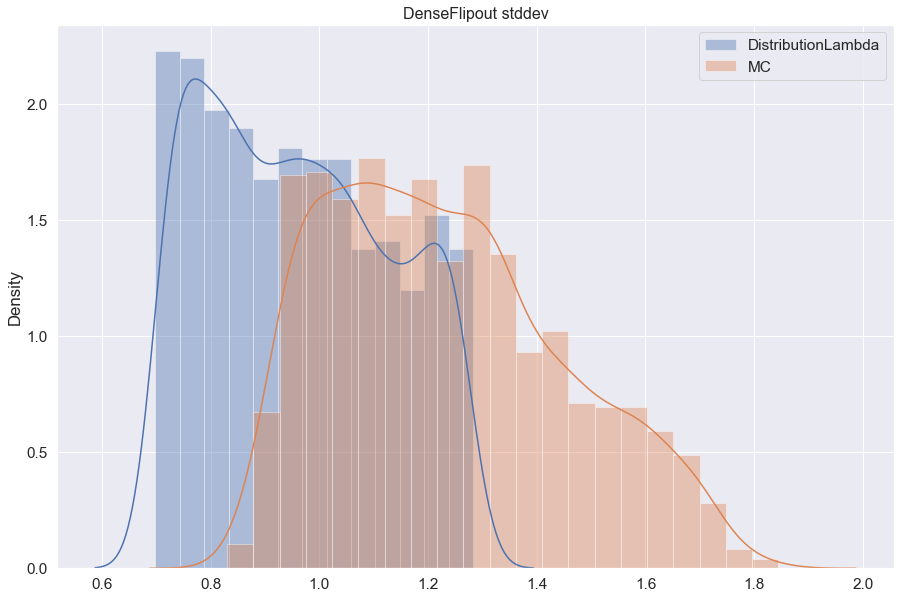

In [122]:
plt.figure(figsize=(15, 10))
sns.distplot(yhat.stddev(),label="DistributionLambda")
sns.distplot(np.std(np.array(predictions), axis=0), label= "MC")
plt.title("DenseFlipout stddev",size = 16 )
plt.legend()
#plt.savfig("DenseFlipout_stddev.png")#plt.show()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

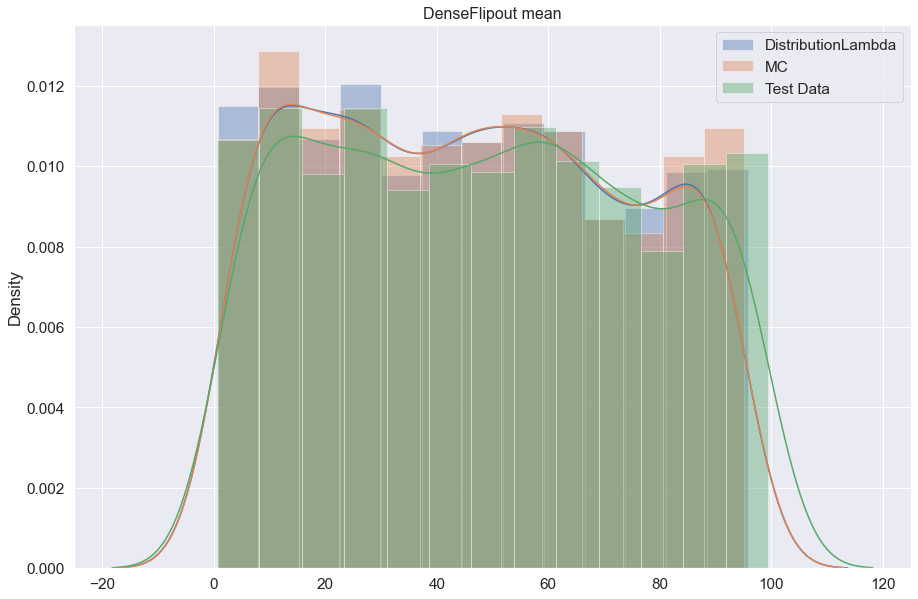

In [123]:
plt.figure(figsize=(15, 10))
sns.distplot(yhat.mean(),label="DistributionLambda")
sns.distplot(np.mean(np.array(predictions), axis=0), label= "MC")
sns.distplot(y_test, label= "Test Data")
plt.title("DenseFlipout mean",size = 16 )
plt.legend()
#plt.savfig("DenseFlipout_mean.png")#plt.show()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392)               0

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392)               0

Estimated coefficients:
b_0 = 0.34815843248864553         
b_1 = 1.0431882073676315


/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392)               0

Estimated coefficients:
b_0 = 0.3727612358733339         
b_1 = 1.0444830135380838


/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392)               0

Estimated coefficients:
b_0 = 0.3009138244157157         
b_1 = 1.0434829804922088


/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392)               0

Estimated coefficients:
b_0 = 0.3798378656519219         
b_1 = 1.0428660190246795


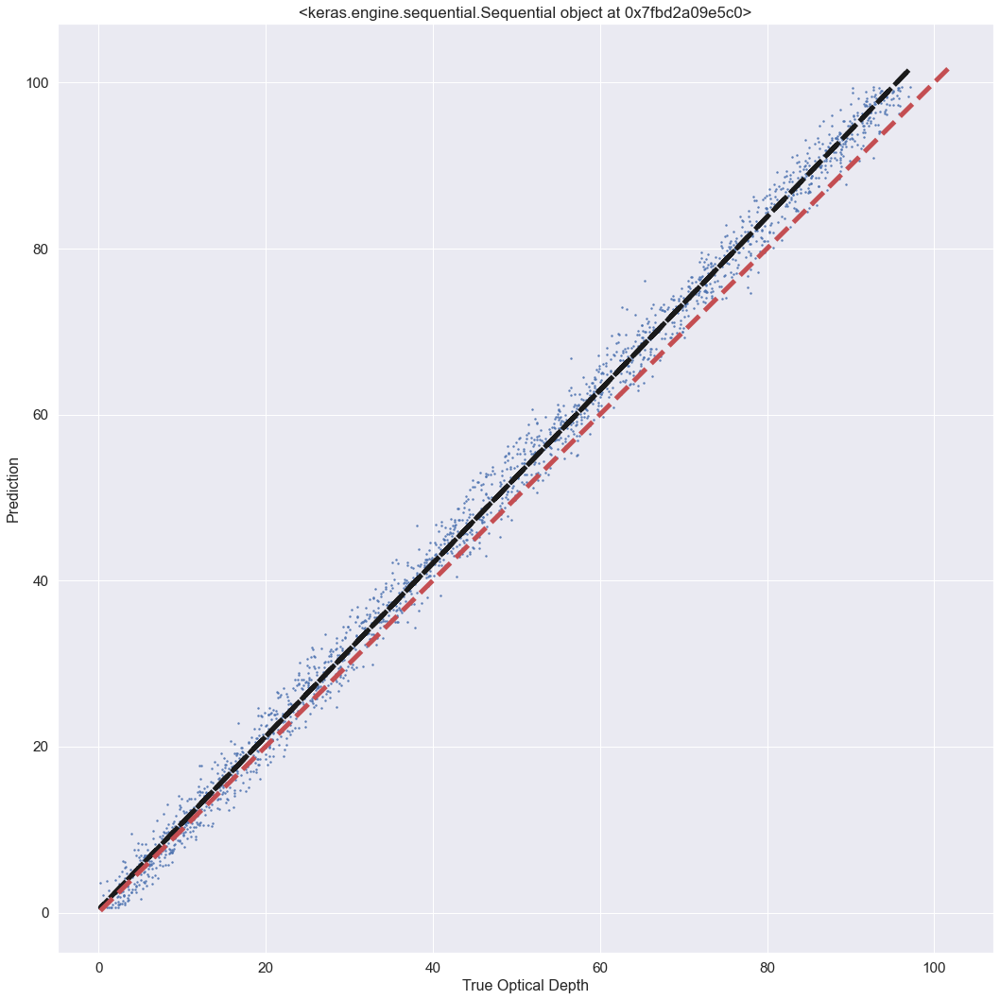

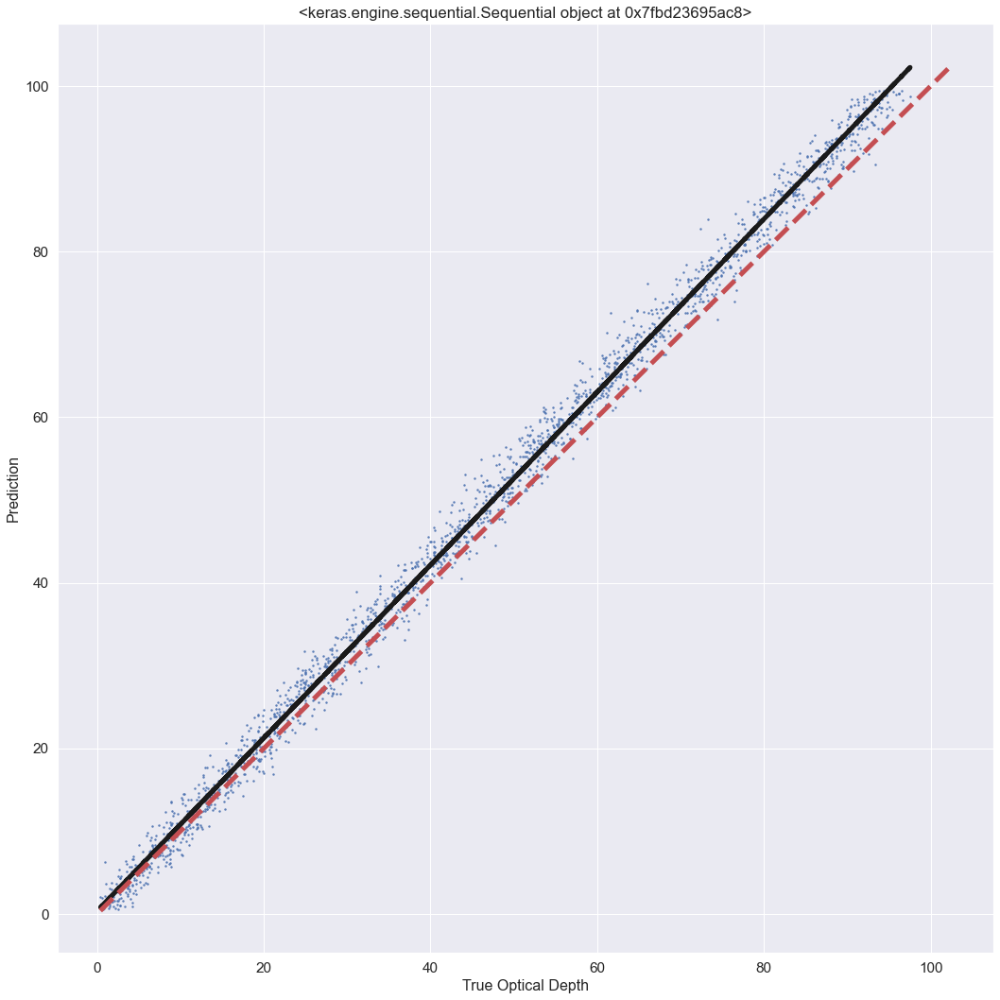

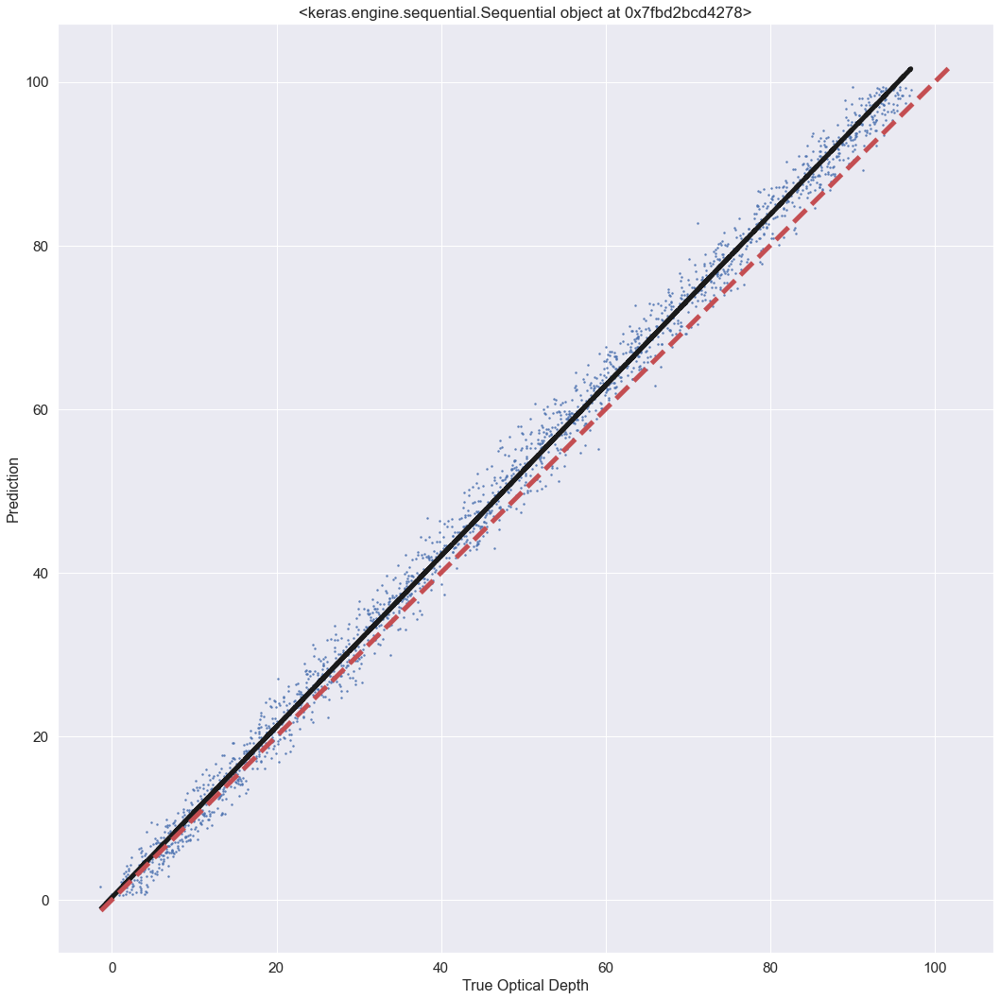

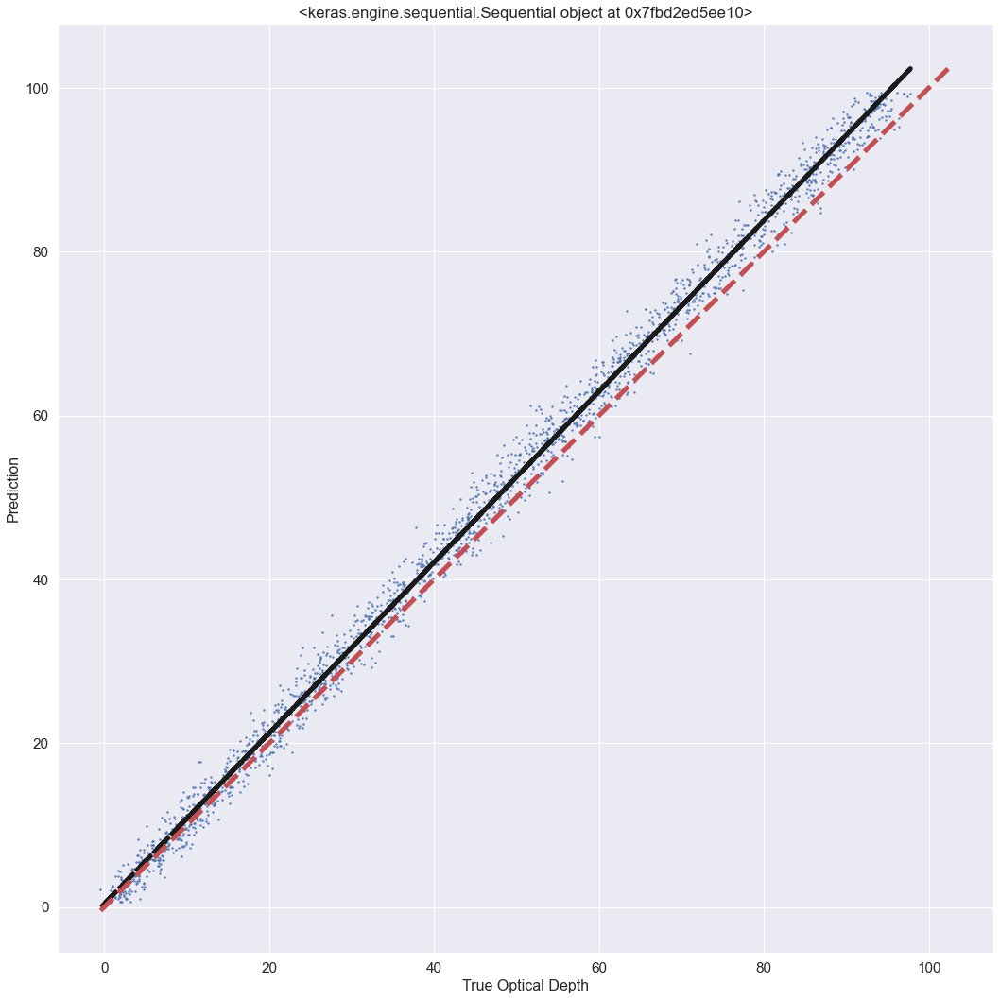

In [124]:
coefficients = []

fp = open(outputdir+"bestmodel_estimated_coefficients_1.log", 'w+')
fp.write("b_0, b_1 \n")

if __name__ == "__main__":

    for p in np.arange(len(tuner.get_best_models(num_models=20))):
        main(x=np.array(predictions)[p], y=y_test, labelname=str(tuner.get_best_models(num_models=15)[p-1]))
    fp.close()

# Empirical Examination of Posterior Distribution

In [125]:
bnn_model = tuner.get_best_models(num_models=1)[0]
sns.set(font_scale=1.4)
def plot_weight_posteriors(names, qm_vals, qs_vals):
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(1, 2, 1)
    for n, qm in zip(names, qm_vals):
        sns.distplot(tf.reshape(qm, shape=[-1]), ax=ax, label=n)
    ax.set_title("weight means",size = 16 )
    ax.set_xlim([-1.5, 1.5])
    ax.legend()
    ax = fig.add_subplot(1, 2, 2)
    for n, qs in zip(names, qs_vals):
        sns.distplot(tf.reshape(qs, shape=[-1]), ax=ax)
    ax.set_title("weight stddevs", size = 16)
    ax.set_xlim([0, 1.0])
    fig.tight_layout()
    #plt.savefig("empirical_examination_DistributionLambda.png")#show()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 16)        304       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 16)        64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 15, 15, 8)         2312      
_________________________________________________________________
batch_normalization_1 (Batch (None, 15, 15, 8)         32        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 8)           0         
_________________________________________________________________
flatten (Flatten)            (None, 392)               0

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

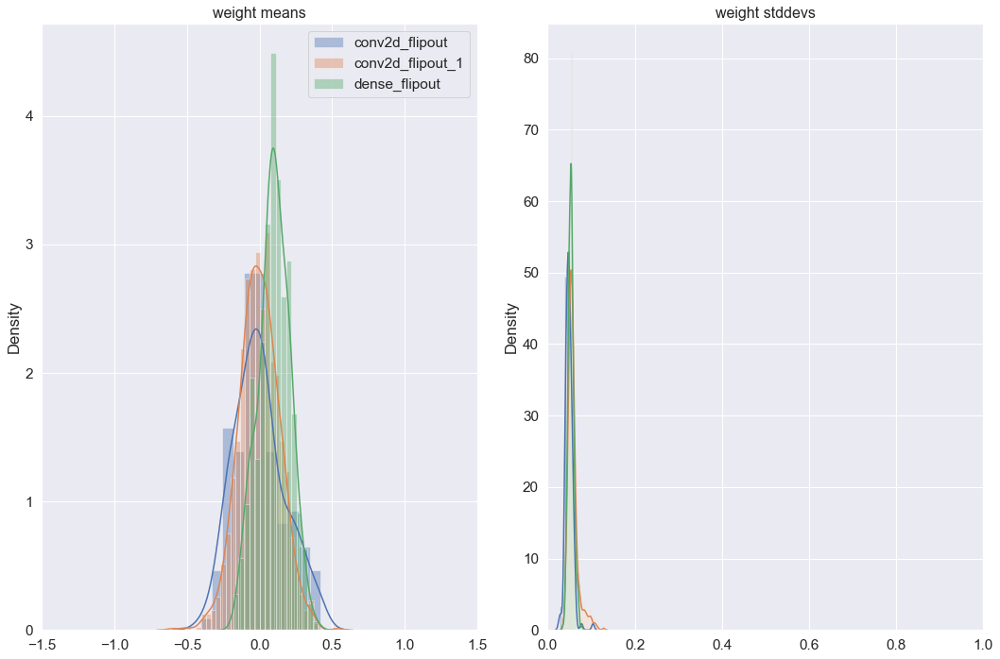

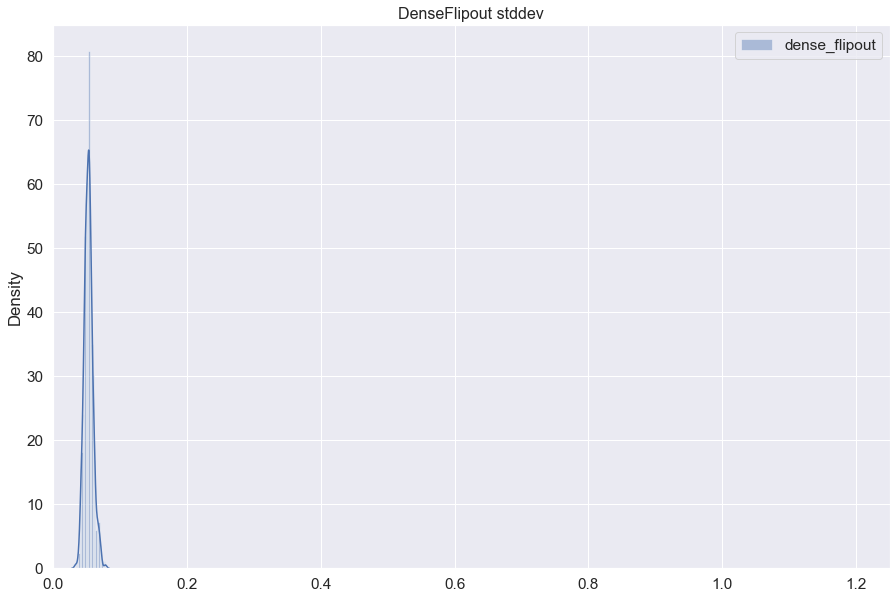

In [126]:
names = [layer.name for layer in bnn_model.layers if "flipout" in layer.name]
qm_vals = [
    layer.kernel_posterior.mean()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]
qs_vals = [
    layer.kernel_posterior.stddev()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]

plot_weight_posteriors(names, qm_vals, qs_vals)

plt.figure(figsize=(15, 10))
sns.distplot(tf.reshape(bnn_model.layers[-1].kernel_posterior.stddev(), shape=[-1]),
             label="{}".format(str(bnn_model.layers[-1].name)))
plt.title("DenseFlipout stddev",size = 16 )
plt.xlim([0, 1.25])
plt.legend()
#plt.savefig("DenseFlipout_stddev_DistributionLambda.png")#plt.show()

### Empirical Examination of Posterior Distribution

# Model 4

In [197]:
if os.path.isdir(project_name): # check to see if path exists
    os.system("rm -rvf {}".format(project_name))

def train_test_og_model(hp):

    # Making a model.
    model = Sequential()

    # Added Layers.
    model.add(tfp.layers.Convolution2DFlipout(filters = 64,
                                              input_shape=(nx, ny, 1), kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    #model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(tfp.layers.Convolution2DFlipout(filters = 32, kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    #model.add(MaxPooling2D(pool_size=(2, 2)))
                          
    model.add(tfp.layers.Convolution2DFlipout(filters = 16, kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    #model.add(MaxPooling2D(pool_size=(2, 2)))
    
    model.add(tfp.layers.Convolution2DFlipout(filters = 8, kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    #model.add(MaxPooling2D(pool_size=(2, 2)))
    
    model.add(tfp.layers.Convolution2DFlipout(filters = 4, kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    
    model.add(Flatten())
    model.add(tfp.layers.DenseFlipout(1, activation="linear", kernel_divergence_fn=kl_divergence_function,))

    #for l in range(hp.Int('loss', 0, len(losses))):
    model.compile(optimizer= "adam", loss = hp.Choice('loss_type', ["mse", "mae", "mape", "Mean_Squared_over_true_Error"], ordered=False, default="mse"), metrics=["mse"])

    # Visualize Model
    print(model.summary())

    return model

# Start Tuning based on low validation loss
tuner = RandomSearch(train_test_og_model,
                     objective='val_loss', # 'loss', 'val_loss', 'val_accuracy'
                     max_trials= num_models,# specify the number of different models to try
                     executions_per_trial=1, #2,
                     directory=outputdir,
                     seed=42,
                     project_name=project_name)

# Print a summary of the search space
tuner.search_space_summary()

# Show the best models, their hyperparameters, and the resulting metrics.
tuner.search(X_train, y_train,
                          epochs=5,#hp.Int('epoch',min_value=10,max_value=HP_EPOCH,step=10,default=10),
                          validation_data=(X_test, y_test),
                          batch_size=HP_BATCH_SIZE,
                         #callbacks=[plotlosses],
                         verbose=1)

Trial 4 Complete [00h 05m 36s]
val_loss: 9.444558143615723

Best val_loss So Far: 4.6673431396484375
Total elapsed time: 00h 21m 50s
INFO:tensorflow:Oracle triggered exit


In [198]:
tuner.results_summary()

Results summary
Results in ./toy_model_tuner_32
Showing 10 best trials
Objective(name='val_loss', direction='min')
Trial summary
Hyperparameters:
loss_type: Mean_Squared_over_true_Error
Score: 4.6673431396484375
Trial summary
Hyperparameters:
loss_type: mae
Score: 9.444558143615723
Trial summary
Hyperparameters:
loss_type: mape
Score: 20.08758544921875
Trial summary
Hyperparameters:
loss_type: mse
Score: 43.64244842529297


In [199]:
# Retrieve the best model.
best_model = tuner.get_best_models(num_models=1)[0]

# Save best hyperperam Model
print("saving best hyperparameter model ...")
best_model.save(outputdir+"hyperParam_model_{}.h5".format(idx))

# Save best hyperperam Model Weights
print("saving best hyperparameter model weights ...")
best_model.save_weights(outputdir+"hyperParam_model_weights_{}.h5".format(idx))

# Save all other models so that we can see how the model behaves based on complexity
for indx in np.arange(len(tuner.get_best_models(num_models=20))):
    model_ = tuner.get_best_models(num_models=num_models)[indx]
    # Save Model weights
    model_.save_weights(outputdir+"hyperParam_weights_{}_{}.h5".format(str(indx+1),idx))
    print("Saving ... "+outputdir+"hyperParam_weights_{}_{}.h5".format(str(indx+1),idx))
    # Save Model
    model_.save(outputdir+"hyperParam_model_{}_{}.h5".format(str(indx+1),idx))
    print("Saving ... "+outputdir+"hyperParam_model_{}_{}.h5".format(str(indx+1),idx))

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None, 24, 24, 8)         2

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None, 24, 24, 8)         2

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None, 24, 24, 8)         2

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None, 24, 24, 8)         2

Saving ... hyperParam_weights_2_32.h5
Saving ... hyperParam_model_2_32.h5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
________________________________________________

Saving ... hyperParam_weights_3_32.h5
Saving ... hyperParam_model_3_32.h5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
________________________________________________

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None, 24, 24, 8)         2

In [200]:
# print best performing model's loss function
print("Print potential best model")
print(tuner.get_best_models(num_models=1)[0].loss)

print("Print all models")
print(tuner.get_best_models(num_models=20))

print(tuner.search_space_summary())

print(tuner.results_summary())

Print potential best model
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip 

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None, 24, 24, 8)         2

Starting MC Sampling
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None,

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

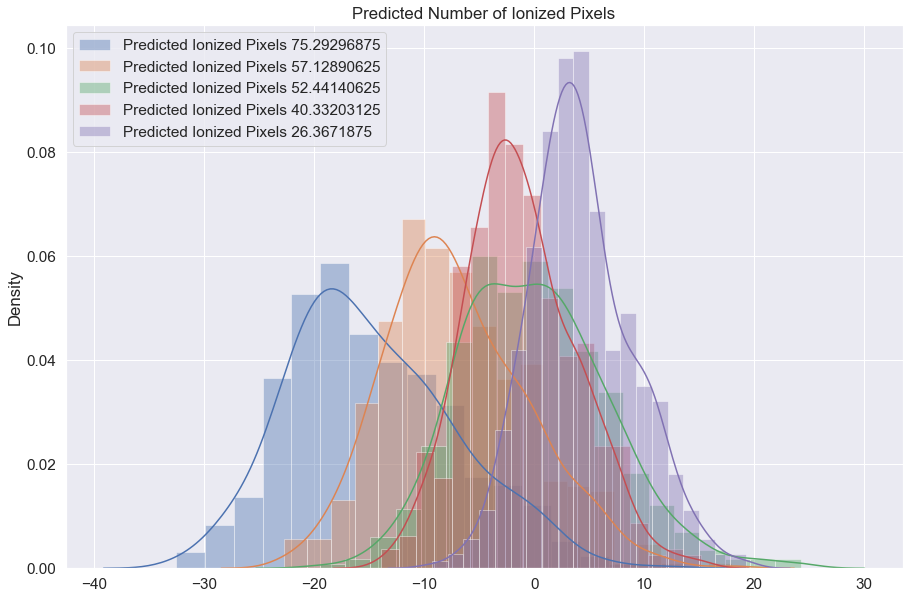

In [201]:
# Do MC Sampling
print("Starting MC Sampling")
bestmodel=tuner.get_best_models(num_models=1)[0]#.predict(X_test)
pred = []

for i in range(500):
    y_p = bestmodel.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])
    pred.append(y_p)

plt.figure(figsize=(15, 10))
plt.title("Predicted Number of Ionized {}".format("Pixels",size = 16 ))
sns.distplot(np.array(pred)[:,0]-y_test[0],label="Predicted Ionized Pixels {}".format(str(y_test[0])))
sns.distplot(np.array(pred)[:,1]-y_test[1],label="Predicted Ionized Pixels {}".format(str(y_test[1])))
sns.distplot(np.array(pred)[:,2]-y_test[2],label="Predicted Ionized Pixels {}".format(str(y_test[2])))
sns.distplot(np.array(pred)[:,3]-y_test[3],label="Predicted Ionized Pixels {}".format(str(y_test[3])))
sns.distplot(np.array(pred)[:,4]-y_test[4],label="Predicted Ionized Pixels {}".format(str(y_test[4])))
plt.legend(markerscale=2.5)
#plt.savefig("predicted_number_of_ionized_pixels.png")

No handles with labels found to put in legend.


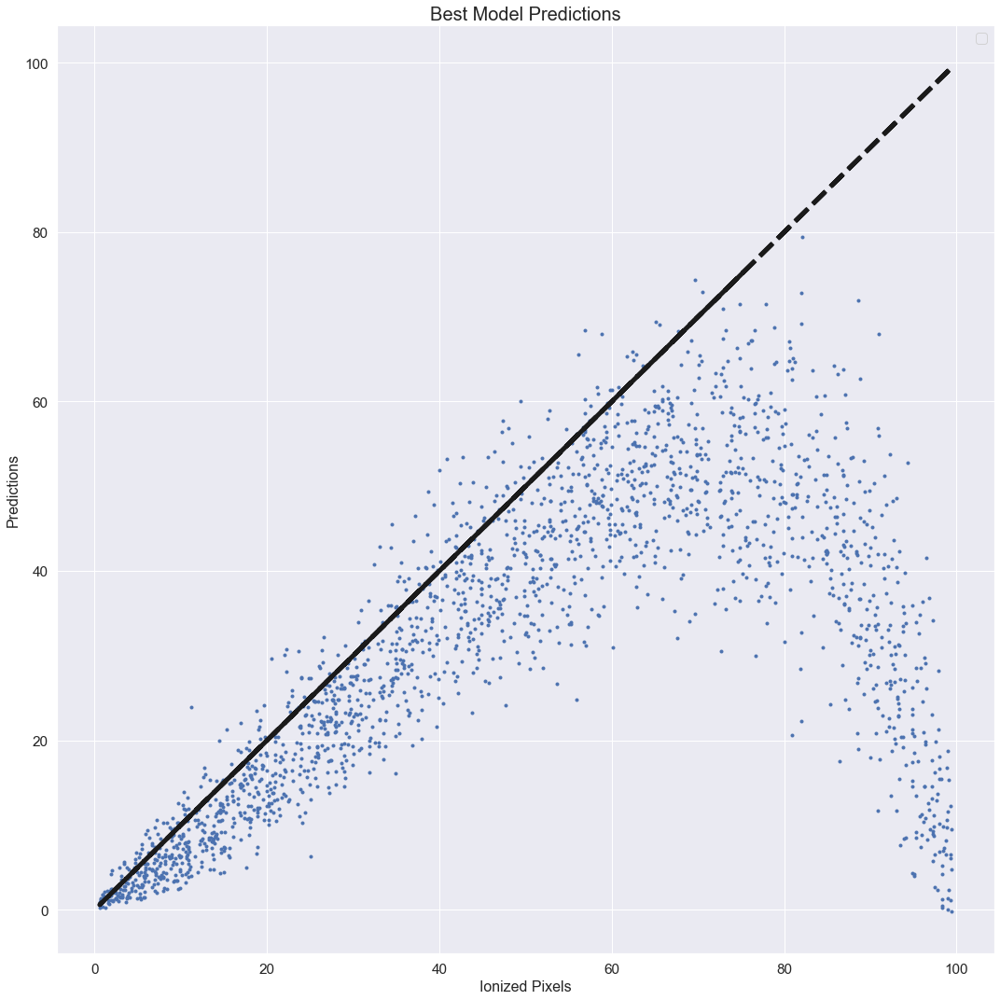

In [202]:
plt.figure(figsize=(15,15))
plt.title("Best Model Predictions", size = 20)
plt.plot(y_test, np.mean(np.array(pred), axis=0), '.')#, label = str(tuner.get_best_models(num_models=num_models)[l-1]))
plt.plot(y_test,y_test, "k--", linewidth=5)
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("BestModel_Predictions.png")

In [203]:
# make predictions
prediction = []
predictions = np.empty([len(X_test),])

for m in tuner.get_best_models(num_models=num_models):
    for i in range(5):
        y_p = m.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])
        prediction.append(y_p) # (500, 100, 1) = (# of masks, # of datasets, # of classes)
    prediction = np.mean(np.array(prediction), axis=0)
    predictions = np.vstack((predictions, prediction))
    prediction = []
print(X_test.shape)
print(predictions.shape)
print(y_test.shape)

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None, 24, 24, 8)         2

(2000, 32, 32, 1)
(5, 2000)
(2000,)


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None, 24, 24, 8)         2

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None, 24, 24, 8)         2

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None, 24, 24, 8)         2

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None, 24, 24, 8)         2

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None, 24, 24, 8)         2

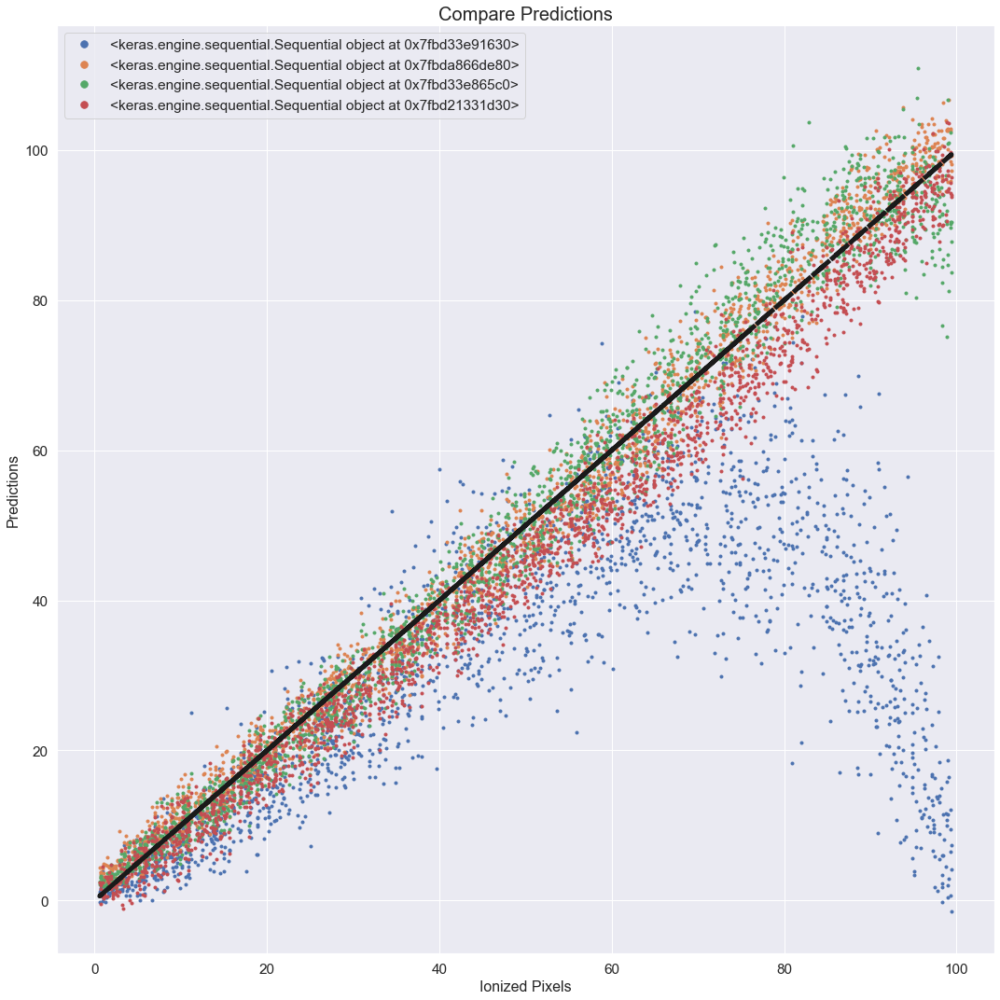

In [204]:
# Plot one-to-one predictions
plt.figure(figsize=(15,15))
plt.title("Compare Predictions", size = 20)

for l in np.arange(1,5):
    plt.plot(y_test, predictions[l], '.', label = str(tuner.get_best_models(num_models=num_models)[l-1]))
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("Compare_Predictions.png")

In [205]:
# Empirical Examination of Posterior Distribution
bnn_model = tuner.get_best_models(num_models=1)[0]
sns.set(font_scale=1.4)
def plot_weight_posteriors(names, qm_vals, qs_vals):
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(1, 2, 1)
    for n, qm in zip(names, qm_vals):
        sns.distplot(tf.reshape(qm, shape=[-1]), ax=ax, label=n)
    ax.set_title("weight means",size = 16 )
    ax.set_xlim([-1.5, 1.5])
    ax.legend()
    ax = fig.add_subplot(1, 2, 2)
    for n, qs in zip(names, qs_vals):
        sns.distplot(tf.reshape(qs, shape=[-1]), ax=ax)
    ax.set_title("weight stddevs", size = 16)
    ax.set_xlim([0, 1.0])
    fig.tight_layout()
    #plt.savefig("empirical_examination_mc.png")#show()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 64)        1216      
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 64)        256       
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 28, 28, 32)        36896     
_________________________________________________________________
batch_normalization_1 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_2 (Conv2DFlip (None, 26, 26, 16)        9232      
_________________________________________________________________
batch_normalization_2 (Batch (None, 26, 26, 16)        64        
_________________________________________________________________
conv2d_flipout_3 (Conv2DFlip (None, 24, 24, 8)         2

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

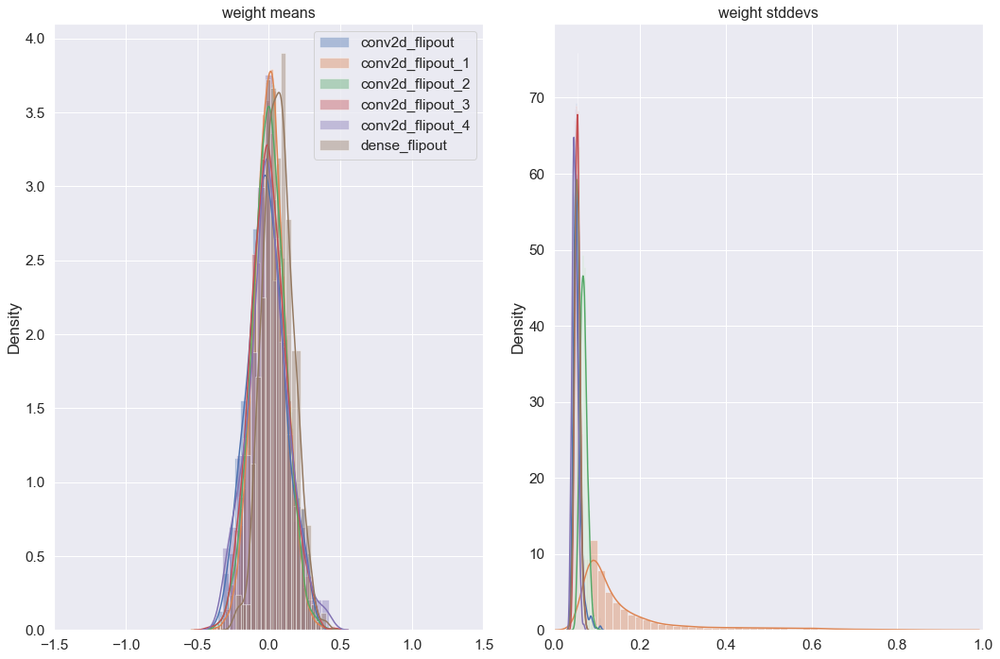

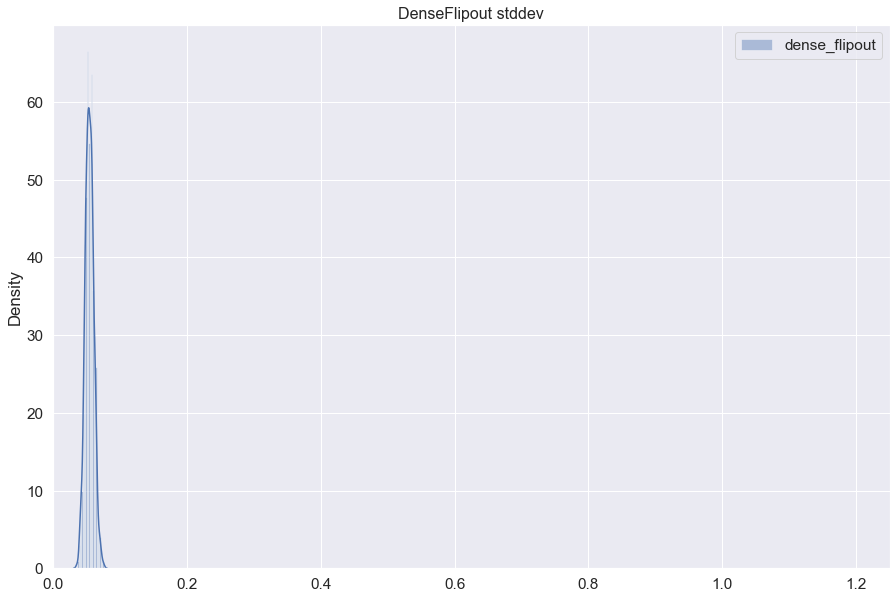

In [206]:
names = [layer.name for layer in bnn_model.layers if "flipout" in layer.name]
qm_vals = [
    layer.kernel_posterior.mean()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]
qs_vals = [
    layer.kernel_posterior.stddev()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]

plot_weight_posteriors(names, qm_vals, qs_vals)

plt.figure(figsize=(15, 10))
sns.distplot(tf.reshape(bnn_model.layers[-1].kernel_posterior.stddev(), shape=[-1]),
             label="{}".format(str(bnn_model.layers[-1].name)))
plt.title("DenseFlipout stddev",size = 16 )
plt.xlim([0, 1.25])
plt.legend()
#plt.savefig("DenseFlipout_stddev_mc.png")

# Learn STD and Mean

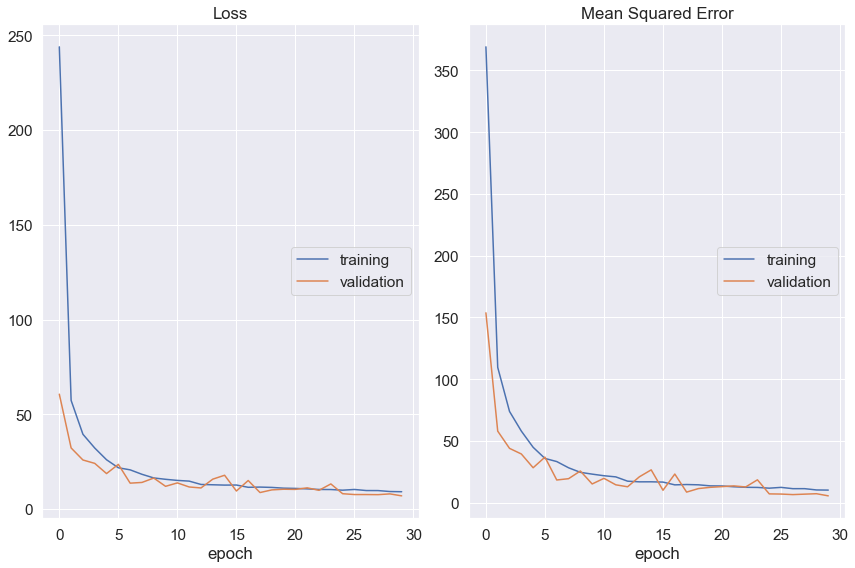

Loss
	training         	 (min:    9.135, max:  243.902, cur:    9.135)
	validation       	 (min:    6.961, max:   60.616, cur:    6.961)
Mean Squared Error
	training         	 (min:   10.204, max:  369.131, cur:   10.204)
	validation       	 (min:    5.544, max:  153.754, cur:    5.544)
Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout_35 (Conv2DFli (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization_28 (Batc (None, 30, 30, 32)        128       
_________________________________________________________________
conv2d_flipout_36 (Conv2DFli (None, 28, 28, 32)        18464     
_________________________________________________________________
batch_normalization_29 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
conv2d_flipout_37 (Conv2DFli (

In [179]:
def train_test_og_model():
    # Making a model.
    model = Sequential()

    # Added Layers.
    model.add(tfp.layers.Convolution2DFlipout(filters = 32,
                                              input_shape=(nx, ny, 1), kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    #model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(tfp.layers.Convolution2DFlipout(filters = 32, kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    #model.add(MaxPooling2D(pool_size=(2, 2)))
                          
    model.add(tfp.layers.Convolution2DFlipout(filters = 16, kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    #model.add(MaxPooling2D(pool_size=(2, 2)))
    
    model.add(tfp.layers.Convolution2DFlipout(filters = 8, kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    #model.add(MaxPooling2D(pool_size=(2, 2)))
    
    model.add(tfp.layers.Convolution2DFlipout(filters = 4, kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    
    model.add(Flatten())
    model.add(tfp.layers.DenseFlipout(1, activation="linear", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.DistributionLambda(
        lambda t: tfd.Normal(loc=t[..., :1],
                             #scale = 1)))
                             scale=1e-3 + tf.math.softplus(0.01 * t[..., :1]))))

    model.compile(optimizer= "adam", loss = "neg_log_likelihood", metrics=["mse"])

    plotlosses = PlotLossesKeras()

    model.fit(X_train, y_train, validation_data=(X_test, y_test),
              epochs=HP_EPOCH, batch_size=HP_BATCH_SIZE,
              callbacks=[plotlosses],
              verbose=1)

    # Visualize Model
    print(model.summary())

    loss = model.evaluate(X_test, y_test)
    return model

model = train_test_og_model()

In [180]:
# make predictions
print("Make MC predictions")
predictions = []
for i in range(500):
    y_p = model.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])
    predictions.append(y_p) # (500, 100, 1) = (# of masks, # of datasets, # of classes)

prediction = np.mean(np.array(predictions), axis=0)
print(X_test.shape)
print(prediction.shape)
print(y_test.shape)

Make MC predictions
(2000, 32, 32, 1)
(2000,)
(2000,)


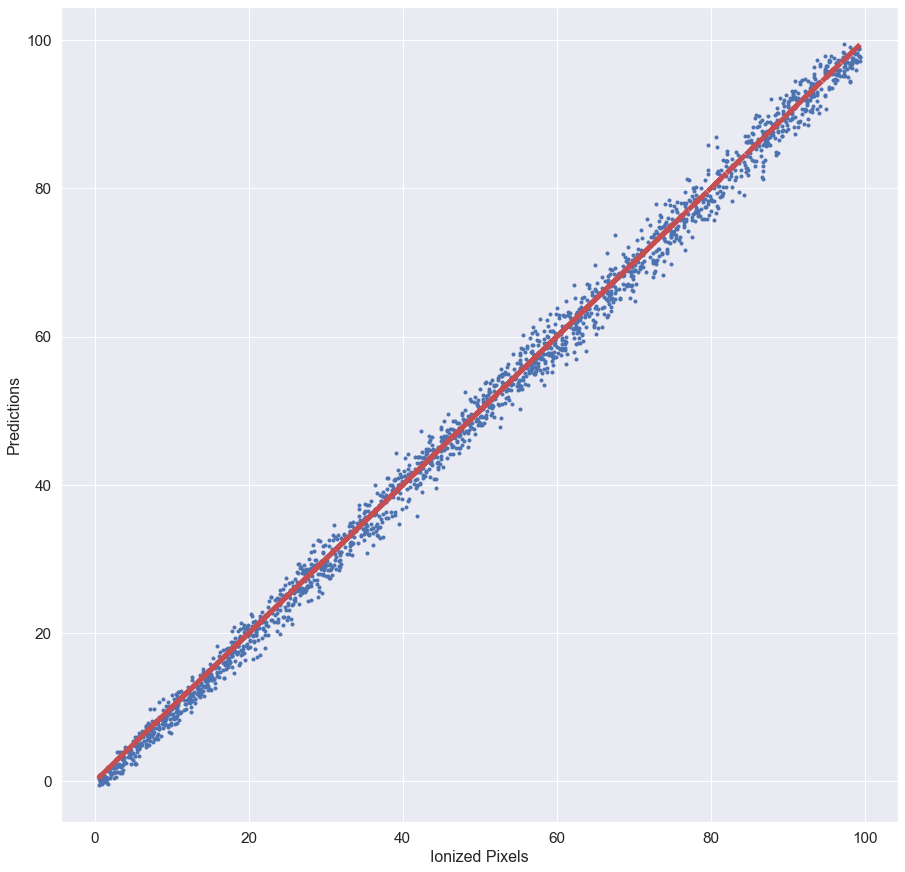

In [181]:
# Plot one-to-one predictions
plt.figure(figsize=(15,15))
plt.title("")
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.plot(y_test, prediction, '.')
plt.plot(y_test,y_test, "r--", linewidth=5)
#plt.savefig("Empirical_one2one_plots.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

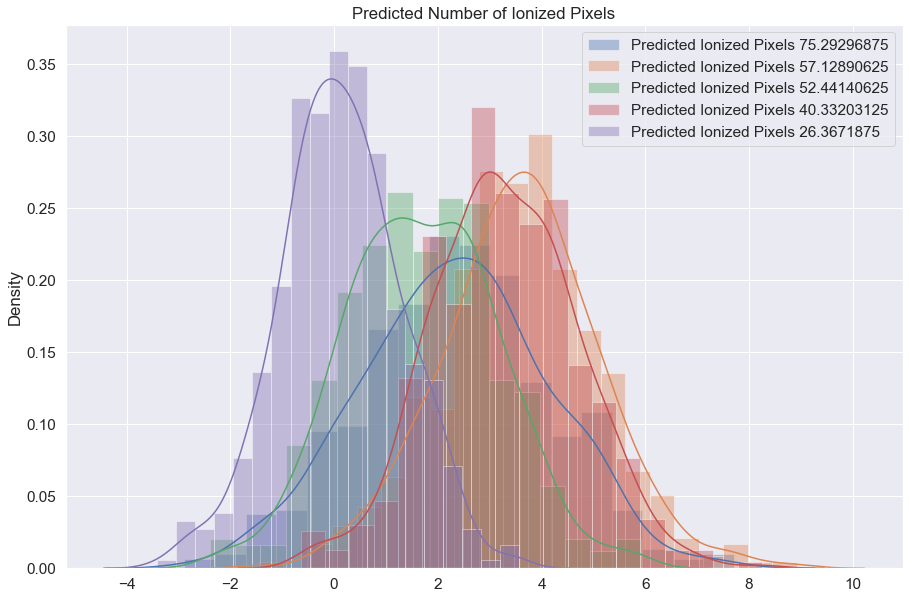

In [182]:
plt.figure(figsize=(15, 10))
plt.title("Predicted Number of Ionized {}".format("Pixels",size = 16 ))
sns.distplot(np.array(predictions)[:,0]-y_test[0],label="Predicted Ionized Pixels {}".format(str(y_test[0])))
sns.distplot(np.array(predictions)[:,1]-y_test[1],label="Predicted Ionized Pixels {}".format(str(y_test[1])))
sns.distplot(np.array(predictions)[:,2]-y_test[2],label="Predicted Ionized Pixels {}".format(str(y_test[2])))
sns.distplot(np.array(predictions)[:,3]-y_test[3],label="Predicted Ionized Pixels {}".format(str(y_test[3])))
sns.distplot(np.array(predictions)[:,4]-y_test[4],label="Predicted Ionized Pixels {}".format(str(y_test[4])))
plt.legend(markerscale=2.5)
#plt.savefig("predicted_number_of_ionized_empirical.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


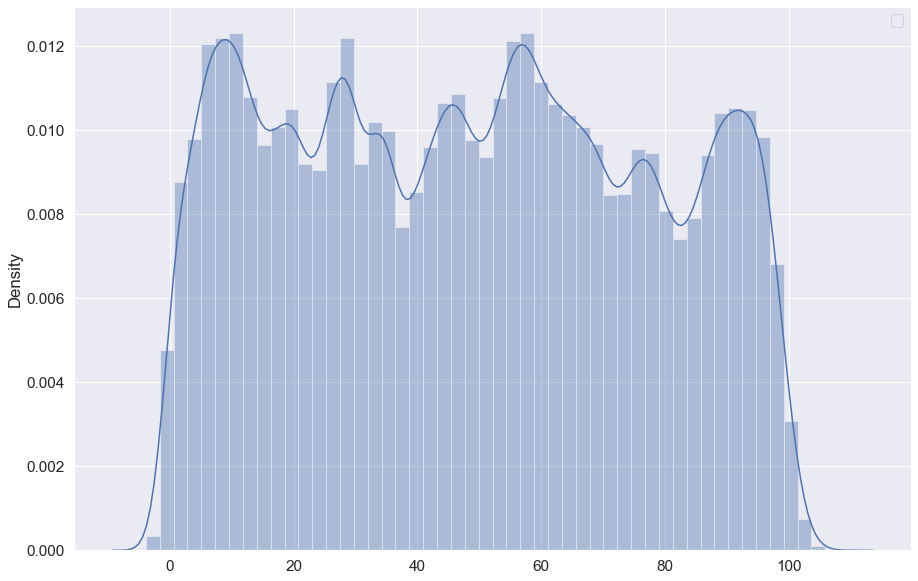

In [183]:
# Plot the distribution of the predictions within a certain range.
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions))
plt.legend(markerscale=2.5)
#plt.savefig("range_of_predct0.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


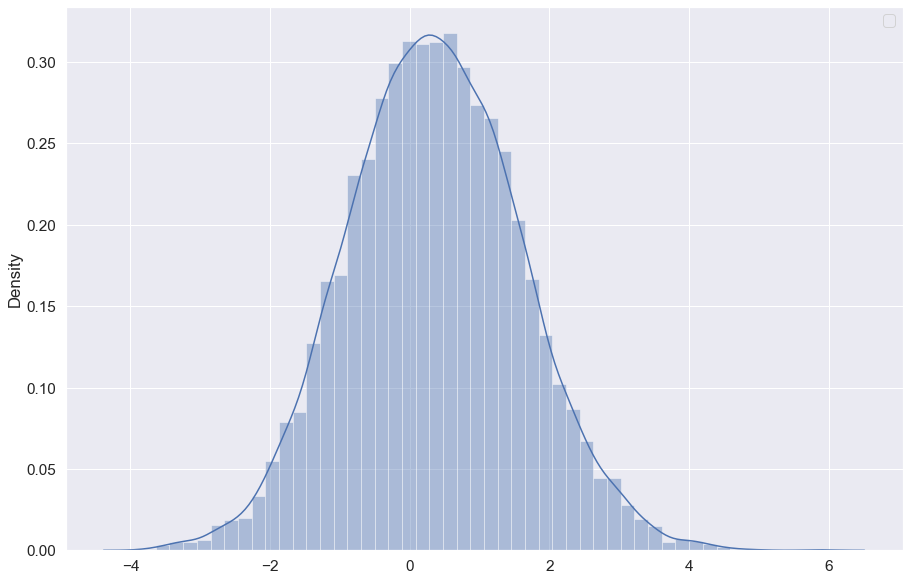

In [184]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions)[: , np.logical_and(y_test < 2, y_test >= 0)])
plt.legend(markerscale=2.5)
#plt.savefig("range_of_predct1.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


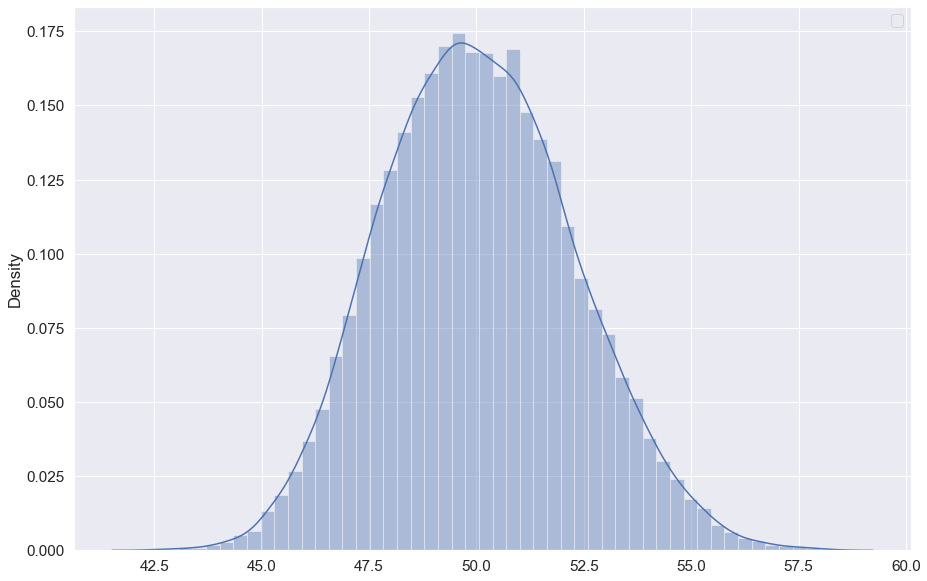

In [185]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions)[: , np.logical_and(y_test < 51, y_test >= 49)])
plt.legend(markerscale=2.5)
#plt.savefig("range_of_predct2.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


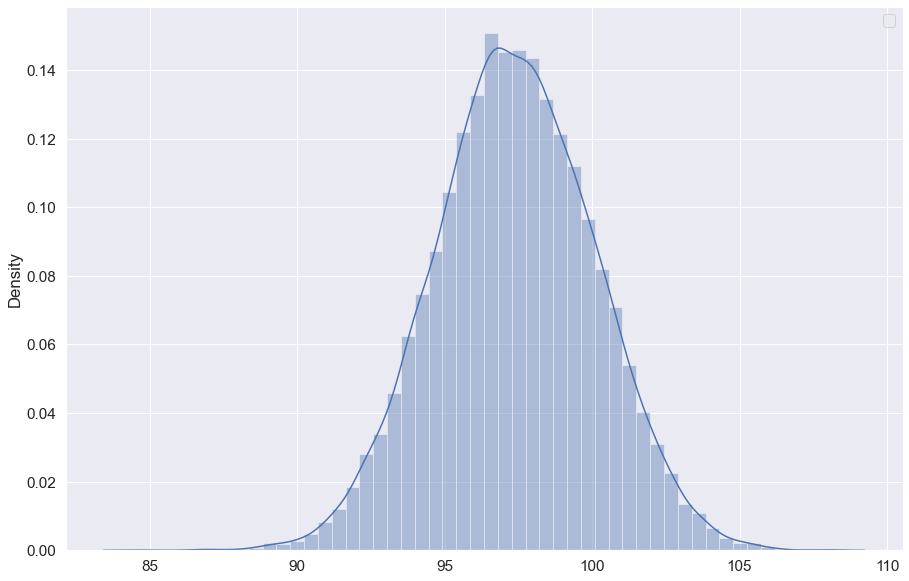

In [186]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions)[: , np.logical_and(y_test < 100, y_test >= 98)])
plt.legend(markerscale=2.5)
#plt.savefig("range_of_predct3.png")

# Error Bars
METHOD 1: Empirical error bars for the posterior using Monte Carlo

METHOD 2: Sigma in output layer

In [187]:
yhat = model(X_test) # model.predict(X_test)

No handles with labels found to put in legend.


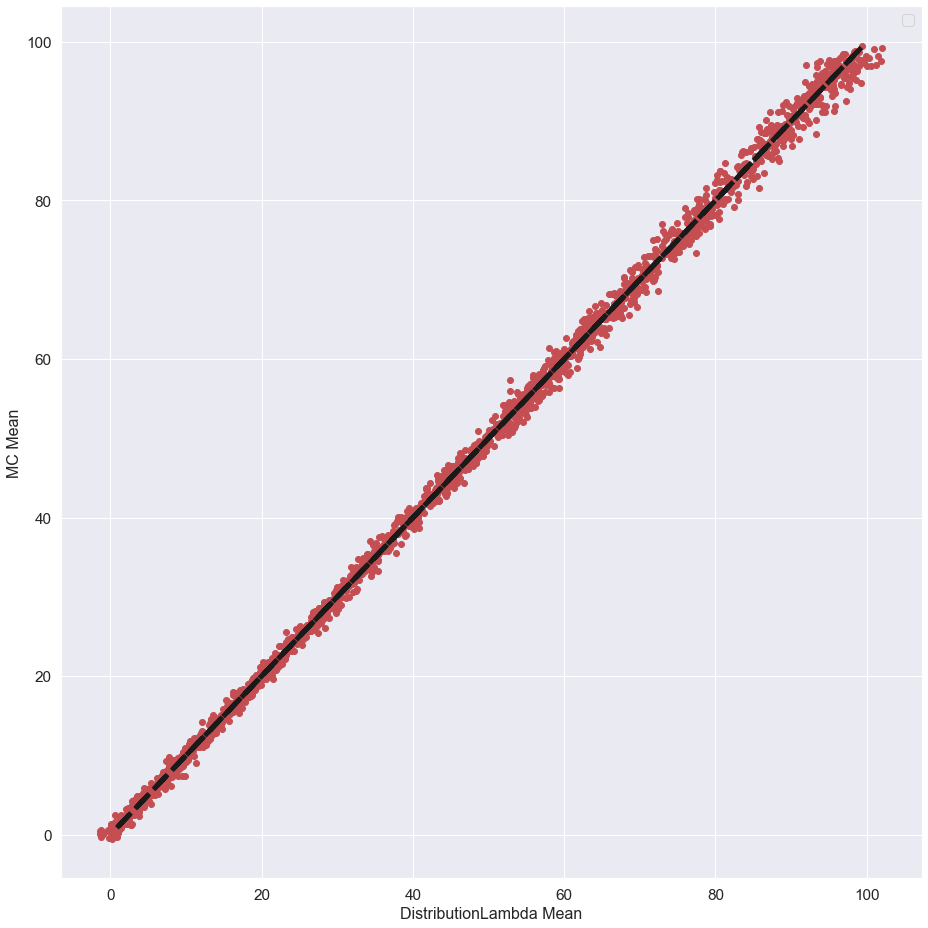

In [188]:
# Compare predicted values
plt.figure(figsize=(13,13))
plt.plot(yhat.mean(), np.mean(np.array(predictions), axis=0), 'r o', label = "")
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("DistributionLambda Mean", size = 16)
plt.ylabel("MC Mean", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("DistributionLambda_MC_mean.png")

No handles with labels found to put in legend.


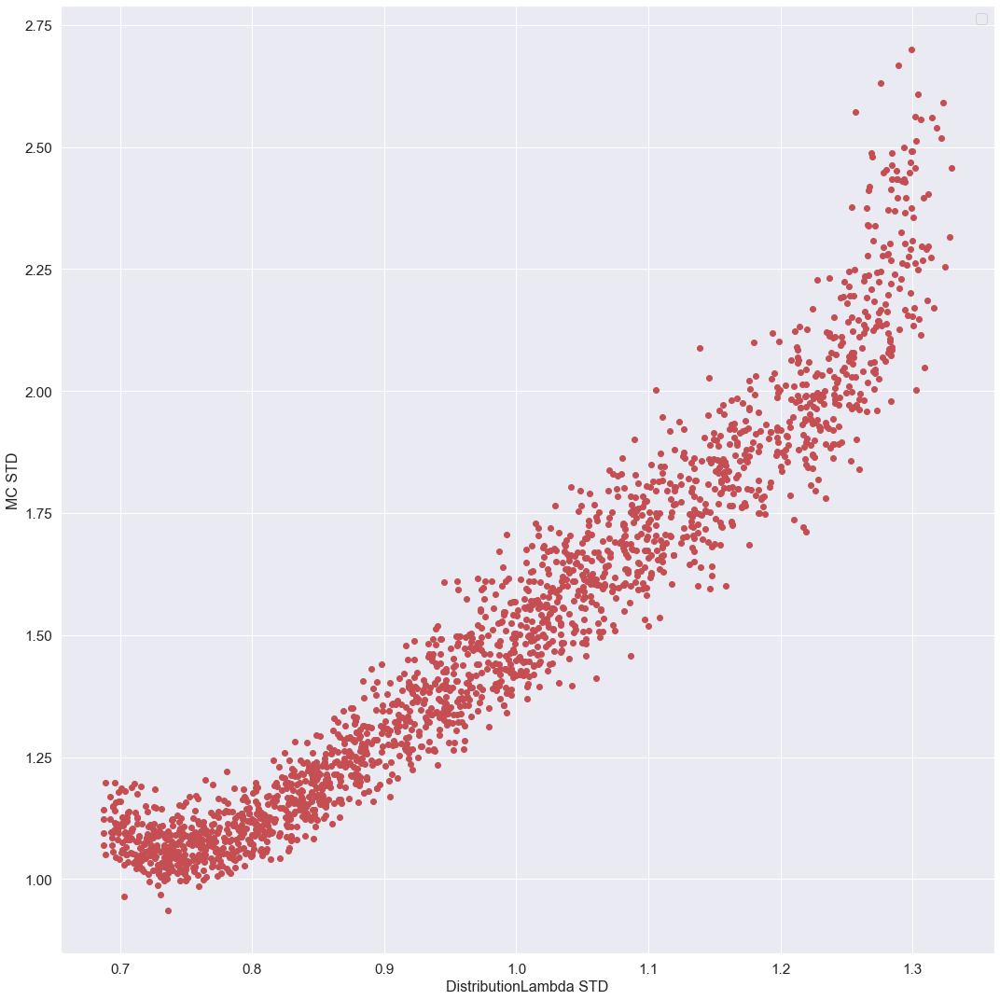

In [189]:
# Compare STDs
plt.figure(figsize=(15,15))
plt.plot(yhat.stddev(), np.std(np.array(predictions), axis=0), 'r o', label = "")

plt.xlabel("DistributionLambda STD", size = 16)
plt.ylabel("MC STD", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("DistributionLambda_MC_std.png")

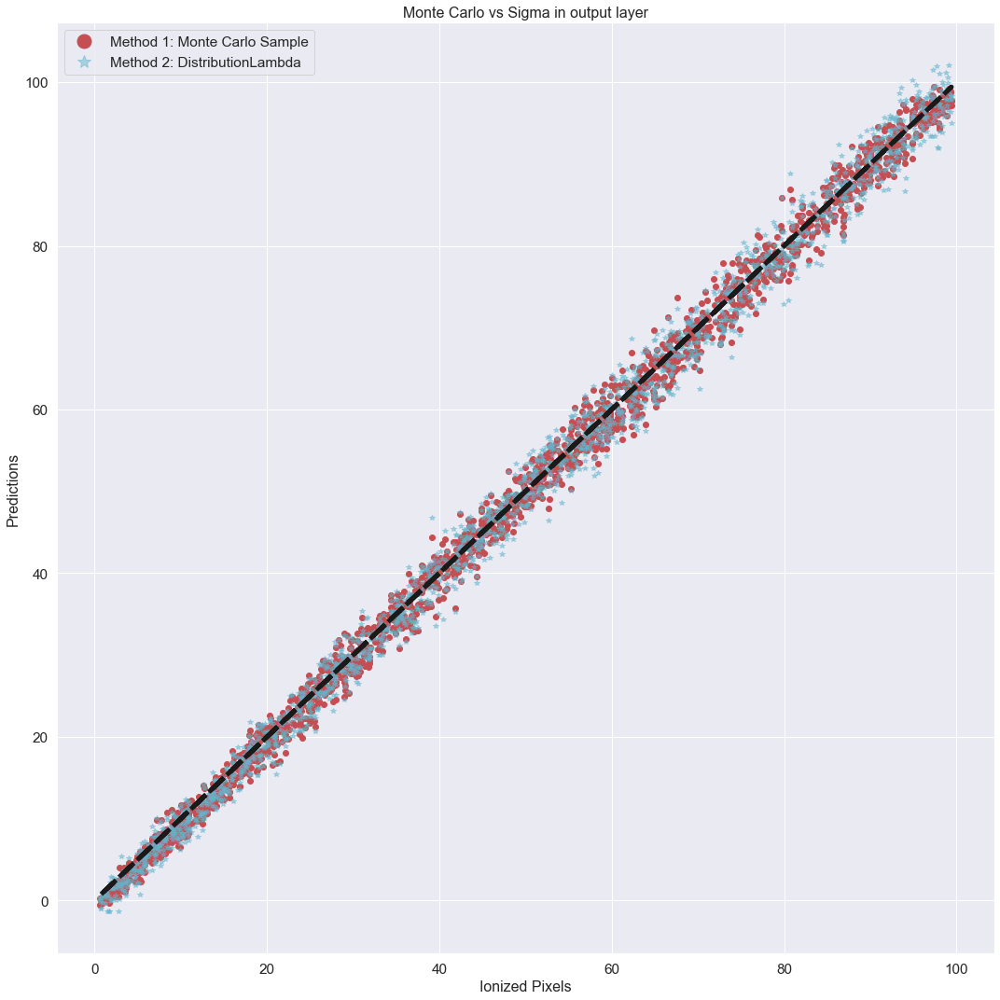

In [190]:
# Plot one-to-one predictions
plt.figure(figsize=(15,15))
plt.title("Monte Carlo vs Sigma in output layer", size = 16)

plt.plot(y_test, np.mean(np.array(predictions), axis=0), 'r o', label = "Method 1: Monte Carlo Sample")
plt.plot(y_test, yhat.mean(), 'c *', alpha = 0.5, label = "Method 2: DistributionLambda")
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("Monte_Carlo_vs_Sigma_in_output_layer.png")

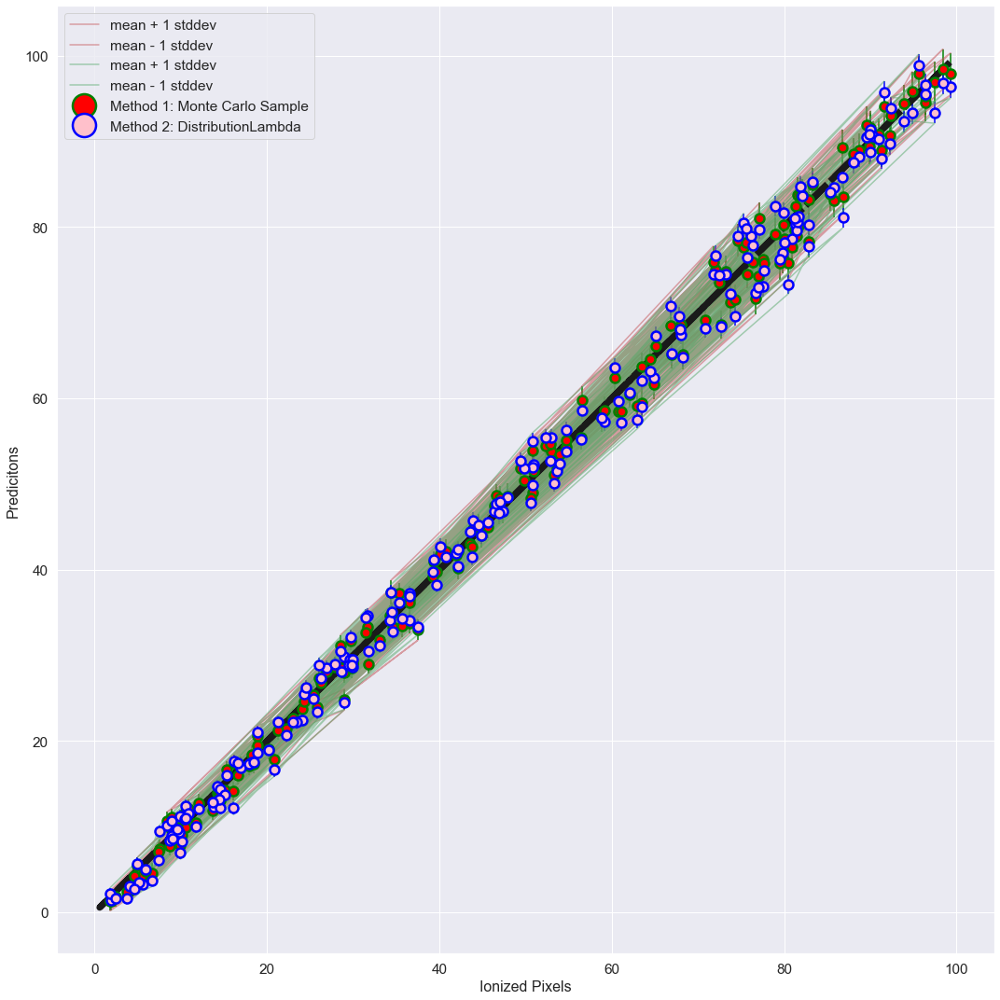

In [191]:
# Plot Error
plt.figure(figsize=(15,15))
#plt.title("Error bars for the posterior using Monte Carlo vs Sigma in output layer", size = 16)

plt.errorbar(y_test[0::10], np.mean(np.array(predictions), axis=0)[0::10], yerr=np.std(predictions, axis=0)[0::10], marker='.',
                          mfc='red', mec='green', c='green', mew=2.5, ms=20, ls='', label="Method 1: Monte Carlo Sample")
plt.errorbar(y_test[0::10], yhat.mean().numpy()[0::10,0], yerr=yhat.stddev().numpy()[0::10,0], marker='.',
                          mfc='pink', mec='blue', c='blue', mew=2.5, ms=20, ls='', label="Method 2: DistributionLambda")

plt.plot(y_test[0::10],np.mean(np.array(predictions), axis=0)[0::10]+np.std(predictions, axis=0)[0::10], 'r-', alpha=0.5,
                  label='mean + 1 stddev'
                 )
plt.plot(y_test[0::10],np.mean(np.array(predictions), axis=0)[0::10]-np.std(predictions, axis=0)[0::10], 'r-', alpha=0.5,
                  label='mean - 1 stddev'
                 )

plt.plot(y_test[0::10],yhat.mean().numpy()[0::10]+yhat.stddev().numpy()[0::10], 'g-', alpha=0.5,
                  label='mean + 1 stddev'
                 )
plt.plot(y_test[0::10],yhat.mean().numpy()[0::10]-yhat.stddev().numpy()[0::10], 'g-', alpha=0.5,
                  label='mean - 1 stddev'
                 )

plt.plot(y_test,y_test, "k--", linewidth=7)
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predicitons", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("error_plot1.png")

# Plot Error

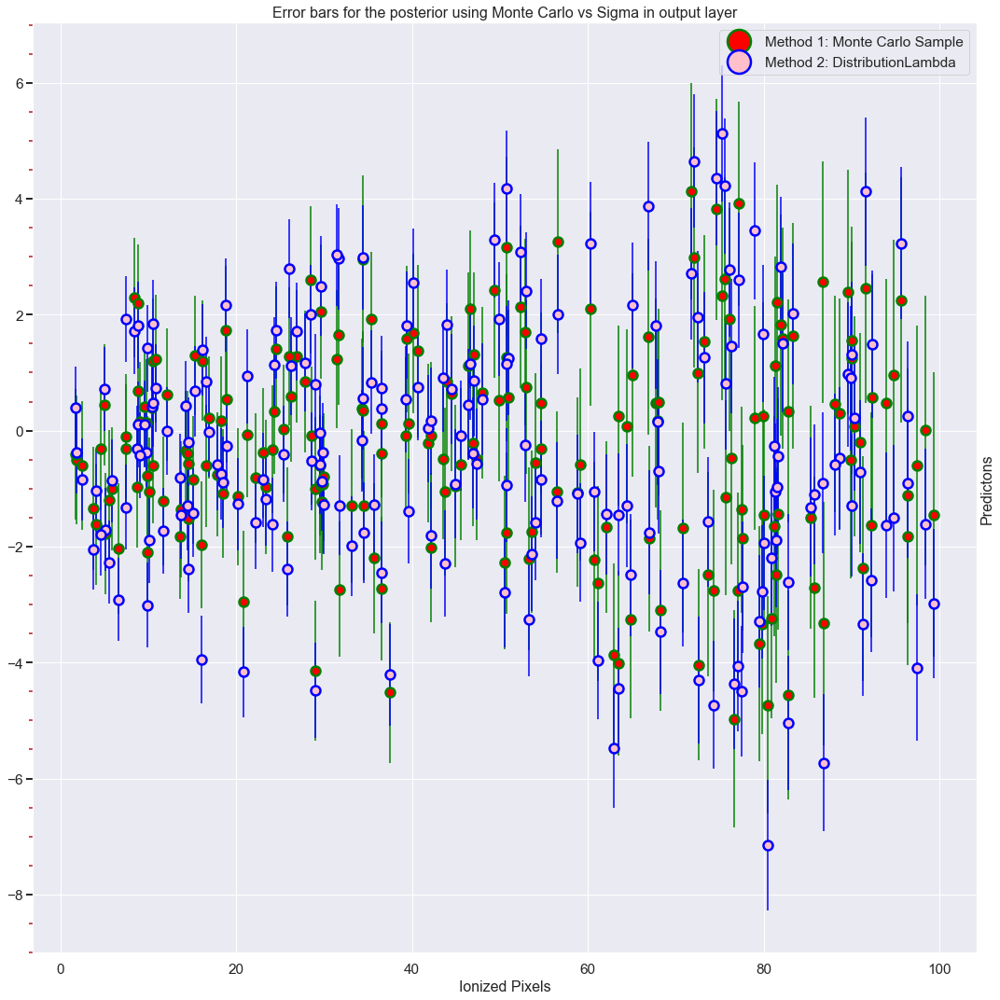

In [192]:
f=plt.figure(figsize=(15,15))

ax = f.add_subplot(111)
ax.yaxis.tick_left()
ax.yaxis.set_label_position("right")

ax.yaxis.set_minor_locator(AutoMinorLocator())
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=7)
ax.tick_params(which='minor', length=4, color='r')

plt.title("Error bars for the posterior using Monte Carlo vs Sigma in output layer", size = 16)

ax.errorbar(y_test[0::10], (np.mean(np.array(predictions), axis=0)-y_test)[0::10], yerr=np.std(predictions, axis=0)[0::10], marker='.',
                         mfc='red', mec='green', c='green', mew=2.5, ms=20, ls='', label="Method 1: Monte Carlo Sample")
ax.errorbar(y_test[0::10], yhat.mean().numpy()[0::10,0]-y_test[0::10], yerr=yhat.stddev().numpy()[0::10,0], marker='.',
                         mfc='pink', mec='blue', c='blue', mew=2.5, ms=20, ls='', label="Method 2: DistributionLambda")
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictons", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("error_plot2.png")

In [193]:
print("Print weights")
print(model.weights)

Print weights
[<tf.Variable 'conv2d_flipout_35/kernel_posterior_loc:0' shape=(3, 3, 1, 32) dtype=float32, numpy=
array([[[[ 0.42664602, -0.31320086,  0.08372482,  0.18681216,
           0.62388474, -0.69015604, -0.12607402,  0.21708941,
          -0.32707742, -0.13069   , -0.10095904,  0.25034294,
          -0.23617207, -0.34608483,  0.11187232, -0.49080464,
          -0.11061173,  0.00689026, -0.6110443 , -0.21049243,
           0.6823025 ,  0.2405205 ,  0.79820234, -0.24497418,
          -0.17816997, -0.2205941 , -0.03206851, -0.24478017,
          -0.00704557, -0.14733821,  0.30900362, -0.3912487 ]],

        [[ 0.22473082, -0.03956869,  0.5738278 , -0.12379123,
          -0.24984147, -0.427073  ,  0.04064135, -0.24581094,
          -0.02783392, -0.23750292, -0.11642911, -0.15998158,
          -0.7635572 , -0.3760663 ,  0.44116813, -0.46437758,
          -0.24778166, -0.02584433, -0.6786897 , -0.16585879,
           0.30858925, -0.12542626,  0.35900873, -0.4507563 ,
          -0.161

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


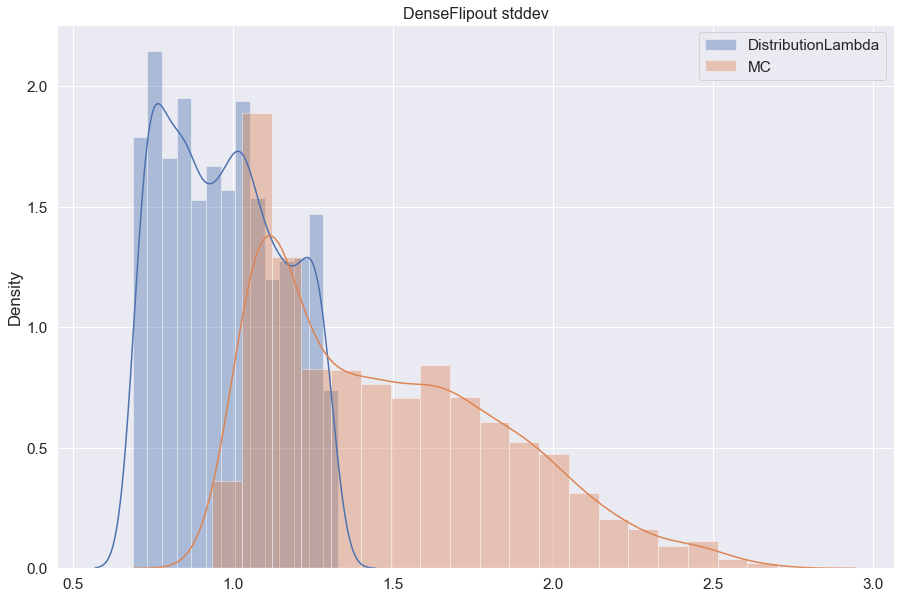

In [194]:
plt.figure(figsize=(15, 10))
sns.distplot(yhat.stddev(),label="DistributionLambda")
sns.distplot(np.std(np.array(predictions), axis=0), label= "MC")
plt.title("DenseFlipout stddev",size = 16 )
plt.legend()
#plt.savfig("DenseFlipout_stddev.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

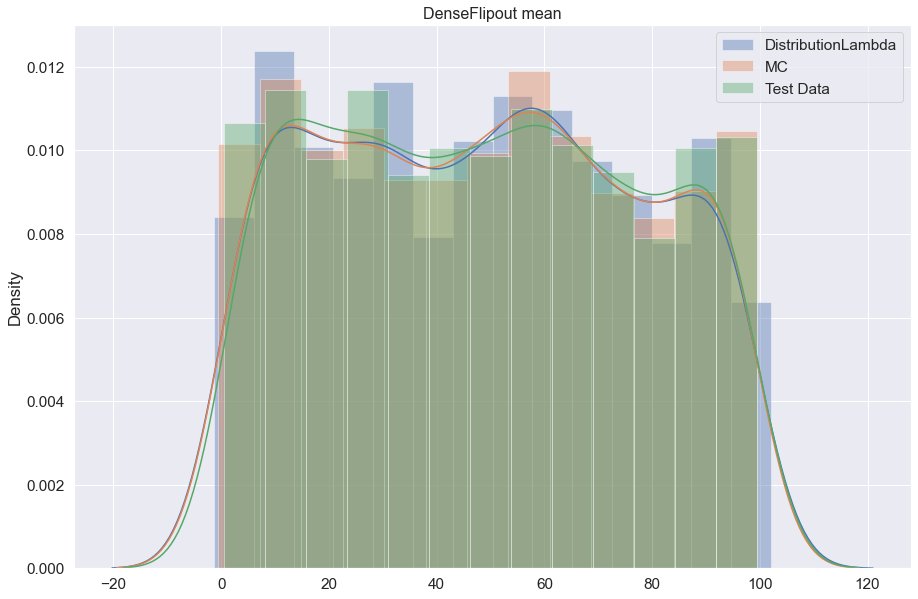

In [195]:
plt.figure(figsize=(15, 10))
sns.distplot(yhat.mean(),label="DistributionLambda")
sns.distplot(np.mean(np.array(predictions), axis=0), label= "MC")
sns.distplot(y_test, label= "Test Data")
plt.title("DenseFlipout mean",size = 16 )
plt.legend()
#plt.savfig("DenseFlipout_mean.png")

In [196]:
coefficients = []

fp = open(outputdir+"bestmodel_estimated_coefficients_1.log", 'w+')
fp.write("b_0, b_1 \n")

if __name__ == "__main__":

    for p in np.arange(len(tuner.get_best_models(num_models=20))):
        main(x=np.array(predictions)[p], y=y_test, labelname=str(tuner.get_best_models(num_models=15)[p-1]))
    fp.close()

# Empirical Examination of Posterior Distribution
bnn_model = tuner.get_best_models(num_models=1)[0]
sns.set(font_scale=1.4)
def plot_weight_posteriors(names, qm_vals, qs_vals):
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(1, 2, 1)
    for n, qm in zip(names, qm_vals):
        sns.distplot(tf.reshape(qm, shape=[-1]), ax=ax, label=n)
    ax.set_title("weight means",size = 16 )
    ax.set_xlim([-1.5, 1.5])
    ax.legend()
    ax = fig.add_subplot(1, 2, 2)
    for n, qs in zip(names, qs_vals):
        sns.distplot(tf.reshape(qs, shape=[-1]), ax=ax)
    ax.set_title("weight stddevs", size = 16)
    ax.set_xlim([0, 1.0])
    fig.tight_layout()
    #plt.savefig("empirical_examination_DistributionLambda.png")#show()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

NotFoundError: Unsuccessful TensorSliceReader constructor: Failed to find any matching files for ./toy_model_tuner_32/trial_c91e518dfdae5238e6ab51dcb83d9706/checkpoints/epoch_0/checkpoint

In [ ]:
names = [layer.name for layer in bnn_model.layers if "flipout" in layer.name]
qm_vals = [
    layer.kernel_posterior.mean()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]
qs_vals = [
    layer.kernel_posterior.stddev()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]

plot_weight_posteriors(names, qm_vals, qs_vals)

plt.figure(figsize=(15, 10))
sns.distplot(tf.reshape(bnn_model.layers[-1].kernel_posterior.stddev(), shape=[-1]),
             label="{}".format(str(bnn_model.layers[-1].name)))
plt.title("DenseFlipout stddev",size = 16 )
plt.xlim([0, 1.25])
plt.legend()
#plt.savefig("DenseFlipout_stddev_DistributionLambda.png")

### Empirical Examination of Posterior Distribution

# Model 5

In [129]:
if os.path.isdir(project_name): # check to see if path exists
    os.system("rm -rvf {}".format(project_name))

def train_test_og_model(hp):
    # Making a model.
    model = Sequential()

    # Added Layers.
    model.add(tfp.layers.Convolution2DFlipout(filters = 32,
                                              input_shape=(nx, ny, 1), kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(tfp.layers.Convolution2DFlipout(filters = 28, kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    
    model.add(Flatten())
    
    model.add(Dropout(0.2))
    model.add(tfp.layers.DenseFlipout(100, activation="linear", kernel_divergence_fn=kl_divergence_function,))
    
    model.add(Dropout(0.2))
    model.add(tfp.layers.DenseFlipout(10, activation="linear", kernel_divergence_fn=kl_divergence_function,))

    model.add(Dropout(0.2))
    model.add(tfp.layers.DenseFlipout(1, activation="linear", kernel_divergence_fn=kl_divergence_function,))

    #for l in range(hp.Int('loss', 0, len(losses))):
    model.compile(optimizer= "adam", loss = hp.Choice('loss_type', ["mse", "mae", "mape", "Mean_Squared_over_true_Error"], ordered=False, default="mse"), metrics=["mse"])

    # Visualize Model
    print(model.summary())

    return model

# Start Tuning based on low validation loss
tuner = RandomSearch(train_test_og_model,
                     objective='val_loss', # 'loss', 'val_loss', 'val_accuracy'
                     max_trials= num_models,# specify the number of different models to try
                     executions_per_trial=1, #2,
                     directory=outputdir,
                     seed=42,
                     project_name=project_name)

# Print a summary of the search space
tuner.search_space_summary()

# Show the best models, their hyperparameters, and the resulting metrics.
tuner.search(X_train, y_train,
                          epochs=5,#hp.Int('epoch',min_value=10,max_value=HP_EPOCH,step=10,default=10),
                          validation_data=(X_test, y_test),
                          batch_size=HP_BATCH_SIZE,
                         #callbacks=[plotlosses],
                         verbose=1)

Trial 4 Complete [00h 01m 43s]
val_loss: 29.256816864013672

Best val_loss So Far: 14.297478675842285
Total elapsed time: 00h 06m 58s
INFO:tensorflow:Oracle triggered exit


In [130]:
tuner.results_summary()

Results summary
Results in ./toy_model_tuner_32
Showing 10 best trials
Objective(name='val_loss', direction='min')
Trial summary
Hyperparameters:
loss_type: Mean_Squared_over_true_Error
Score: 14.297478675842285
Trial summary
Hyperparameters:
loss_type: mae
Score: 29.256816864013672
Trial summary
Hyperparameters:
loss_type: mape
Score: 43.22761154174805
Trial summary
Hyperparameters:
loss_type: mse
Score: 69.71031188964844


In [131]:
# Retrieve the best model.
best_model = tuner.get_best_models(num_models=1)[0]

# Save best hyperperam Model
print("saving best hyperparameter model ...")
best_model.save(outputdir+"hyperParam_model_{}.h5".format(idx))

# Save best hyperperam Model Weights
print("saving best hyperparameter model weights ...")
best_model.save_weights(outputdir+"hyperParam_model_weights_{}.h5".format(idx))

# Save all other models so that we can see how the model behaves based on complexity
for indx in np.arange(len(tuner.get_best_models(num_models=20))):
    model_ = tuner.get_best_models(num_models=num_models)[indx]
    # Save Model weights
    model_.save_weights(outputdir+"hyperParam_weights_{}_{}.h5".format(str(indx+1),idx))
    print("Saving ... "+outputdir+"hyperParam_weights_{}_{}.h5".format(str(indx+1),idx))
    # Save Model
    model_.save(outputdir+"hyperParam_model_{}_{}.h5".format(str(indx+1),idx))
    print("Saving ... "+outputdir+"hyperParam_model_{}_{}.h5".format(str(indx+1),idx))

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

Saving ... hyperParam_weights_2_32.h5
Saving ... hyperParam_model_2_32.h5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
________________________________________________

Saving ... hyperParam_weights_3_32.h5
Saving ... hyperParam_model_3_32.h5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
________________________________________________

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

In [132]:
# print best performing model's loss function
print("Print potential best model")
print(tuner.get_best_models(num_models=1)[0].loss)

print("Print all models")
print(tuner.get_best_models(num_models=20))

print(tuner.search_space_summary())

print(tuner.results_summary())

Print potential best model
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

Starting MC Sampling
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None,

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

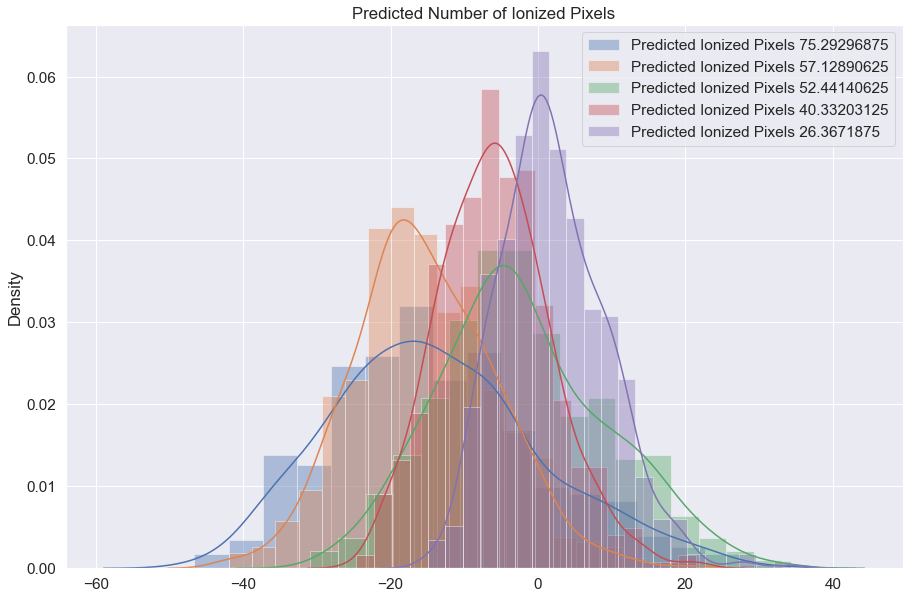

In [133]:
# Do MC Sampling
print("Starting MC Sampling")
bestmodel=tuner.get_best_models(num_models=1)[0]#.predict(X_test)
pred = []

for i in range(500):
    y_p = bestmodel.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])
    pred.append(y_p)

plt.figure(figsize=(15, 10))
plt.title("Predicted Number of Ionized {}".format("Pixels",size = 16 ))
sns.distplot(np.array(pred)[:,0]-y_test[0],label="Predicted Ionized Pixels {}".format(str(y_test[0])))
sns.distplot(np.array(pred)[:,1]-y_test[1],label="Predicted Ionized Pixels {}".format(str(y_test[1])))
sns.distplot(np.array(pred)[:,2]-y_test[2],label="Predicted Ionized Pixels {}".format(str(y_test[2])))
sns.distplot(np.array(pred)[:,3]-y_test[3],label="Predicted Ionized Pixels {}".format(str(y_test[3])))
sns.distplot(np.array(pred)[:,4]-y_test[4],label="Predicted Ionized Pixels {}".format(str(y_test[4])))
plt.legend(markerscale=2.5)
#plt.savefig("predicted_number_of_ionized_pixels.png")

No handles with labels found to put in legend.


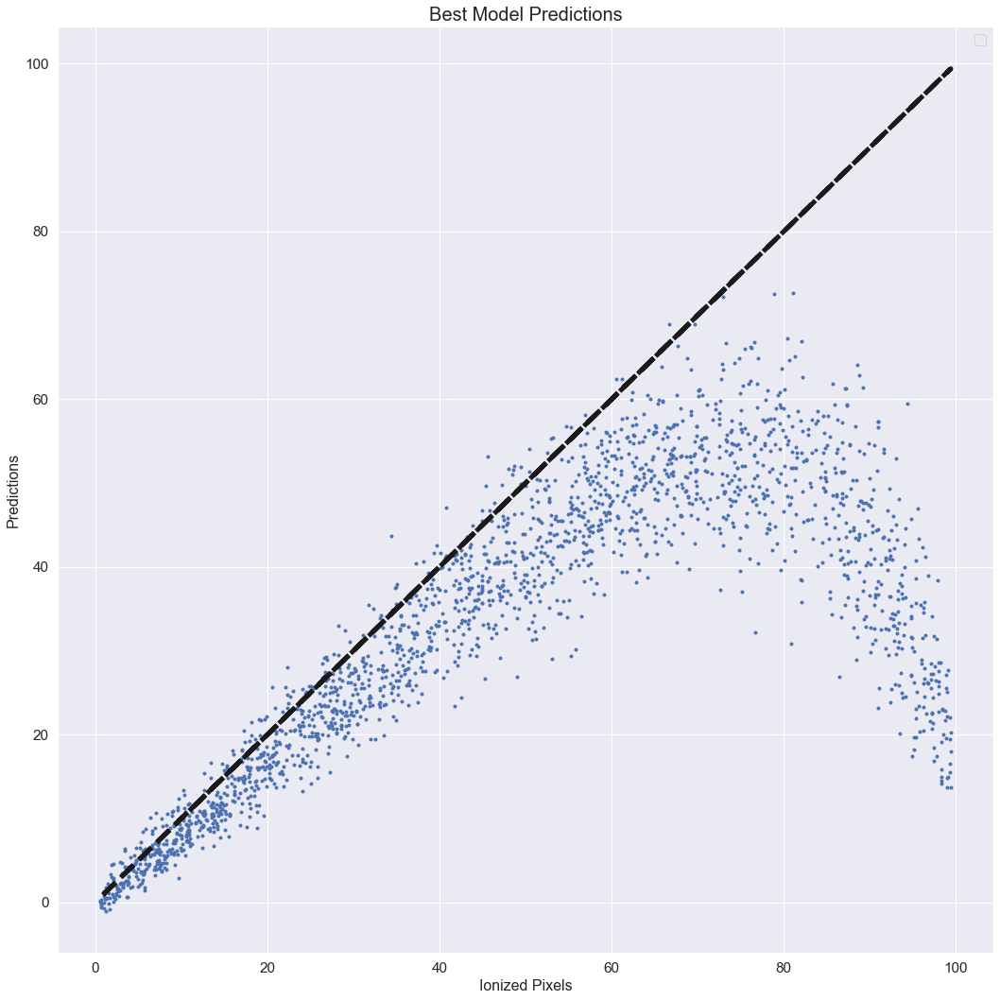

In [134]:
plt.figure(figsize=(15,15))
plt.title("Best Model Predictions", size = 20)
plt.plot(y_test, np.mean(np.array(pred), axis=0), '.')#, label = str(tuner.get_best_models(num_models=num_models)[l-1]))
plt.plot(y_test,y_test, "k--", linewidth=5)
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("BestModel_Predictions.png")

In [135]:
# make predictions
prediction = []
predictions = np.empty([len(X_test),])

for m in tuner.get_best_models(num_models=num_models):
    for i in range(5):
        y_p = m.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])
        prediction.append(y_p) # (500, 100, 1) = (# of masks, # of datasets, # of classes)
    prediction = np.mean(np.array(prediction), axis=0)
    predictions = np.vstack((predictions, prediction))
    prediction = []
print(X_test.shape)
print(predictions.shape)
print(y_test.shape)

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

(2000, 32, 32, 1)
(5, 2000)
(2000,)


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

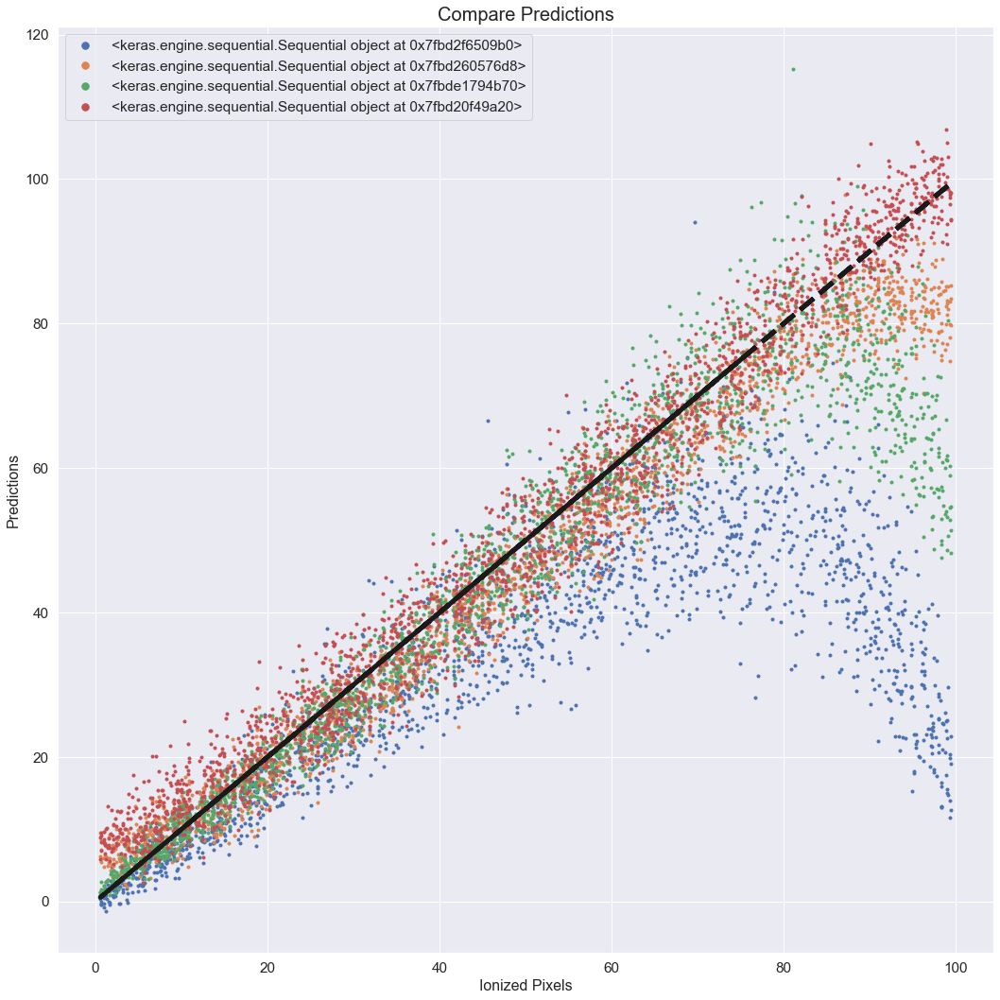

In [136]:
# Plot one-to-one predictions
plt.figure(figsize=(15,15))
plt.title("Compare Predictions", size = 20)

for l in np.arange(1,5):
    plt.plot(y_test, predictions[l], '.', label = str(tuner.get_best_models(num_models=num_models)[l-1]))
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("Compare_Predictions.png")

# Empirical Examination of Posterior Distribution

In [137]:
bnn_model = tuner.get_best_models(num_models=1)[0]
sns.set(font_scale=1.4)
def plot_weight_posteriors(names, qm_vals, qs_vals):
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(1, 2, 1)
    for n, qm in zip(names, qm_vals):
        sns.distplot(tf.reshape(qm, shape=[-1]), ax=ax, label=n)
    ax.set_title("weight means",size = 16 )
    ax.set_xlim([-1.5, 1.5])
    ax.legend()
    ax = fig.add_subplot(1, 2, 2)
    for n, qs in zip(names, qs_vals):
        sns.distplot(tf.reshape(qs, shape=[-1]), ax=ax)
    ax.set_title("weight stddevs", size = 16)
    ax.set_xlim([0, 1.0])
    fig.tight_layout()
    #plt.savefig("empirical_examination_mc.png")#show()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

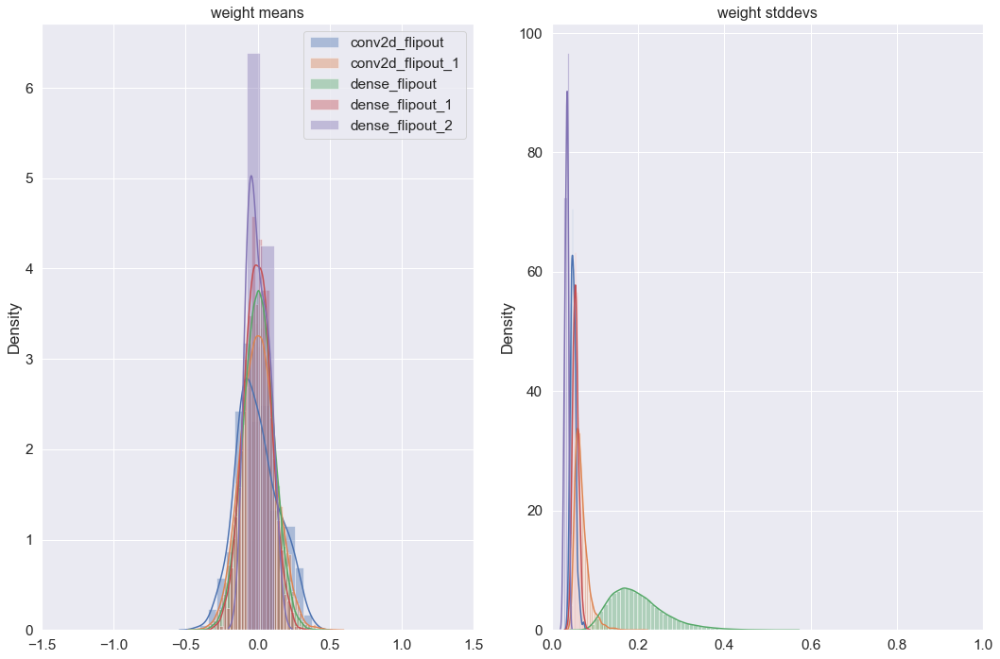

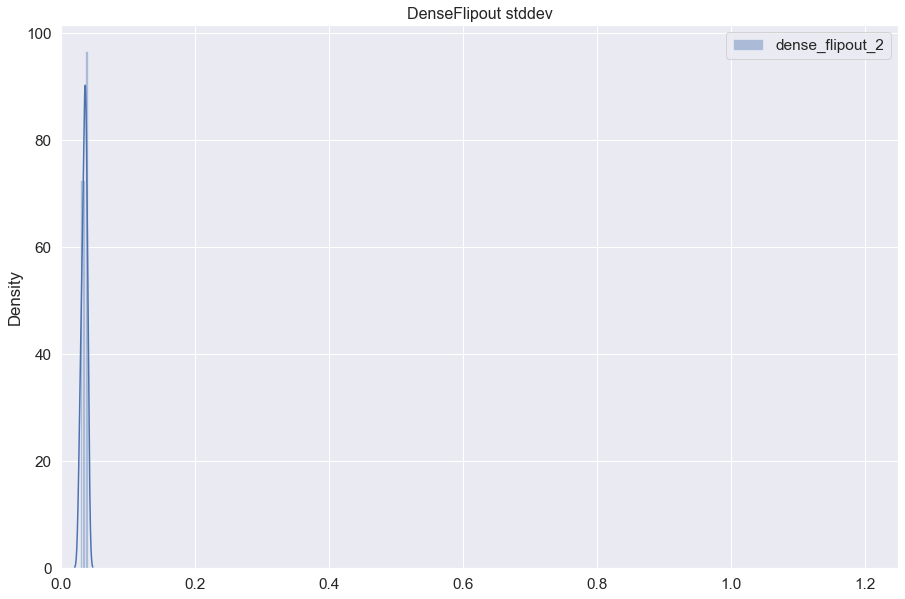

In [138]:
names = [layer.name for layer in bnn_model.layers if "flipout" in layer.name]
qm_vals = [
    layer.kernel_posterior.mean()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]
qs_vals = [
    layer.kernel_posterior.stddev()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]

plot_weight_posteriors(names, qm_vals, qs_vals)

plt.figure(figsize=(15, 10))
sns.distplot(tf.reshape(bnn_model.layers[-1].kernel_posterior.stddev(), shape=[-1]),
             label="{}".format(str(bnn_model.layers[-1].name)))
plt.title("DenseFlipout stddev",size = 16 )
plt.xlim([0, 1.25])
plt.legend()
#plt.savefig("DenseFlipout_stddev_mc.png")

# Learn STD and Mean

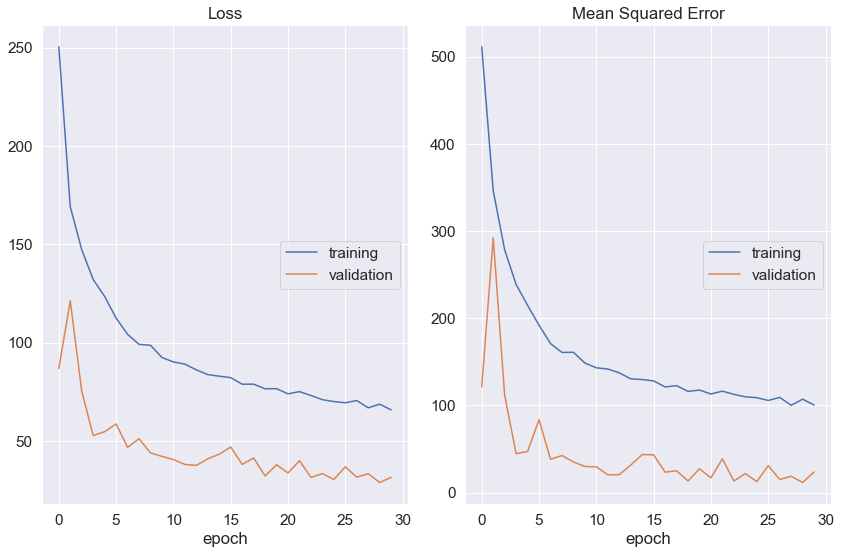

Loss
	training         	 (min:   65.770, max:  250.428, cur:   65.770)
	validation       	 (min:   28.860, max:  121.238, cur:   31.492)
Mean Squared Error
	training         	 (min:  100.198, max:  511.344, cur:  100.508)
	validation       	 (min:   11.636, max:  292.326, cur:   23.714)
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout_4 (Conv2DFlip (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization_3 (Batch (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_5 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_4 (Batch (

In [166]:
def train_test_og_model():
    # Making a model.
    model = Sequential()

    # Added Layers.
    model.add(tfp.layers.Convolution2DFlipout(filters = 32,
                                              input_shape=(nx, ny, 1), kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(tfp.layers.Convolution2DFlipout(filters = 28, kernel_divergence_fn=kl_divergence_function,
                                              kernel_size=3, activation = 'relu'
                                              , padding = 'valid',
                                              ))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    
    model.add(Flatten())
    
    model.add(Dropout(0.2))
    model.add(tfp.layers.DenseFlipout(100, activation="linear", kernel_divergence_fn=kl_divergence_function,))
    
    model.add(Dropout(0.2))
    model.add(tfp.layers.DenseFlipout(10, activation="linear", kernel_divergence_fn=kl_divergence_function,))

    model.add(Dropout(0.2))
    model.add(tfp.layers.DenseFlipout(1, activation="linear", kernel_divergence_fn=kl_divergence_function,))
    model.add(tfp.layers.DistributionLambda(
        lambda t: tfd.Normal(loc=t[..., :1],
                             #scale = 1)))
                             scale=1e-3 + tf.math.softplus(0.01 * t[..., :1]))))

    model.compile(optimizer= "adam", loss = "neg_log_likelihood", metrics=["mse"])

    plotlosses = PlotLossesKeras()

    model.fit(X_train, y_train, validation_data=(X_test, y_test),
              epochs=HP_EPOCH, batch_size=HP_BATCH_SIZE,
              callbacks=[plotlosses],
              verbose=1)

    # Visualize Model
    print(model.summary())

    loss = model.evaluate(X_test, y_test)
    return model

model = train_test_og_model()

In [167]:
# make predictions
print("Make MC predictions")
predictions = []
for i in range(500):
    y_p = model.predict(X_test).squeeze()#predict(X_test, batch_size=test_labels.shape[0])
    predictions.append(y_p) # (500, 100, 1) = (# of masks, # of datasets, # of classes)

prediction = np.mean(np.array(predictions), axis=0)
print(X_test.shape)
print(prediction.shape)
print(y_test.shape)

Make MC predictions
(2000, 32, 32, 1)
(2000,)
(2000,)


/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

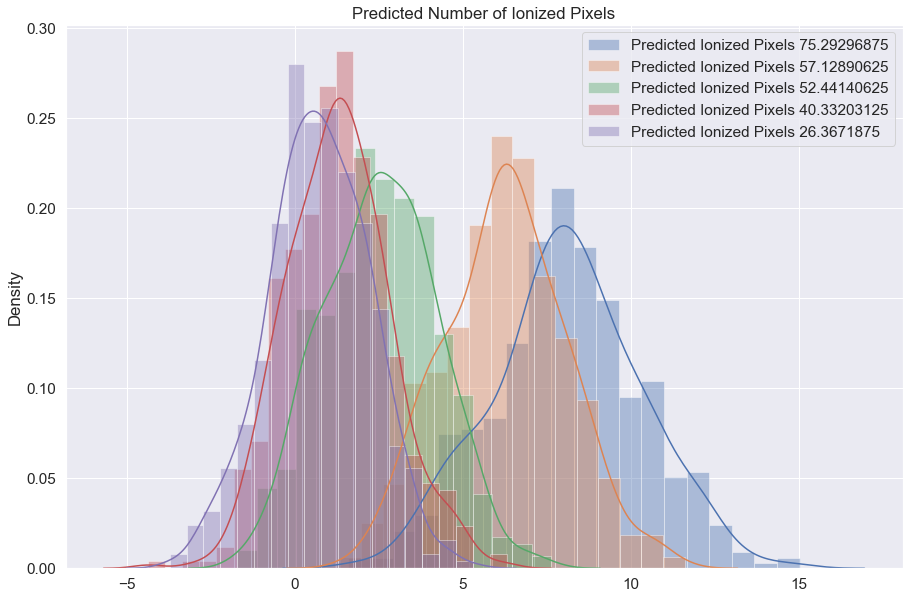

In [168]:
plt.figure(figsize=(15, 10))
plt.title("Predicted Number of Ionized {}".format("Pixels",size = 16 ))
sns.distplot(np.array(predictions)[:,0]-y_test[0],label="Predicted Ionized Pixels {}".format(str(y_test[0])))
sns.distplot(np.array(predictions)[:,1]-y_test[1],label="Predicted Ionized Pixels {}".format(str(y_test[1])))
sns.distplot(np.array(predictions)[:,2]-y_test[2],label="Predicted Ionized Pixels {}".format(str(y_test[2])))
sns.distplot(np.array(predictions)[:,3]-y_test[3],label="Predicted Ionized Pixels {}".format(str(y_test[3])))
sns.distplot(np.array(predictions)[:,4]-y_test[4],label="Predicted Ionized Pixels {}".format(str(y_test[4])))
plt.legend(markerscale=2.5)
#plt.savefig("predicted_number_of_ionized_empirical.png")#plt.show()

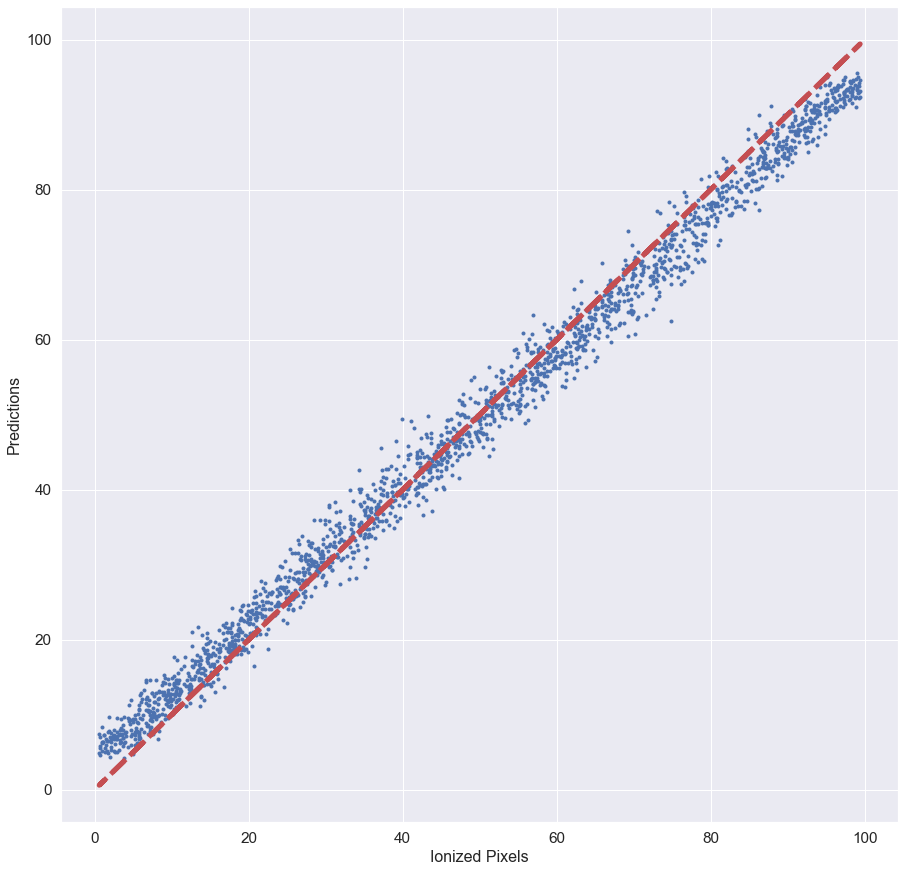

In [141]:
# Plot one-to-one predictions
plt.figure(figsize=(15,15))
plt.title("")
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.plot(y_test, prediction, '.')
plt.plot(y_test,y_test, "r--", linewidth=5)
#plt.savefig("Empirical_one2one_plots.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

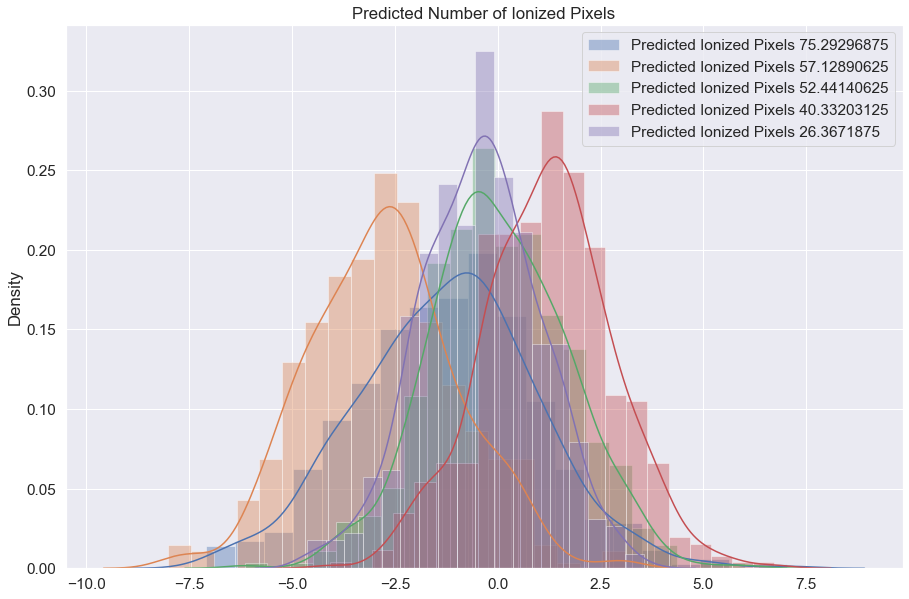

In [142]:
plt.figure(figsize=(15, 10))
plt.title("Predicted Number of Ionized {}".format("Pixels",size = 16 ))
sns.distplot(np.array(predictions)[:,0]-y_test[0],label="Predicted Ionized Pixels {}".format(str(y_test[0])))
sns.distplot(np.array(predictions)[:,1]-y_test[1],label="Predicted Ionized Pixels {}".format(str(y_test[1])))
sns.distplot(np.array(predictions)[:,2]-y_test[2],label="Predicted Ionized Pixels {}".format(str(y_test[2])))
sns.distplot(np.array(predictions)[:,3]-y_test[3],label="Predicted Ionized Pixels {}".format(str(y_test[3])))
sns.distplot(np.array(predictions)[:,4]-y_test[4],label="Predicted Ionized Pixels {}".format(str(y_test[4])))
plt.legend(markerscale=2.5)
#plt.savefig("predicted_number_of_ionized_empirical.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


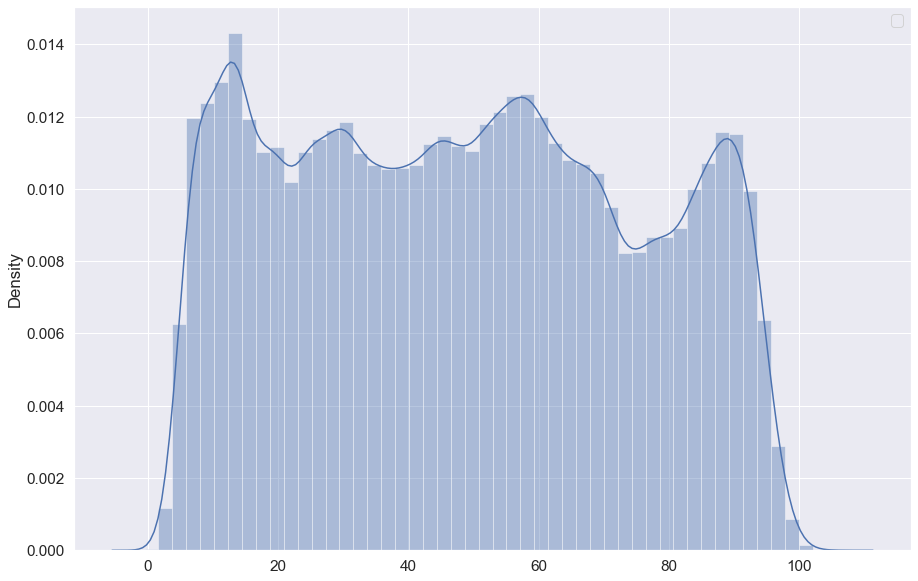

In [143]:
# Plot the distribution of the predictions within a certain range.
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions))
plt.legend(markerscale=2.5)
#plt.savefig("range_of_predct0.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


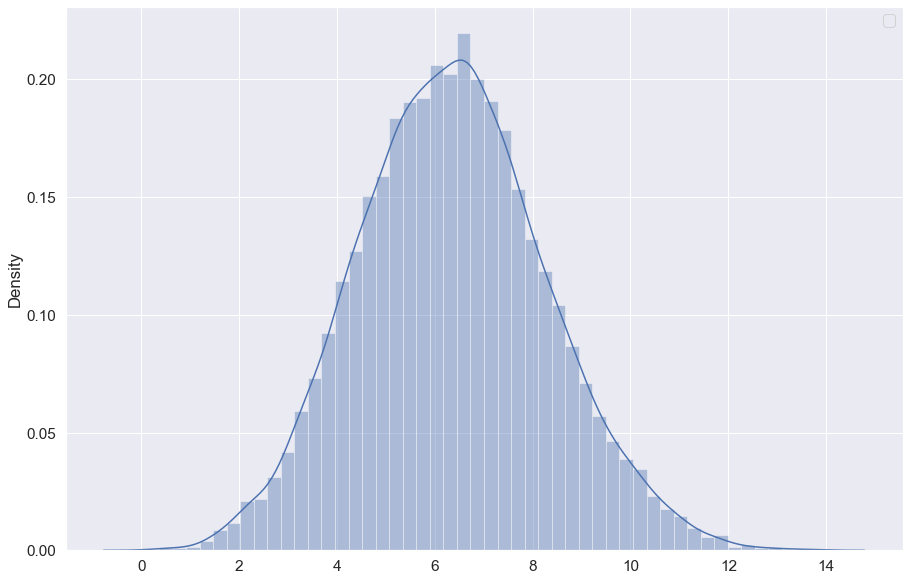

In [144]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions)[: , np.logical_and(y_test < 2, y_test >= 0)])
plt.legend(markerscale=2.5)
#plt.savefig("range_of_predct1.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


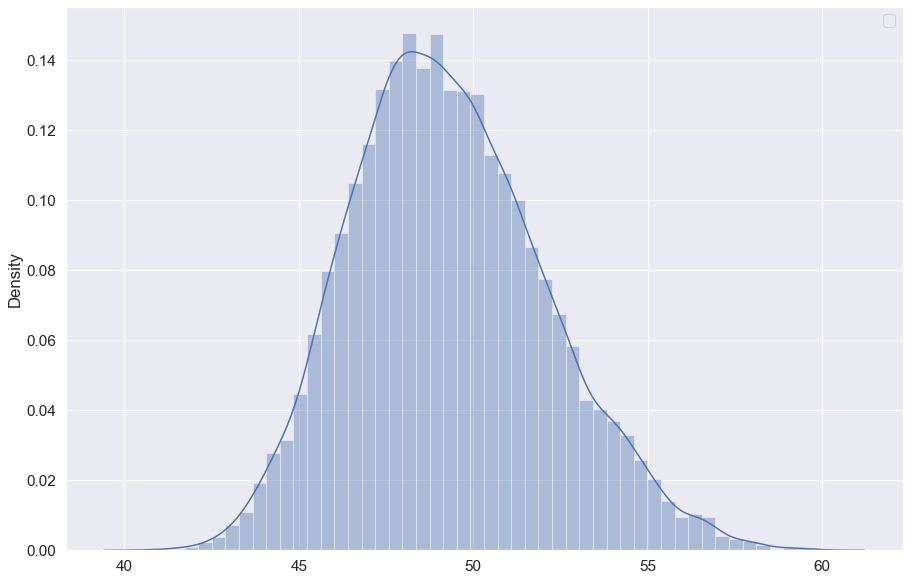

In [145]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions)[: , np.logical_and(y_test < 51, y_test >= 49)])
plt.legend(markerscale=2.5)
#plt.savefig("range_of_predct2.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
No handles with labels found to put in legend.


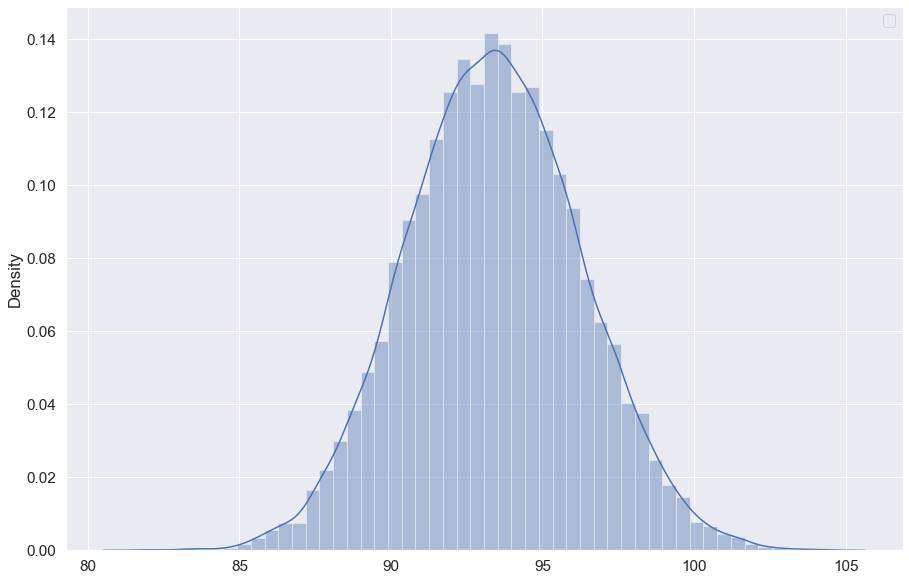

In [146]:
plt.figure(figsize=(15, 10))
sns.distplot(np.array(predictions)[: , np.logical_and(y_test < 100, y_test >= 98)])
plt.legend(markerscale=2.5)
#plt.savefig("range_of_predct3.png")

# Error Bars
METHOD 1: Empirical error bars for the posterior using Monte Carlo

METHOD 2: Sigma in output layer

In [147]:
yhat = model(X_test) # model.predict(X_test)

No handles with labels found to put in legend.


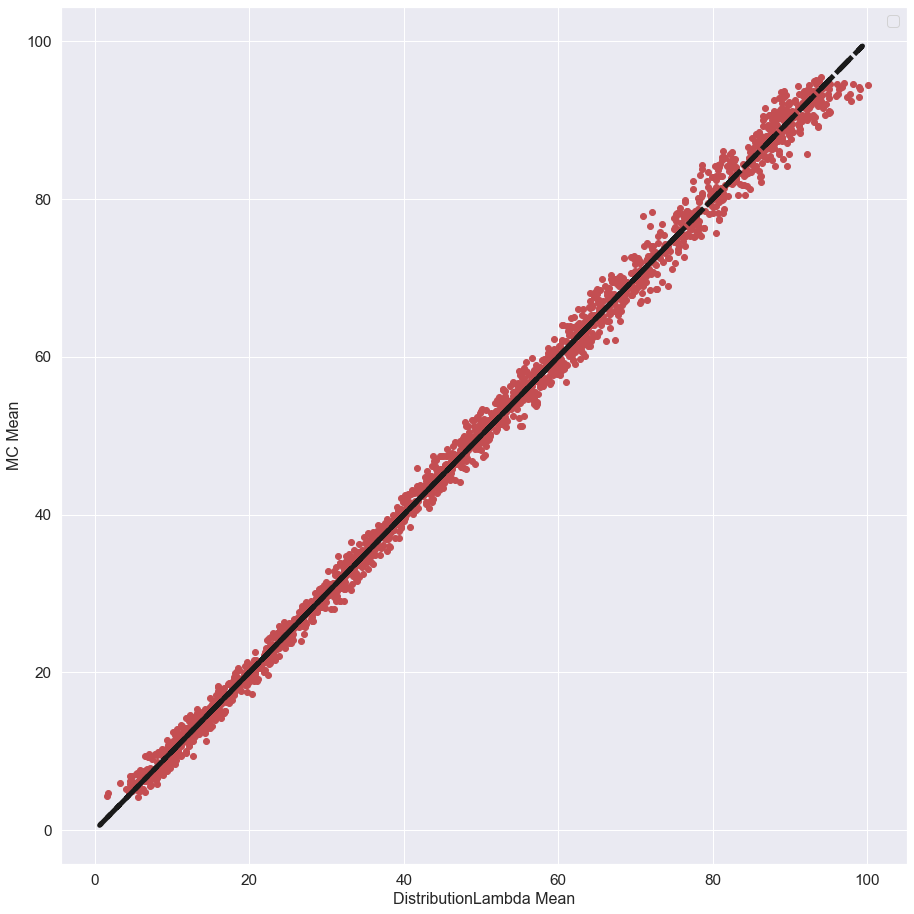

In [148]:
# Compare predicted values
plt.figure(figsize=(13,13))
plt.plot(yhat.mean(), np.mean(np.array(predictions), axis=0), 'r o', label = "")
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("DistributionLambda Mean", size = 16)
plt.ylabel("MC Mean", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("DistributionLambda_MC_mean.png")

No handles with labels found to put in legend.


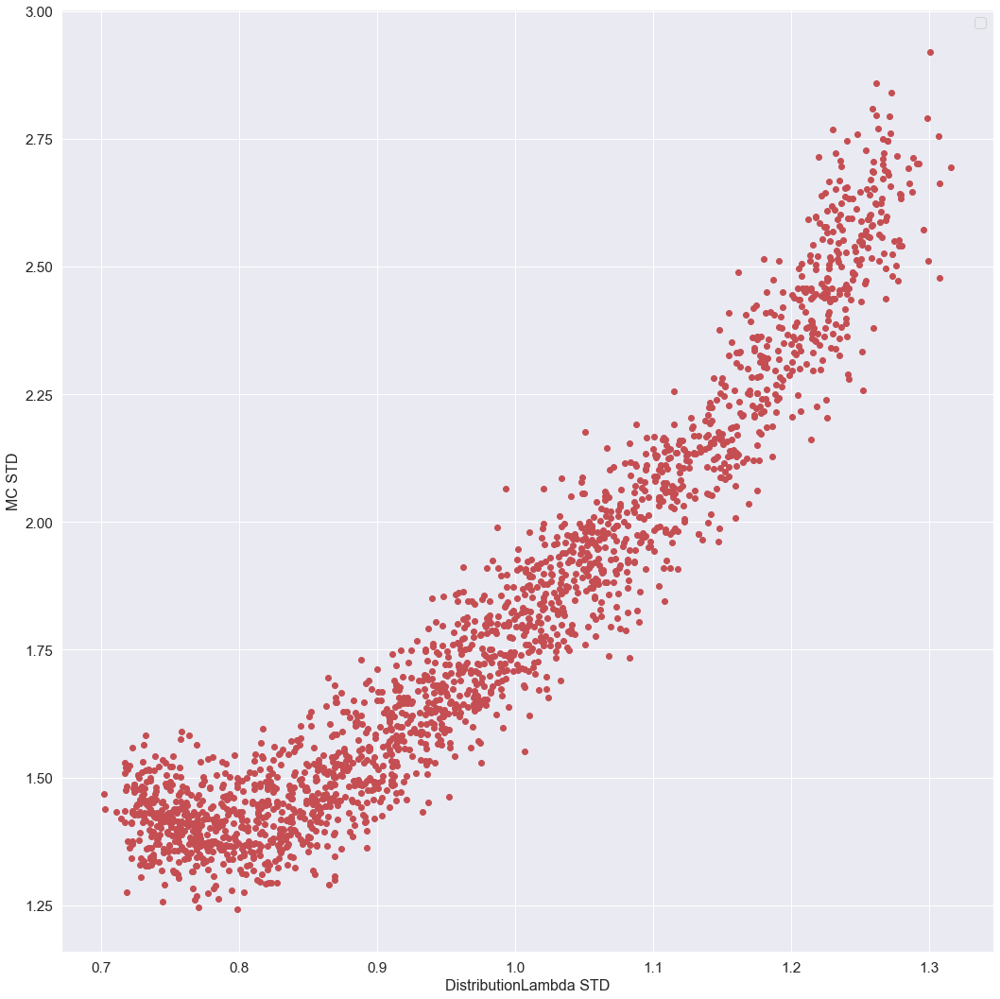

In [149]:
# Compare STDs
plt.figure(figsize=(15,15))
plt.plot(yhat.stddev(), np.std(np.array(predictions), axis=0), 'r o', label = "")

plt.xlabel("DistributionLambda STD", size = 16)
plt.ylabel("MC STD", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("DistributionLambda_MC_std.png")

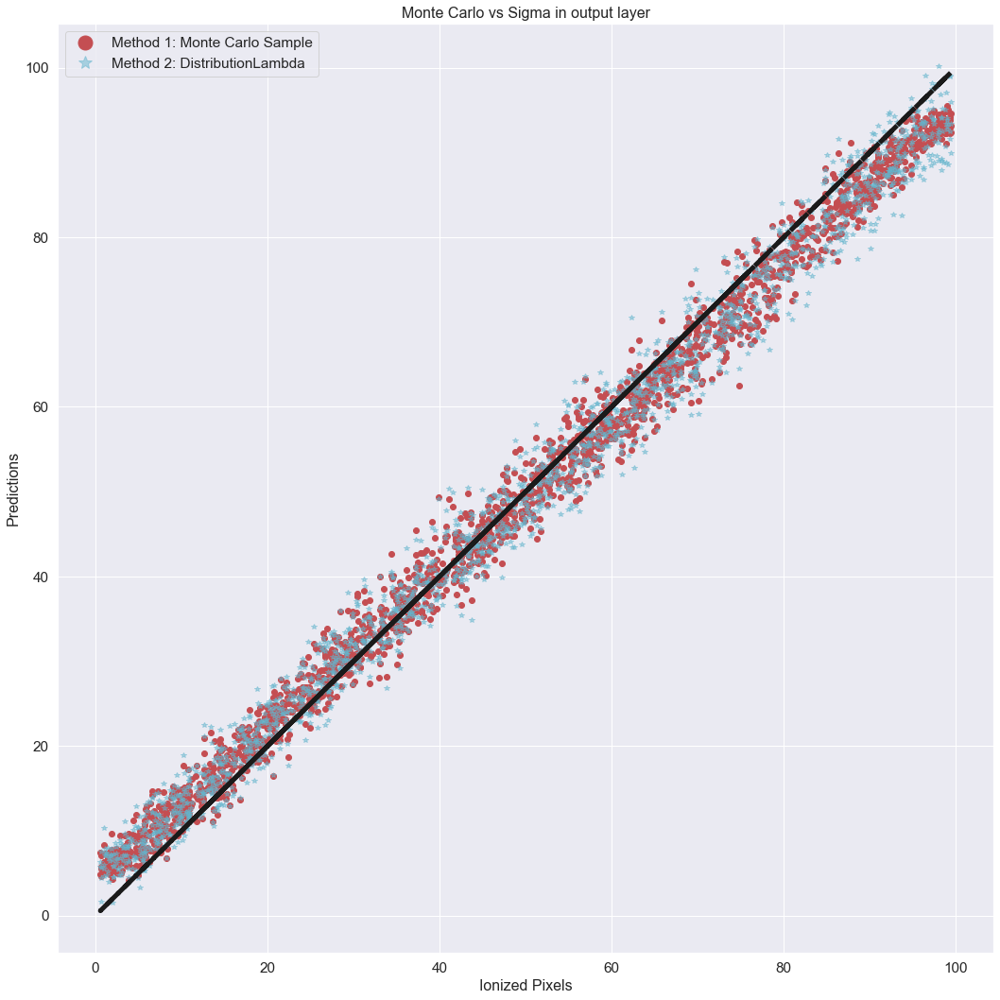

In [150]:
# Plot one-to-one predictions
plt.figure(figsize=(15,15))
plt.title("Monte Carlo vs Sigma in output layer", size = 16)

plt.plot(y_test, np.mean(np.array(predictions), axis=0), 'r o', label = "Method 1: Monte Carlo Sample")
plt.plot(y_test, yhat.mean(), 'c *', alpha = 0.5, label = "Method 2: DistributionLambda")
plt.plot(y_test,y_test, "k--", linewidth=5)

plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictions", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("Monte_Carlo_vs_Sigma_in_output_layer.png")

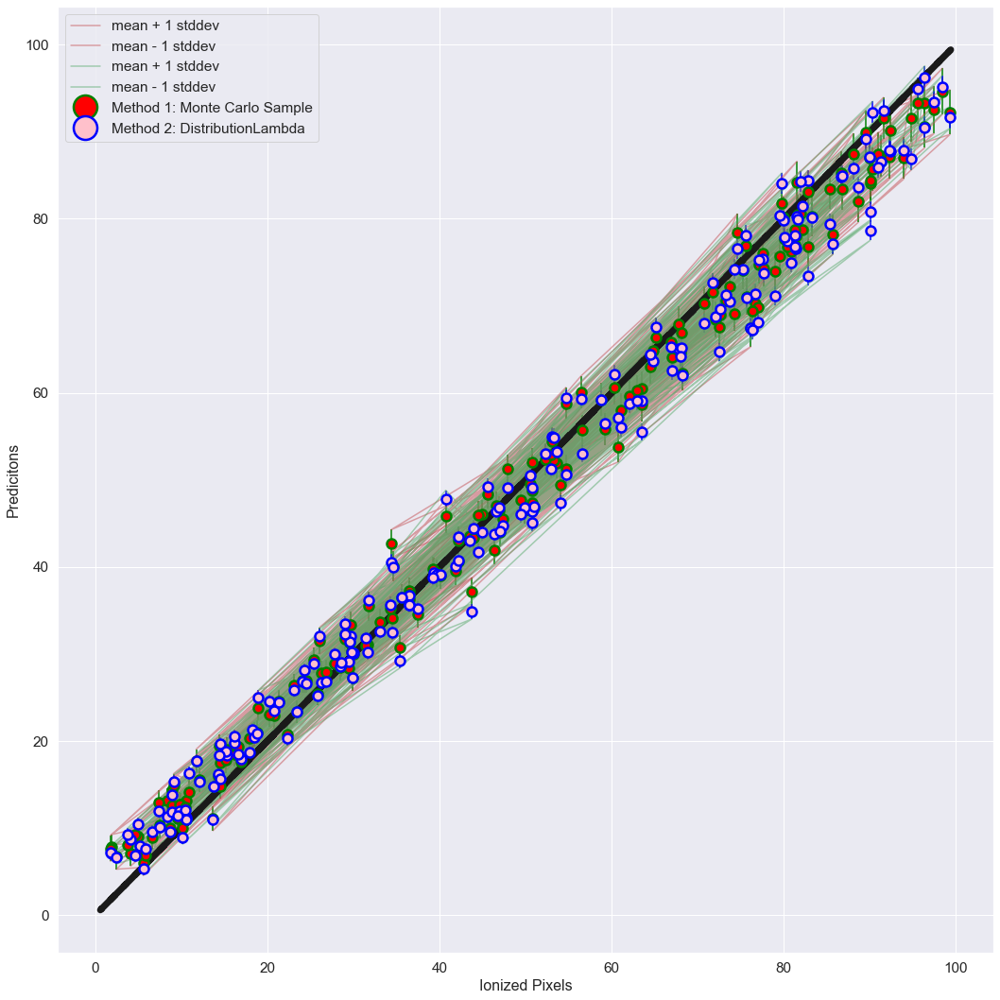

In [151]:
# Plot Error
plt.figure(figsize=(15,15))
#plt.title("Error bars for the posterior using Monte Carlo vs Sigma in output layer", size = 16)

plt.errorbar(y_test[0::10], np.mean(np.array(predictions), axis=0)[0::10], yerr=np.std(predictions, axis=0)[0::10], marker='.',
                          mfc='red', mec='green', c='green', mew=2.5, ms=20, ls='', label="Method 1: Monte Carlo Sample")
plt.errorbar(y_test[0::10], yhat.mean().numpy()[0::10,0], yerr=yhat.stddev().numpy()[0::10,0], marker='.',
                          mfc='pink', mec='blue', c='blue', mew=2.5, ms=20, ls='', label="Method 2: DistributionLambda")

plt.plot(y_test[0::10],np.mean(np.array(predictions), axis=0)[0::10]+np.std(predictions, axis=0)[0::10], 'r-', alpha=0.5,
                  label='mean + 1 stddev'
                 )
plt.plot(y_test[0::10],np.mean(np.array(predictions), axis=0)[0::10]-np.std(predictions, axis=0)[0::10], 'r-', alpha=0.5,
                  label='mean - 1 stddev'
                 )

plt.plot(y_test[0::10],yhat.mean().numpy()[0::10]+yhat.stddev().numpy()[0::10], 'g-', alpha=0.5,
                  label='mean + 1 stddev'
                 )
plt.plot(y_test[0::10],yhat.mean().numpy()[0::10]-yhat.stddev().numpy()[0::10], 'g-', alpha=0.5,
                  label='mean - 1 stddev'
                 )

plt.plot(y_test,y_test, "k--", linewidth=7)
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predicitons", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("error_plot1.png")

# Plot Error

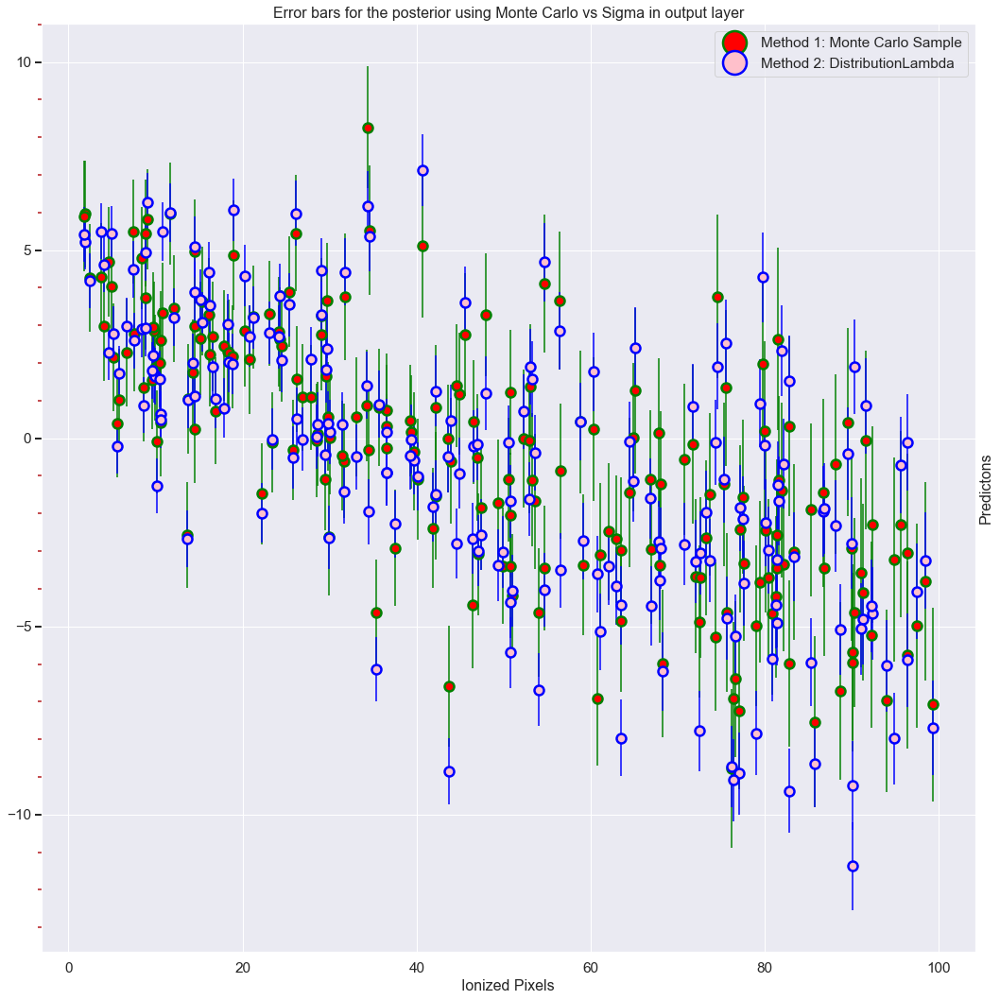

In [152]:
f=plt.figure(figsize=(15,15))

ax = f.add_subplot(111)
ax.yaxis.tick_left()
ax.yaxis.set_label_position("right")

ax.yaxis.set_minor_locator(AutoMinorLocator())
ax.tick_params(which='both', width=2)
ax.tick_params(which='major', length=7)
ax.tick_params(which='minor', length=4, color='r')

plt.title("Error bars for the posterior using Monte Carlo vs Sigma in output layer", size = 16)

ax.errorbar(y_test[0::10], (np.mean(np.array(predictions), axis=0)-y_test)[0::10], yerr=np.std(predictions, axis=0)[0::10], marker='.',
                         mfc='red', mec='green', c='green', mew=2.5, ms=20, ls='', label="Method 1: Monte Carlo Sample")
ax.errorbar(y_test[0::10], yhat.mean().numpy()[0::10,0]-y_test[0::10], yerr=yhat.stddev().numpy()[0::10,0], marker='.',
                         mfc='pink', mec='blue', c='blue', mew=2.5, ms=20, ls='', label="Method 2: DistributionLambda")
plt.xlabel("Ionized Pixels", size = 16)
plt.ylabel("Predictons", size = 16)
plt.legend(markerscale=2.5)
plt.tight_layout()
#plt.savefig("error_plot2.png")

In [153]:
print("Print weights")
print(model.weights)

Print weights
[<tf.Variable 'conv2d_flipout_2/kernel_posterior_loc:0' shape=(3, 3, 1, 32) dtype=float32, numpy=
array([[[[ 2.85352737e-01, -3.69070709e-01, -1.24177672e-01,
          -6.98426843e-01, -5.98615110e-01, -5.84319115e-01,
          -1.81695744e-01, -2.37801686e-01, -4.07735676e-01,
          -5.31373657e-02, -1.92430735e-01,  6.18059993e-01,
           3.05739731e-01, -7.46570947e-03, -7.08241761e-01,
          -7.30300993e-02, -2.05065757e-01,  1.77779377e-01,
           6.18389435e-02, -2.37164974e-01, -2.17093304e-01,
          -2.47967001e-02, -2.44545713e-01,  2.54414201e-01,
          -4.51000035e-01,  1.98727027e-01,  1.07051935e-02,
          -6.34032249e-01, -2.16712475e-01,  8.03403080e-01,
          -4.18469638e-01, -6.73745632e-01]],

        [[ 2.75173783e-01, -3.35225970e-01,  7.73424059e-02,
          -1.79362074e-01, -1.85109591e+00, -4.34738219e-01,
          -3.03610563e-01, -1.08068034e-01, -3.12889457e-01,
          -2.36225337e-01, -1.02615841e-01, -1.6

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


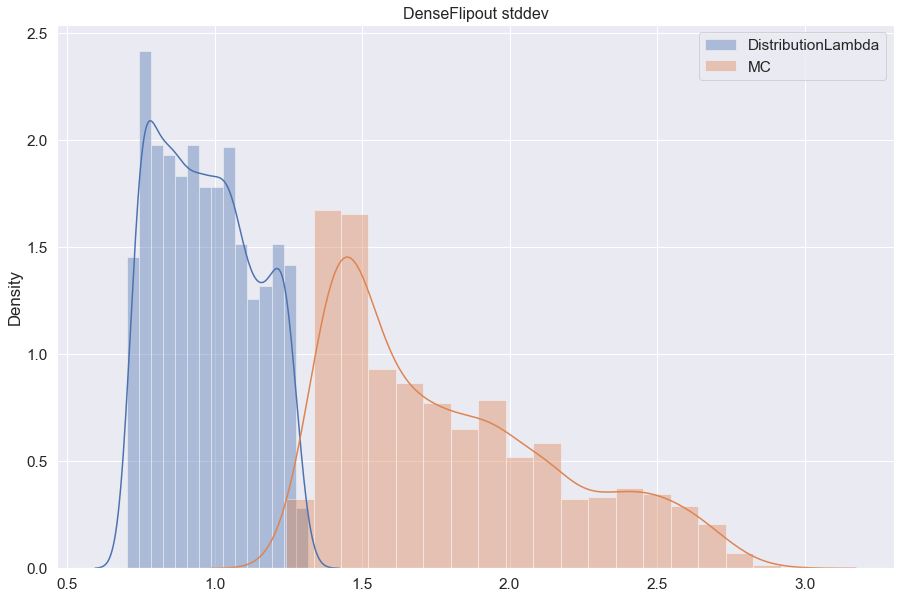

In [154]:
plt.figure(figsize=(15, 10))
sns.distplot(yhat.stddev(),label="DistributionLambda")
sns.distplot(np.std(np.array(predictions), axis=0), label= "MC")
plt.title("DenseFlipout stddev",size = 16 )
plt.legend()
#plt.savfig("DenseFlipout_stddev.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

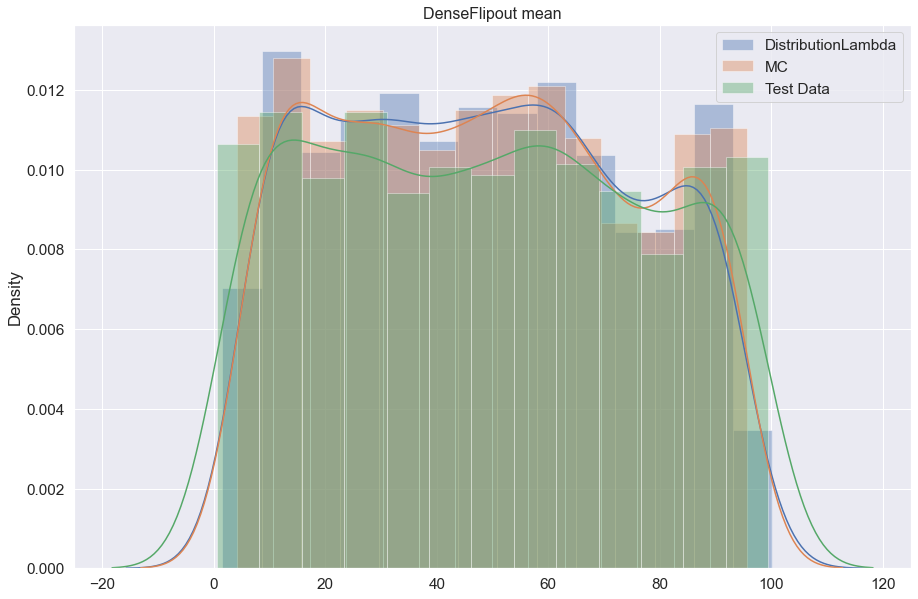

In [155]:
plt.figure(figsize=(15, 10))
sns.distplot(yhat.mean(),label="DistributionLambda")
sns.distplot(np.mean(np.array(predictions), axis=0), label= "MC")
sns.distplot(y_test, label= "Test Data")
plt.title("DenseFlipout mean",size = 16 )
plt.legend()
#plt.savfig("DenseFlipout_mean.png")

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

Estimated coefficients:
b_0 = -3.4400391769299574         
b_1 = 1.0778448147466124


/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

Estimated coefficients:
b_0 = -3.614336497629786         
b_1 = 1.0824598143706285


/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

Estimated coefficients:
b_0 = -3.424278332622684         
b_1 = 1.0791406500482206


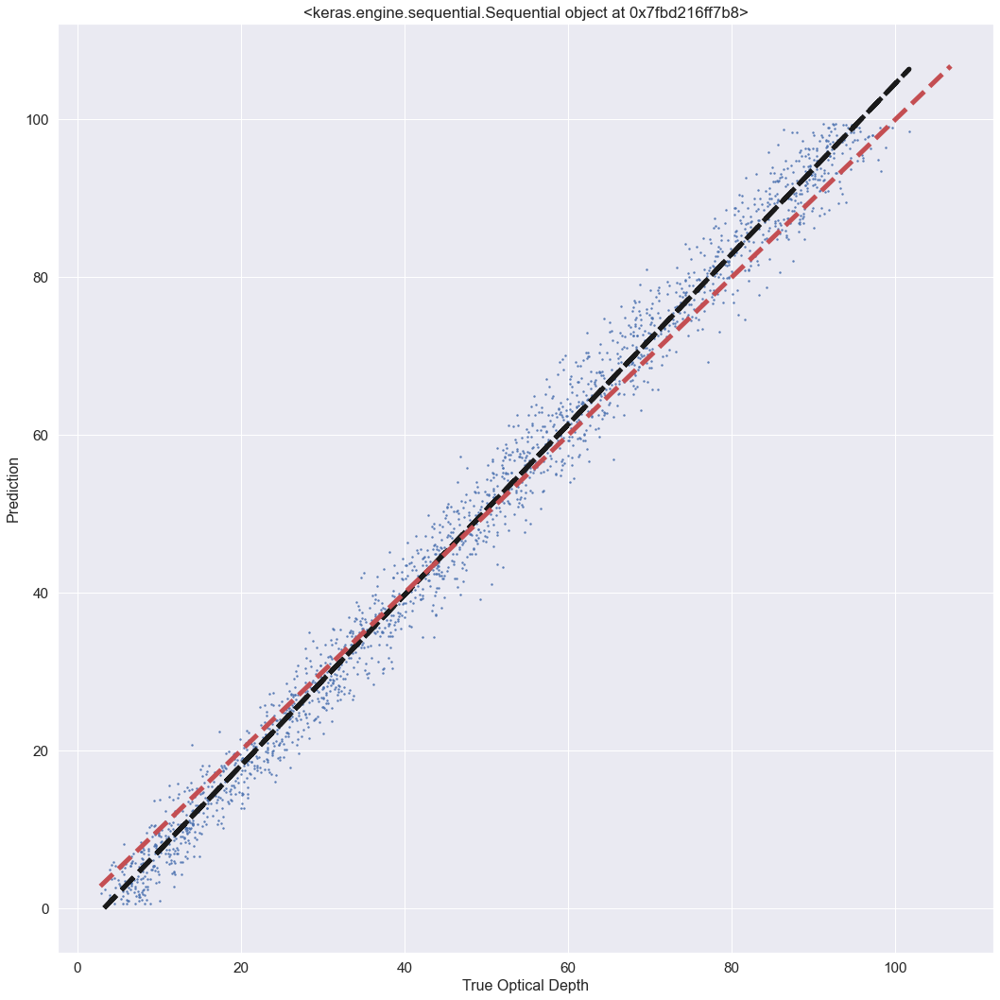

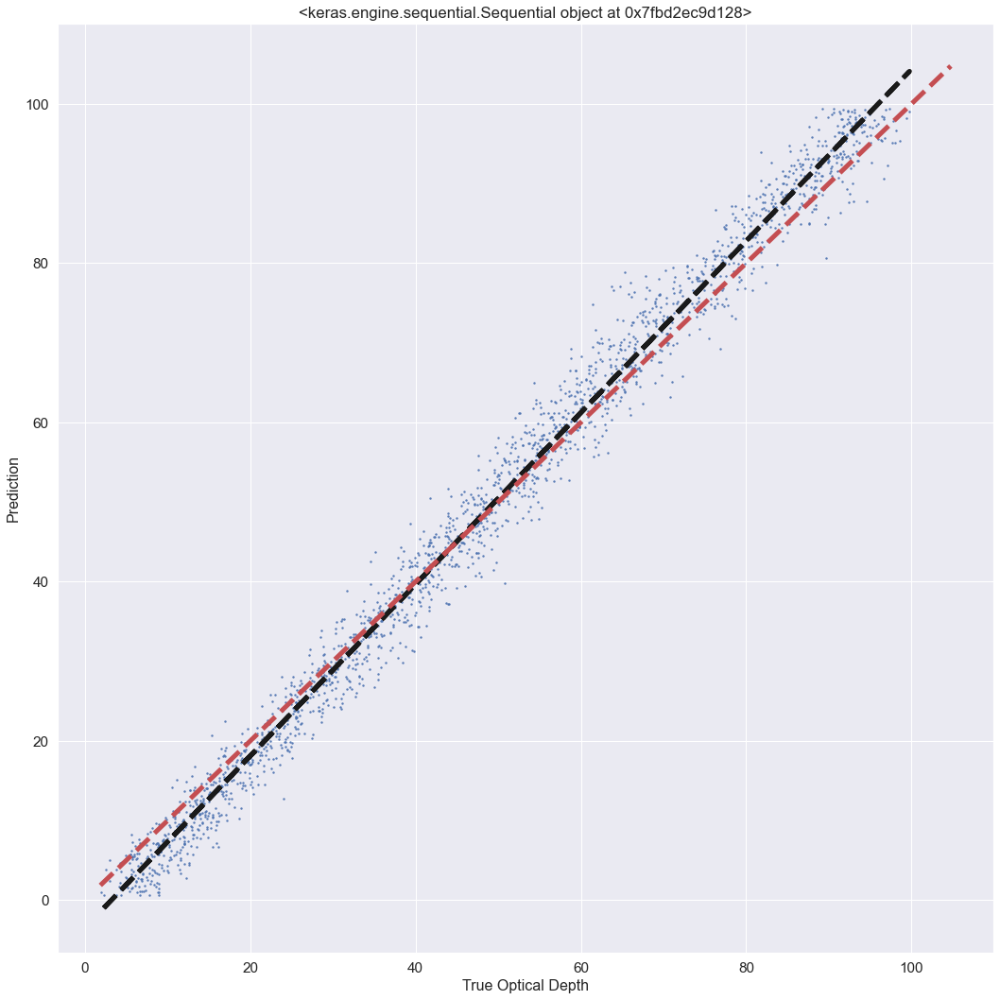

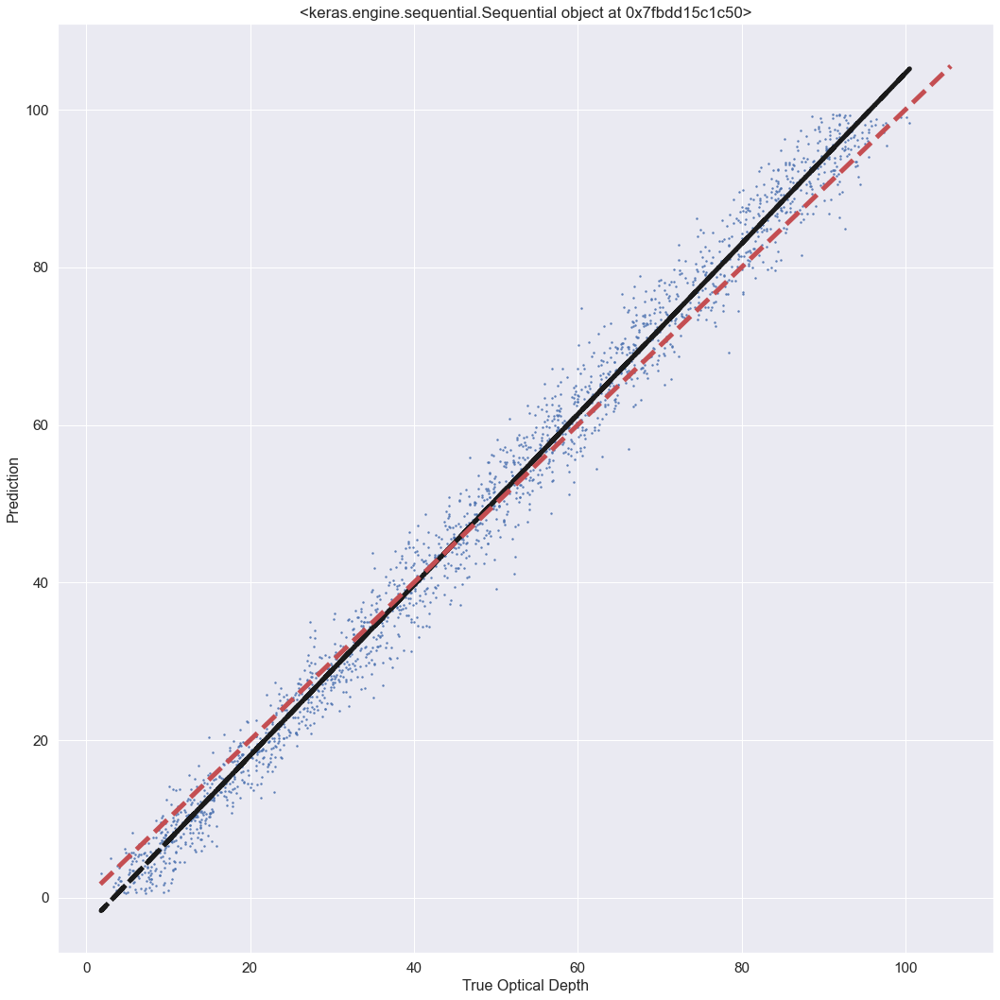

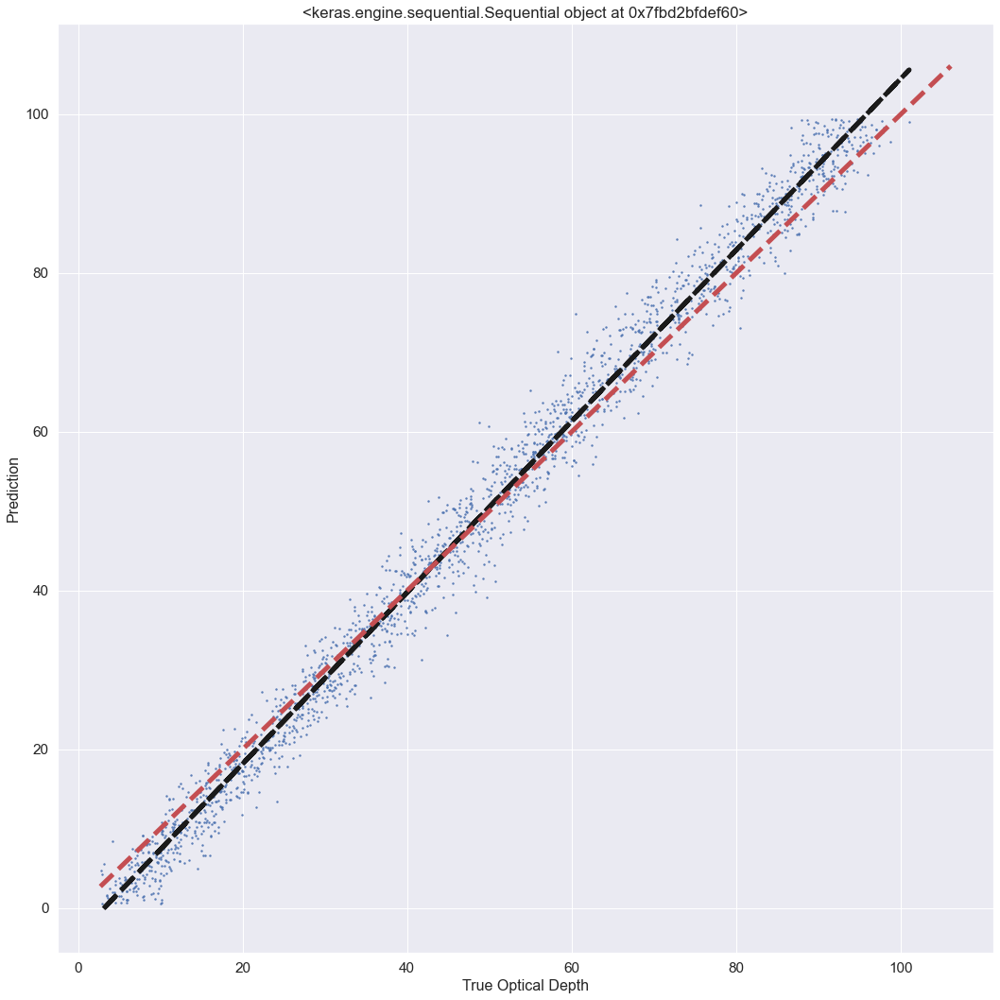

In [156]:
coefficients = []

fp = open(outputdir+"bestmodel_estimated_coefficients_1.log", 'w+')
fp.write("b_0, b_1 \n")

if __name__ == "__main__":

    for p in np.arange(len(tuner.get_best_models(num_models=20))):
        main(x=np.array(predictions)[p], y=y_test, labelname=str(tuner.get_best_models(num_models=15)[p-1]))
    fp.close()

# Empirical Examination of Posterior Distribution

In [157]:
bnn_model = tuner.get_best_models(num_models=1)[0]
sns.set(font_scale=1.4)
def plot_weight_posteriors(names, qm_vals, qs_vals):
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(1, 2, 1)
    for n, qm in zip(names, qm_vals):
        sns.distplot(tf.reshape(qm, shape=[-1]), ax=ax, label=n)
    ax.set_title("weight means",size = 16 )
    ax.set_xlim([-1.5, 1.5])
    ax.legend()
    ax = fig.add_subplot(1, 2, 2)
    for n, qs in zip(names, qs_vals):
        sns.distplot(tf.reshape(qs, shape=[-1]), ax=ax)
    ax.set_title("weight stddevs", size = 16)
    ax.set_xlim([0, 1.0])
    fig.tight_layout()
    plt.savefig("empirical_examination_DistributionLambda.png")#show()

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/keras/engine/base_layer.py:2223: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_flipout (Conv2DFlipou (None, 30, 30, 32)        608       
_________________________________________________________________
batch_normalization (BatchNo (None, 30, 30, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_flipout_1 (Conv2DFlip (None, 13, 13, 28)        16156     
_________________________________________________________________
batch_normalization_1 (Batch (None, 13, 13, 28)        112       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 28)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1008)              0

/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tashaleebillings/anaconda3/envs/hp_opt/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use e

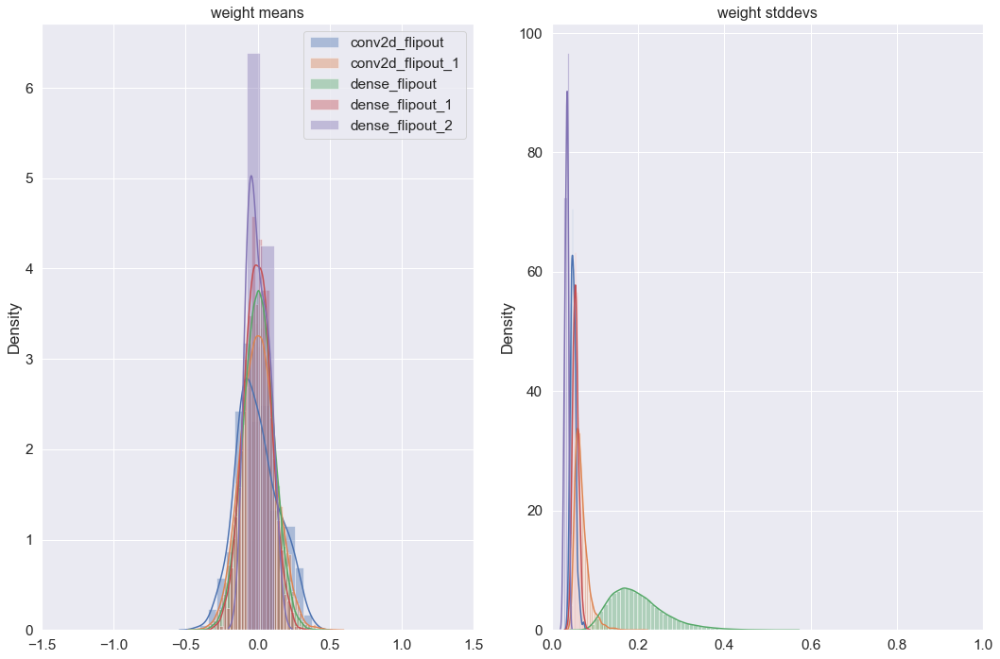

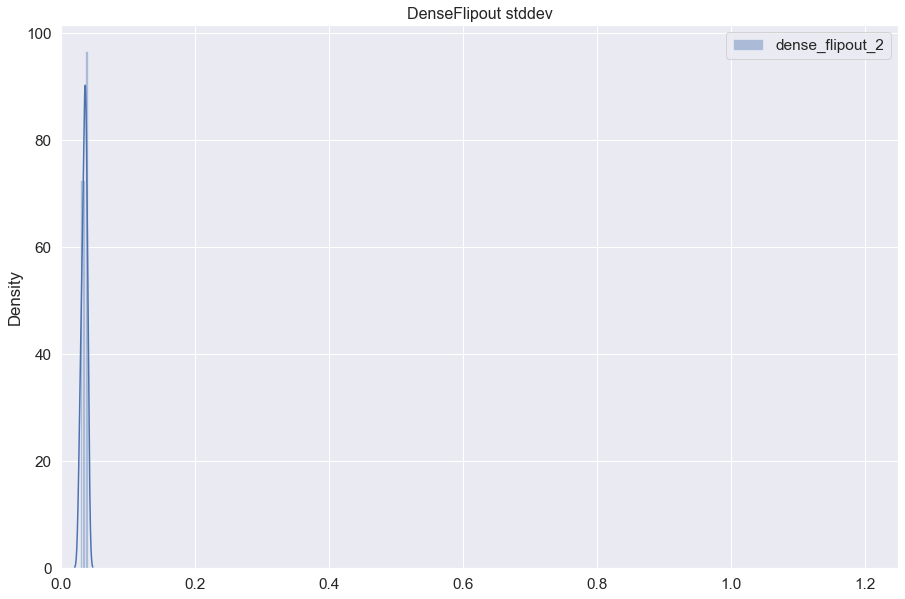

In [158]:
names = [layer.name for layer in bnn_model.layers if "flipout" in layer.name]
qm_vals = [
    layer.kernel_posterior.mean()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]
qs_vals = [
    layer.kernel_posterior.stddev()
    for layer in bnn_model.layers
    if "flipout" in layer.name
]

plot_weight_posteriors(names, qm_vals, qs_vals)

plt.figure(figsize=(15, 10))
sns.distplot(tf.reshape(bnn_model.layers[-1].kernel_posterior.stddev(), shape=[-1]),
             label="{}".format(str(bnn_model.layers[-1].name)))
plt.title("DenseFlipout stddev",size = 16 )
plt.xlim([0, 1.25])
plt.legend()
#plt.savefig("DenseFlipout_stddev_DistributionLambda.png")

### Empirical Examination of Posterior Distribution